In [134]:
%reload_ext autoreload
%autoreload 2
import pandas as pd
import os
import torch
from torch.utils.data import ConcatDataset,Dataset, DataLoader, random_split
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from analysis import Metrics, epoch_metrics, cap_distance, error_calc, calculate_snr
import numpy as np
import copy
import matplotlib.pyplot as plt
from scalers import inverse_minmax_norm, scaler_y_charge_mm_B0005, scaler_y_charge_mm_B0006, scaler_y_charge_mm_B0007, scaler_y_dis_mm_B0005, scaler_y_dis_mm_B0006, scaler_y_dis_mm_B0007, scaler_y_comb_mm_B0005, scaler_y_comb_mm_B0006, scaler_y_comb_mm_B0007, xData_comb_B0005, yData_comb_B0005, xData_comb_B0006, yData_comb_B0006, xData_comb_B0007, yData_comb_B0007, xData_B0005, yData_B0005, xData_B0006, yData_B0006, xData_B0007, yData_B0007, xData_dis_B0005, yData_dis_B0005, xData_dis_B0006, yData_dis_B0006, xData_dis_B0007, yData_dis_B0007
from scalers import inverse_standard_scaler, scaler_y_charge_std_B0005, scaler_y_charge_std_B0006, scaler_y_charge_std_B0007, scaler_y_dis_std_B0005, scaler_y_dis_std_B0006,scaler_y_dis_std_B0007,  scaler_y_comb_std_B0005, scaler_y_comb_std_B0006, scaler_y_comb_std_B0007, xData_std_B0005, yData_std_B0005, xData_std_B0006, yData_std_B0006, xData_std_B0007, yData_std_B0007, xData_dis_std_B0005, yData_dis_std_B0005, xData_dis_std_B0006, yData_dis_std_B0006, xData_dis_std_B0007, yData_dis_std_B0007, xData_comb_std_B0005, yData_comb_std_B0005, xData_comb_std_B0006, yData_comb_std_B0006, xData_comb_std_B0007, yData_comb_std_B0007


Load CSV Files into Pandas DataFrames and convert to numpy arrays.

df > numpy > tensor

In [135]:
def load_and_transform(file_path):
    """
    Loads a CSV file and transforms it into a PyTorch tensor.
    
    Parameters:
    file_path (str): Path to the CSV file.
    
    Returns:
    torch.Tensor: Data from the CSV file as a PyTorch tensor.
    """
    data = pd.read_csv(file_path, header=None).to_numpy()
    tensor = torch.tensor(data, dtype=torch.float32)
    return tensor


In [136]:
# Directory where the split data files are saved
data_dir = '3. Split data'

# List of file prefixes for each dataset
datasets = [
    'B0005_charge_mm', 'B0005_charge_std', 'B0005_charge_rob',
    'B0005_discharge_mm', 'B0005_discharge_std', 'B0005_discharge_rob',
    'B0005_combined_mm', 'B0005_combined_std', 'B0005_combined_rob',
    'B0006_charge_mm', 'B0006_charge_std', 'B0006_charge_rob',
    'B0006_discharge_mm', 'B0006_discharge_std', 'B0006_discharge_rob',
    'B0006_combined_mm', 'B0006_combined_std', 'B0006_combined_rob',
    'B0007_charge_mm', 'B0007_charge_std', 'B0007_charge_rob',
    'B0007_discharge_mm', 'B0007_discharge_std', 'B0007_discharge_rob',
    'B0007_combined_mm', 'B0007_combined_std', 'B0007_combined_rob',
    'B0018_charge_mm', 'B0018_charge_std', 'B0018_charge_rob',
    'B0018_discharge_mm', 'B0018_discharge_std', 'B0018_discharge_rob',
    'B0018_combined_mm', 'B0018_combined_std', 'B0018_combined_rob'
]

# Initialize dictionaries to hold tensors
X_train_tensors = {}
X_test_tensors = {}
y_train_tensors = {}
y_test_tensors = {}

# Load and transform each dataset
for dataset in datasets:
    X_train_tensors[dataset] = load_and_transform(os.path.join(data_dir, f'{dataset}_X_train.csv'))
    X_test_tensors[dataset] = load_and_transform(os.path.join(data_dir, f'{dataset}_X_test.csv'))
    y_train_tensors[dataset] = load_and_transform(os.path.join(data_dir, f'{dataset}_y_train.csv'))
    y_test_tensors[dataset] = load_and_transform(os.path.join(data_dir, f'{dataset}_y_test.csv'))

# Example: Accessing a specific dataset tensor
print(X_train_tensors['B0005_charge_mm'])
print(y_train_tensors['B0005_charge_mm'])


tensor([[0.8771, 0.8854, 0.8833,  ..., 0.4092, 0.4091, 0.4089],
        [0.0380, 0.0405, 0.0419,  ..., 0.7788, 0.7773, 0.7760],
        [0.0275, 0.0305, 0.0315,  ..., 0.8233, 0.8221, 0.8203],
        ...,
        [0.7889, 0.8215, 0.7884,  ..., 0.7330, 0.7331, 0.7332],
        [0.7900, 0.8226, 0.7895,  ..., 0.7506, 0.7508, 0.7508],
        [0.7934, 0.8261, 0.7931,  ..., 0.6882, 0.6881, 0.6882]])
tensor([[1.0000],
        [0.9821],
        [0.9629],
        [0.9627],
        [0.9616],
        [0.9634],
        [0.9625],
        [0.9460],
        [0.9443],
        [0.9440],
        [0.9440],
        [0.9257],
        [0.9249],
        [0.9244],
        [0.9053],
        [0.9044],
        [0.9053],
        [0.9061],
        [0.9056],
        [0.9834],
        [0.9841],
        [0.9643],
        [0.9460],
        [0.9449],
        [0.9457],
        [0.9254],
        [0.9267],
        [0.9253],
        [0.9056],
        [0.9079],
        [0.9918],
        [0.9547],
        [0.9357],
        

Data Preperation for Training

Create a Custom PyTorch Dataset and DataLoader.

Data Loader Class is used to loaddata in batches and shuffle the data.

Shuffling the data prevents overfitting, so the model doesn't learn the order of the training data, which could lead to overfitting. It also improves gradient descent, in which it can lead to more robust gradient estimates. 

Tensor is reshaped so that each input row of 1x30 is transformed to a matrix of 3x10

In [137]:
data_length = 10 # you'll need to update its value in "2. Data Preprocessing.ipynb"
class BatteryDataset(Dataset):
    def __init__(self, x_data, y_data, sequence_length=10):
        self.sequence_length = sequence_length                          # Added for LSTM only
        self.num_sequences = x_data.shape[0] - sequence_length + 1      # Added for LSTM only
        
        if isinstance(x_data, np.ndarray):
            self.x_data = torch.tensor(x_data, dtype=torch.float32)
        else:
            self.x_data = x_data.clone().detach().float()
        
        if isinstance(y_data, np.ndarray):
            self.y_data = torch.tensor(y_data, dtype=torch.float32)
        else:
            self.y_data = y_data.clone().detach().float()
    
    def __len__(self):
        return self.num_sequences
    
    def __getitem__(self, idx):
        x = self.x_data[idx:idx + self.sequence_length].view(self.sequence_length, 3, data_length) #or 3*data_length     # [:idx + self.sequence_length] and [view(self.sequence_length,]
        y = self.y_data[idx:idx + self.sequence_length]                                         # Sequence of targets
        return x, y
    
class BatteryDataset_combined(Dataset):
    def __init__(self, x_data, y_data, sequence_length=10):             # Sequence_length=10
        self.sequence_length = sequence_length                          # Added for LSTM only
        self.num_sequences = x_data.shape[0] - sequence_length + 1      # Added for LSTM only
        
        if isinstance(x_data, np.ndarray):
            self.x_data = torch.tensor(x_data, dtype=torch.float32)
        else:
            self.x_data = x_data.clone().detach().float()
        
        if isinstance(y_data, np.ndarray):
            self.y_data = torch.tensor(y_data, dtype=torch.float32)
        else:
            self.y_data = y_data.clone().detach().float()
    
    def __len__(self):
        return self.num_sequences
    
    def __getitem__(self, idx):
        x = self.x_data[idx:idx + self.sequence_length].view(self.sequence_length, 6, data_length)
        y = self.y_data[idx:idx + self.sequence_length]                 # Sequence of targets
        return x, y

Create Datasets

In [138]:
# Initialize dictionaries to hold dataset instances
train_datasets = {}
test_datasets = {}

# Instantiate BatteryDataset and BatteryDataset_combined for each dataset
for dataset in datasets:
    if 'combined' in dataset:
        train_datasets[dataset] = BatteryDataset_combined(X_train_tensors[dataset], y_train_tensors[dataset])
        test_datasets[dataset] = BatteryDataset_combined(X_test_tensors[dataset], y_test_tensors[dataset])
    else:
        train_datasets[dataset] = BatteryDataset(X_train_tensors[dataset], y_train_tensors[dataset])
        test_datasets[dataset] = BatteryDataset(X_test_tensors[dataset], y_test_tensors[dataset])

# Example: Accessing a specific dataset instance
print(train_datasets['B0005_charge_mm'])
print(test_datasets['B0005_charge_mm'])

Split Test Data into Testing and Validation Sets.

In [139]:
# # Function to split test data into test and validation sets
def split_test_data(test_dataset, scale=0.5):
    """
    Splits the test dataset into validation and test sets based on the provided scale,
    with the validation set being the first part of the dataset.

    Parameters:
    test_dataset (Dataset): The test dataset to be split.
    scale (float): The proportion of the test dataset to use for the test set.

    Returns:
    Dataset: The split validation dataset (first part).
    Dataset: The split test dataset (second part).
    """
    val_size = int(scale * len(test_dataset))
    test_size = len(test_dataset) - val_size
    
    # Split the dataset while preserving the order
    val_data = torch.utils.data.Subset(test_dataset, range(val_size))  # First part for validation
    test_data = torch.utils.data.Subset(test_dataset, range(val_size, len(test_dataset)))  # Second part for test
    
    return val_data, test_data

# Initialize dictionaries to hold test and validation datasets
test_val_datasets = {}

# Split test data into validation and test sets
for dataset in datasets:
    val_data, test_data = split_test_data(test_datasets[dataset])  # Order-preserving split, with validation first
    test_val_datasets[f'{dataset}_test'] = test_data
    test_val_datasets[f'{dataset}_val'] = val_data

# Example: Accessing a specific test and validation dataset
print(test_val_datasets['B0005_charge_mm_test'])
print(test_val_datasets['B0005_charge_mm_val'])



Create DataLoaders.

In [140]:
batch_size = 5
data_loaders = {}

for dataset in datasets:
    train_loader = DataLoader(train_datasets[dataset], batch_size=batch_size, shuffle=True)
    test_loader = DataLoader(test_val_datasets[f'{dataset}_test'], batch_size=batch_size, shuffle=False)
    val_loader = DataLoader(test_val_datasets[f'{dataset}_val'], batch_size=batch_size, shuffle=False)
    
    # Combine train, validation, and test datasets
    combined_dataset = ConcatDataset([train_datasets[dataset], test_val_datasets[f'{dataset}_val'], test_val_datasets[f'{dataset}_test']])
    
    # Create a DataLoader for the combined dataset
    final_test_loader = DataLoader(combined_dataset, batch_size=batch_size, shuffle=False)
    
    data_loaders[f'{dataset}_train_loader'] = train_loader
    data_loaders[f'{dataset}_test_loader'] = test_loader
    data_loaders[f'{dataset}_final_test_loader'] = final_test_loader  # includes train, validation, and test data
    data_loaders[f'{dataset}_val_loader'] = val_loader

# Example: Accessing a specific data loader
print(data_loaders['B0005_charge_mm_train_loader'])
print(data_loaders['B0005_charge_mm_test_loader'])
print(data_loaders['B0005_charge_mm_val_loader'])
print(data_loaders['B0005_charge_mm_final_test_loader'])


Rename data loaders

In [141]:
# Charging Data Loaders
B0005_charge_mm_train_loader = data_loaders['B0005_charge_mm_train_loader']
B0005_charge_mm_test_loader = data_loaders['B0005_charge_mm_test_loader']
B0005_charge_mm_val_loader = data_loaders['B0005_charge_mm_val_loader']
B0005_charge_std_train_loader = data_loaders['B0005_charge_std_train_loader']
B0005_charge_std_test_loader = data_loaders['B0005_charge_std_test_loader']
B0005_charge_std_val_loader = data_loaders['B0005_charge_std_val_loader']
B0005_charge_rob_train_loader = data_loaders['B0005_charge_rob_train_loader']
B0005_charge_rob_test_loader = data_loaders['B0005_charge_rob_test_loader']
B0005_charge_rob_val_loader = data_loaders['B0005_charge_rob_val_loader']

B0006_charge_mm_train_loader = data_loaders['B0006_charge_mm_train_loader']
B0006_charge_mm_test_loader = data_loaders['B0006_charge_mm_test_loader']
B0006_charge_mm_val_loader = data_loaders['B0006_charge_mm_val_loader']
B0006_charge_std_train_loader = data_loaders['B0006_charge_std_train_loader']
B0006_charge_std_test_loader = data_loaders['B0006_charge_std_test_loader']
B0006_charge_std_val_loader = data_loaders['B0006_charge_std_val_loader']
B0006_charge_rob_train_loader = data_loaders['B0006_charge_rob_train_loader']
B0006_charge_rob_test_loader = data_loaders['B0006_charge_rob_test_loader']
B0006_charge_rob_val_loader = data_loaders['B0006_charge_rob_val_loader']

B0007_charge_mm_train_loader = data_loaders['B0007_charge_mm_train_loader']
B0007_charge_mm_test_loader = data_loaders['B0007_charge_mm_test_loader']
B0007_charge_mm_val_loader = data_loaders['B0007_charge_mm_val_loader']
B0007_charge_std_train_loader = data_loaders['B0007_charge_std_train_loader']
B0007_charge_std_test_loader = data_loaders['B0007_charge_std_test_loader']
B0007_charge_std_val_loader = data_loaders['B0007_charge_std_val_loader']
B0007_charge_rob_train_loader = data_loaders['B0007_charge_rob_train_loader']
B0007_charge_rob_test_loader = data_loaders['B0007_charge_rob_test_loader']
B0007_charge_rob_val_loader = data_loaders['B0007_charge_rob_val_loader']

B0018_charge_mm_train_loader = data_loaders['B0018_charge_mm_train_loader']
B0018_charge_mm_test_loader = data_loaders['B0018_charge_mm_test_loader']
B0018_charge_mm_val_loader = data_loaders['B0018_charge_mm_val_loader']
B0018_charge_std_train_loader = data_loaders['B0018_charge_std_train_loader']
B0018_charge_std_test_loader = data_loaders['B0018_charge_std_test_loader']
B0018_charge_std_val_loader = data_loaders['B0018_charge_std_val_loader']
B0018_charge_rob_train_loader = data_loaders['B0018_charge_rob_train_loader']
B0018_charge_rob_test_loader = data_loaders['B0018_charge_rob_test_loader']
B0018_charge_rob_val_loader = data_loaders['B0018_charge_rob_val_loader']

# Discharging Data Loaders
B0005_discharge_mm_train_loader = data_loaders['B0005_discharge_mm_train_loader']
B0005_discharge_mm_test_loader = data_loaders['B0005_discharge_mm_test_loader']
B0005_discharge_mm_val_loader = data_loaders['B0005_discharge_mm_val_loader']
B0005_discharge_std_train_loader = data_loaders['B0005_discharge_std_train_loader']
B0005_discharge_std_test_loader = data_loaders['B0005_discharge_std_test_loader']
B0005_discharge_std_val_loader = data_loaders['B0005_discharge_std_val_loader']
B0005_discharge_rob_train_loader = data_loaders['B0005_discharge_rob_train_loader']
B0005_discharge_rob_test_loader = data_loaders['B0005_discharge_rob_test_loader']
B0005_discharge_rob_val_loader = data_loaders['B0005_discharge_rob_val_loader']

B0006_discharge_mm_train_loader = data_loaders['B0006_discharge_mm_train_loader']
B0006_discharge_mm_test_loader = data_loaders['B0006_discharge_mm_test_loader']
B0006_discharge_mm_val_loader = data_loaders['B0006_discharge_mm_val_loader']
B0006_discharge_std_train_loader = data_loaders['B0006_discharge_std_train_loader']
B0006_discharge_std_test_loader = data_loaders['B0006_discharge_std_test_loader']
B0006_discharge_std_val_loader = data_loaders['B0006_discharge_std_val_loader']
B0006_discharge_rob_train_loader = data_loaders['B0006_discharge_rob_train_loader']
B0006_discharge_rob_test_loader = data_loaders['B0006_discharge_rob_test_loader']
B0006_discharge_rob_val_loader = data_loaders['B0006_discharge_rob_val_loader']

B0007_discharge_mm_train_loader = data_loaders['B0007_discharge_mm_train_loader']
B0007_discharge_mm_test_loader = data_loaders['B0007_discharge_mm_test_loader']
B0007_discharge_mm_val_loader = data_loaders['B0007_discharge_mm_val_loader']
B0007_discharge_std_train_loader = data_loaders['B0007_discharge_std_train_loader']
B0007_discharge_std_test_loader = data_loaders['B0007_discharge_std_test_loader']
B0007_discharge_std_val_loader = data_loaders['B0007_discharge_std_val_loader']
B0007_discharge_rob_train_loader = data_loaders['B0007_discharge_rob_train_loader']
B0007_discharge_rob_test_loader = data_loaders['B0007_discharge_rob_test_loader']
B0007_discharge_rob_val_loader = data_loaders['B0007_discharge_rob_val_loader']

B0018_discharge_mm_train_loader = data_loaders['B0018_discharge_mm_train_loader']
B0018_discharge_mm_test_loader = data_loaders['B0018_discharge_mm_test_loader']
B0018_discharge_mm_val_loader = data_loaders['B0018_discharge_mm_val_loader']
B0018_discharge_std_train_loader = data_loaders['B0018_discharge_std_train_loader']
B0018_discharge_std_test_loader = data_loaders['B0018_discharge_std_test_loader']
B0018_discharge_std_val_loader = data_loaders['B0018_discharge_std_val_loader']
B0018_discharge_rob_train_loader = data_loaders['B0018_discharge_rob_train_loader']
B0018_discharge_rob_test_loader = data_loaders['B0018_discharge_rob_test_loader']
B0018_discharge_rob_val_loader = data_loaders['B0018_discharge_rob_val_loader']

# Combined Charging and Discharging Data Loaders
B0005_combined_mm_train_loader = data_loaders['B0005_combined_mm_train_loader']
B0005_combined_mm_test_loader = data_loaders['B0005_combined_mm_test_loader']
B0005_combined_mm_val_loader = data_loaders['B0005_combined_mm_val_loader']
B0005_combined_std_train_loader = data_loaders['B0005_combined_std_train_loader']
B0005_combined_std_test_loader = data_loaders['B0005_combined_std_test_loader']
B0005_combined_std_val_loader = data_loaders['B0005_combined_std_val_loader']
B0005_combined_rob_train_loader = data_loaders['B0005_combined_rob_train_loader']
B0005_combined_rob_test_loader = data_loaders['B0005_combined_rob_test_loader']
B0005_combined_rob_val_loader = data_loaders['B0005_combined_rob_val_loader']

B0006_combined_mm_train_loader = data_loaders['B0006_combined_mm_train_loader']
B0006_combined_mm_test_loader = data_loaders['B0006_combined_mm_test_loader']
B0006_combined_mm_val_loader = data_loaders['B0006_combined_mm_val_loader']
B0006_combined_std_train_loader = data_loaders['B0006_combined_std_train_loader']
B0006_combined_std_test_loader = data_loaders['B0006_combined_std_test_loader']
B0006_combined_std_val_loader = data_loaders['B0006_combined_std_val_loader']
B0006_combined_rob_train_loader = data_loaders['B0006_combined_rob_train_loader']
B0006_combined_rob_test_loader = data_loaders['B0006_combined_rob_test_loader']
B0006_combined_rob_val_loader = data_loaders['B0006_combined_rob_val_loader']

B0007_combined_mm_train_loader = data_loaders['B0007_combined_mm_train_loader']
B0007_combined_mm_test_loader = data_loaders['B0007_combined_mm_test_loader']
B0007_combined_mm_val_loader = data_loaders['B0007_combined_mm_val_loader']
B0007_combined_std_train_loader = data_loaders['B0007_combined_std_train_loader']
B0007_combined_std_test_loader = data_loaders['B0007_combined_std_test_loader']
B0007_combined_std_val_loader = data_loaders['B0007_combined_std_val_loader']
B0007_combined_rob_train_loader = data_loaders['B0007_combined_rob_train_loader']
B0007_combined_rob_test_loader = data_loaders['B0007_combined_rob_test_loader']
B0007_combined_rob_val_loader = data_loaders['B0007_combined_rob_val_loader']

B0018_combined_mm_train_loader = data_loaders['B0018_combined_mm_train_loader']
B0018_combined_mm_test_loader = data_loaders['B0018_combined_mm_test_loader']
B0018_combined_mm_val_loader = data_loaders['B0018_combined_mm_val_loader']
B0018_combined_std_train_loader = data_loaders['B0018_combined_std_train_loader']
B0018_combined_std_test_loader = data_loaders['B0018_combined_std_test_loader']
B0018_combined_std_val_loader = data_loaders['B0018_combined_std_val_loader']
B0018_combined_rob_train_loader = data_loaders['B0018_combined_rob_train_loader']
B0018_combined_rob_test_loader = data_loaders['B0018_combined_rob_test_loader']
B0018_combined_rob_val_loader = data_loaders['B0018_combined_rob_val_loader']


Number of Batches and Samples

In [142]:
# Example: B0005 charge mm data
train_loader = B0005_charge_mm_train_loader
test_loader = B0005_charge_mm_test_loader
val_loader = B0005_charge_mm_val_loader

# Print the lengths of the datasets
print(f'Number of batches in B0005_charge_mm_train_loader: {len(train_loader)}')
print(f'Number of batches in B0005_charge_mm_test_loader: {len(test_loader)}')
print(f'Number of batches in B0005_charge_mm_val_loader: {len(val_loader)}')

# Print the number of samples in the datasets
print(f'Number of samples in B0005_charge_mm_train_loader: {len(train_loader.dataset)}')
print(f'Number of samples in B0005_charge_mm_test_loader: {len(test_loader.dataset)}')
print(f'Number of samples in B0005_charge_mm_val_loader: {len(val_loader.dataset)}')


Number of batches in B0005_charge_mm_train_loader: 22
Number of batches in B0005_charge_mm_test_loader: 5
Number of batches in B0005_charge_mm_val_loader: 5
Number of samples in B0005_charge_mm_train_loader: 108
Number of samples in B0005_charge_mm_test_loader: 21
Number of samples in B0005_charge_mm_val_loader: 21


Plot Losses and Metrics Functions

In [143]:
def plot_results(num_epochs, train_losses, val_losses, val_distances):
   epochs = range(1, num_epochs + 1)
   # Plotting all the losses
   plt.figure(figsize=(12, 6))
 
   plt.scatter(epochs, train_losses, label='Training Loss')
   plt.scatter(epochs, val_losses, label='Validation Loss', color='orange')
   plt.xlabel('Epochs')
   plt.ylabel('Loss')
   plt.legend()
   plt.title('Loss')
   plt.tight_layout()
   plt.show()
 
   # Plotting all the distances
   plt.figure(figsize=(12, 6))
 
   plt.scatter(epochs, val_distances, label='Validation Distance', color='green')
   plt.xlabel('Epochs')
   plt.ylabel('Distance')
   plt.legend()
   plt.title('Average Absolute Capacity Distance')
   plt.tight_layout()
   plt.show()
 
 
def plot_metrics(num_epochs, metrics):
    epochs = range(1, num_epochs + 1)
   
    # Create a figure with a 2x2 grid of subplots
    fig, axes = plt.subplots(2, 2, figsize=(12, 6))
    axes = axes.flatten()  # Flatten the 2D array of axes for easy iteration
 
    for i, (metric, values) in enumerate(metrics.items()):
        axes[i].plot(epochs, values, label=metric)
        axes[i].set_xlabel('Epochs')
        axes[i].set_ylabel('Value')
        axes[i].set_title(f'{metric} over Epochs')
        axes[i].legend()
   
    plt.tight_layout()
    plt.show()

LSTM Architecture.

In [144]:
class LSTM_Model(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim, num_layers=1):
        super(LSTM_Model, self).__init__()
        self.hidden_dim = hidden_dim
        self.num_layers = num_layers

        self.lstm = nn.LSTM(input_dim, hidden_dim, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_dim, output_dim)  # Fully connected layer to output the final prediction
        self.layer_norm = nn.LayerNorm(hidden_dim)
    
    def forward(self, x):
        batch_size, seq_len, channels, width = x.size() 
        x = x.view(batch_size, seq_len, -1)  # Flatten the input except the batch and sequence dimensions

        h0 = torch.zeros(self.num_layers, batch_size, self.hidden_dim).to(x.device)  # Initial hidden state
        c0 = torch.zeros(self.num_layers, batch_size, self.hidden_dim).to(x.device)  # Initial cell state

        lstm_out, _ = self.lstm(x, (h0, c0))  # LSTM output
        lstm_out = self.layer_norm(lstm_out)

        # Apply fully connected layer to each time step
        lstm_out = lstm_out.contiguous().view(-1, self.hidden_dim)  # Flatten for the fully connected layer
        fc_out = self.fc(lstm_out)
        out = fc_out.view(batch_size, seq_len, -1)  # Reshape back to (batch_size, seq_len, output_dim)

        return out

def LSTM(input_shape):
    # seq_len = 10
    input_dim = input_shape[0] * input_shape[1]  # Combine the input channels and width for LSTM input dimension
    hidden_dim = 128  # Number of features in hidden state
    output_dim = 1  # Assuming we want a single output per time step
    model = LSTM_Model(input_dim, hidden_dim, output_dim)
    return model


In [343]:
class LSTM_Model_2(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim, num_layers=1, dropout=0.5):
        super(LSTM_Model_2, self).__init__()
        self.hidden_dim = hidden_dim
        self.num_layers = num_layers

        # LSTM layer with dropout
        self.lstm = nn.LSTM(input_dim, hidden_dim, num_layers, batch_first=True, dropout=dropout)
        
        # Fully connected layer to output the final prediction
        self.fc = nn.Linear(hidden_dim, output_dim)
        
        # Layer normalization
        self.layer_norm = nn.LayerNorm(hidden_dim)
        
        # Dropout for regularization
        self.dropout = nn.Dropout(dropout)
    
    def forward(self, x):
        batch_size, seq_len, channels, width = x.size()
        
        # Flatten the input except the batch and sequence dimensions
        x = x.view(batch_size, seq_len, -1)
        
        # Initialize hidden state and cell state with zeros
        h0 = torch.zeros(self.num_layers, batch_size, self.hidden_dim).to(x.device)
        c0 = torch.zeros(self.num_layers, batch_size, self.hidden_dim).to(x.device)
        
        # LSTM forward pass
        lstm_out, _ = self.lstm(x, (h0, c0))
        
        # Apply layer normalization
        lstm_out = self.layer_norm(lstm_out)
        
        # Flatten for the fully connected layer
        lstm_out = lstm_out.contiguous().view(-1, self.hidden_dim)
        
        # Fully connected layer to generate output
        fc_out = self.fc(lstm_out)
        
        # Optional: Apply dropout (if necessary)
        # out = self.dropout(fc_out)
        
        # Reshape back to (batch_size, seq_len, output_dim)
        out = fc_out.view(batch_size, seq_len, -1)
        
        return out
    
def LSTM_2(input_shape):
    seq_len = 10
    input_dim = input_shape[0] * input_shape[1]  # Combine the input channels and width for LSTM input dimension
    hidden_dim = 128  # Number of features in hidden state
    output_dim = 1  # Assuming we want a single output per time step
    model = LSTM_Model_2(input_dim, hidden_dim, output_dim)
    return model

Training Function

Instantiate the model, define the loss and the optimizer.

In [358]:
def train(val_loader, train_loader, model):
    # Define the loss function and optimizer
    criterion = nn.MSELoss()  # Mean Square Error for regression tasks.
    # criterion = nn.L1Loss() # Mean Square Error for regression tasks.

    optimizer = optim.Adam(model.parameters(), lr=0.001)  # ADAM optimizer.
    # optimizer = optim.SGD(model.parameters(), lr= 0.001)
    patience = 15  # if the model stopped learning, it will wait on it for 15 more epochs
    best_loss = float('inf')
    
    # Learning rate scheduler that reduces the learning rate when a metric has stopped improving
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.2, patience=25)
    
    device = 'cpu'  # Set device to CPU
    
    # Initialize lists to store training and validation losses, distances, and accuracies
    num_epochs = 120  # Number of epochs to train.
    train_losses = []
    val_losses = []
    val_distances = []
    accuracies = []
    metrics_history = {'MAE': [], 'MSE': [], 'RMSE': [], 'R-squared': [], 'SNR': []}
    
    for epoch in range(num_epochs):
        model.train()  # Set the model to training mode.
        running_loss = 0.0  # Initialize running loss for the epoch
        
        # Training Loop
        for x_batch, y_batch in train_loader:  # Iterate over batches in the training loader
            x_batch = x_batch.to(device)  # Move inputs to device
            y_batch = y_batch.to(device)  # Move targets to device
            optimizer.zero_grad()  # Zero the parameter gradients
            
            outputs = model(x_batch)  # Forward pass
            loss = criterion(outputs, y_batch)  # Compute the loss
            loss.backward()  # Backward pass to compute gradients
            optimizer.step()  # Update the model parameters
            
            running_loss += loss.item()  # Accumulate the running loss

        train_loss = running_loss / len(train_loader)  # Calculate average training loss
        train_losses.append(train_loss)  # Append training loss to list

        # Validation Loop
        model.eval()  # Set the model to evaluation mode
        validation_loss = 0.0  # Initialize validation loss
        total_distance = 0.0  # Initialize total distance
        counter = 0.0  # Initialize counter for accuracy calculation
        Error = 0.0  # Initialize custom error metric
        metrics = {'MAE': 0.0, 'MSE': 0.0, 'RMSE': 0.0, 'R-squared': 0.0, 'SNR': 0.0, 'count': 0}
        
        with torch.no_grad():  # Disable gradient calculation
            for x_val, y_val in val_loader:  # Iterate over batches in the validation loader
                x_val = x_val.to(device)  # Move inputs to device
                y_val = y_val.to(device)  # Move targets to device
                
                result = model(x_val)  # Forward pass
                loss_val = criterion(result, y_val)  # Compute validation loss
                
                validation_loss += loss_val.item()  # Accumulate validation loss
                d, c = cap_distance(result[:, -1, :], y_val[:, -1, :])  # Compute distance and count within tolerance
                Error += error_calc(result[:, -1, :], y_val[:, -1, :])  # Accumulate custom error metric
                total_distance += d.item()  # Accumulate total distance
                counter += c  # Accumulate count within tolerance
                Metrics(metrics, result[:, -1, :], y_val[:, -1, :])  # Accumulate other metrics

        avg_val_loss = validation_loss / len(val_loader)  # Calculate average validation loss
        avg_val_distance = total_distance / len(val_loader)  # Calculate average validation distance
        accuracy = 100 * (counter / len(val_loader.dataset))  # Calculate accuracy based on tolerance
        Error /= len(val_loader)  # Average the custom error metric
        val_losses.append(avg_val_loss)  # Append validation loss to list
        val_distances.append(avg_val_distance)  # Append validation distance to list
        accuracies.append(accuracy)  # Append accuracy to list

        # Calculate SNR for the epoch
        snr = calculate_snr(y_val.cpu().numpy(), (y_val - result).cpu().numpy())
        metrics['SNR'] += snr * len(val_loader)
        metrics['count'] += len(val_loader)
        metrics_history['SNR'].append(snr)
        
        # Step the learning rate scheduler
        scheduler.step(avg_val_loss)
        
        # Print epoch statistics
        print(f"Epoch {epoch + 1}/{num_epochs}, Training Loss: {train_loss:.4f}, Validation Loss: {avg_val_loss:.4f}\n"
              f"Validation Distance: {avg_val_distance:.4f}, Validation Accuracy: {accuracy:.4f}, SNR: {snr:.4f}")
           
        epoch_metric = epoch_metrics(metrics)  # Calculate and print epoch metrics
        # Early stopping and saving the best model
        if avg_val_loss < best_loss:
            best_loss = avg_val_loss
            best_model_wts = copy.deepcopy(model.state_dict())
            no_improvement_counter = 0
        else:
            no_improvement_counter += 1
            if no_improvement_counter >= patience:
                print("Early stopping triggered")
                num_epochs = epoch + 1
                break

    # Load the best model weights
    model.load_state_dict(best_model_wts)
    plot_results(num_epochs,train_losses,val_losses,val_distances)
    # plot_metrics(num_epochs,metrics_history)
    return model, train_losses ,val_losses ,val_distances,metrics_history
 

Testing function.

In [147]:
def test(model, test_loader):
    # Testing Loop
    device = 'cpu'
    model.to(device)
    model.eval()
    criterion = nn.MSELoss()  # Mean Squared Error for regression tasks
    
    # Initialize validation loss and other metrics
    validation_loss = 0.0  # Initialize validation loss
    total_distance = 0.0  # Initialize total distance
    counter = 0.0  # Initialize counter for accuracy calculation
    Error = 0.0  # Initialize custom error metric
    metrics = {'MAE': 0.0, 'MSE': 0.0, 'RMSE': 0.0, 'R-squared': 0.0, 'SNR': 0.0, 'count': 0}
    
    y_testresult = []
    y_target = []
    
    with torch.no_grad():
        test_loss = 0
        for x_batch, y_batch in test_loader:
            x_batch = x_batch.to(device)
            y_batch = y_batch.to(device)
            
            y_target.append(y_batch[:, -1, :])  # to plot
            result = model(x_batch)  # Forward pass
            y_testresult.append(result[:, -1, :])  # to plot
            loss = criterion(result, y_batch)
            test_loss += loss.item()
            
            d, c = cap_distance(result[:, -1, :], y_batch[:, -1, :])  # Compute distance and count within tolerance
            Error += error_calc(result[:, -1, :], y_batch[:, -1, :])  # Accumulate custom error metric
            total_distance += d.item()  # Accumulate total distance
            counter += c  # Accumulate count within tolerance
            Metrics(metrics, result[:, -1, :], y_batch[:, -1, :])  # Accumulate other metrics

        avg_test_loss = test_loss / len(test_loader)  # Calculate average validation loss
        avg_test_distance = total_distance / len(test_loader)  # Calculate average validation distance
        accuracy = 100 * (counter / len(test_loader.dataset))  # Calculate accuracy based on tolerance
        Error /= len(test_loader)  # Average the custom error metric
        
        # Calculate SNR for the testing phase
        y_val = torch.cat(y_target, dim=0)
        y_result = torch.cat(y_testresult, dim=0)
        snr = calculate_snr(y_val.cpu().numpy(), (y_val - y_result).cpu().numpy())
        metrics['SNR'] = snr
        
        # Print test statistics
        print(f"Test Loss: {avg_test_loss:.4f}, Test Distance: {avg_test_distance:.4f}, Test Accuracy: {accuracy:.4f}, SNR: {snr:.4f}")

        epoch_metric = epoch_metrics(metrics)  # Calculate and print epoch metrics
    
    return y_target, y_testresult


To flatten test results

In [148]:
def flatten_and_concatenate(nested_tensors):
    """
    Flattens and concatenates a list of nested tensors into a single tensor.

    Parameters:
    nested_tensors (list of torch.Tensor): A list of tensors to be flattened and concatenated.

    Returns:
    torch.Tensor: A single tensor containing all the values from the nested tensors, flattened and concatenated.
    """
    flattened_tensors = [t.flatten() for t in nested_tensors]
    concatenated_tensor = torch.cat(flattened_tensors)
    return concatenated_tensor

Plot results

In [149]:
def plot_tensors(tensor1, tensor2, labels=["Tensor 1", "Tensor 2"], title="Tensor Comparison Plot", file_name="", ylabel="Value", save_dir=None):
    """
    Plots two given tensors for comparison and saves the plot as a PDF if a save directory is provided.
    
    Parameters:
    tensor1 (torch.Tensor): The first tensor to plot.
    tensor2 (torch.Tensor): The second tensor to plot.
    labels (list of str): The labels for the tensors. Default is ["Tensor 1", "Tensor 2"].
    title (str): The title of the plot. Default is "Tensor Comparison Plot".
    ylabel (str): The label for the y-axis. Default is "Value".
    save_dir (str): Directory to save the plot as a PDF. Default is None (does not save).
    """
    # Convert the tensors to NumPy arrays
    tensor1_np = tensor1.numpy()
    tensor2_np = tensor2.numpy()

    # Create a figure and axis with a specified size
    fig, ax = plt.subplots(figsize=(12, 7))  # Adjust the width and height as needed

    # Plot the tensors
    ax.plot(tensor1_np, label=labels[0], linewidth=2.5)
    ax.plot(tensor2_np, label=labels[1], linewidth=2.5, color='#A52A2A')

    # Set the title and labels with the specified font sizes
    ax.set_title(title, fontsize=28)
    ax.set_xlabel("Cycle", fontsize=25)
    ax.set_ylabel(ylabel, fontsize=25)

    # Add a legend
    ax.legend(fontsize=20)  # Adjust the legend font size if needed
    ax.grid(True, linestyle='--', which='both', axis='both', color='gray', alpha=0.5)
    
    # Set x-axis limits from 0 to the length of the tensor
    ax.set_xlim(0, len(tensor1_np))
    
    # Set the font size for the x and y axis datapoints
    ax.tick_params(axis='both', which='major', labelsize=20)
    
    # Save the plot as a PDF file if a save directory is provided
    if save_dir:
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)
        plt.savefig(os.path.join(save_dir, f"{file_name}.pdf"), format='pdf')
    
    # Show the plot
    plt.show()

Plot SOH

In [150]:
def plot_soh(target, predicted, title="State of Health Estimation",file_name=""):
    """
    Plots the State of Health (SOH) for both the target and predicted capacities and saves the plot as a PDF in the "SOH Plots" directory.

    Parameters:
    target (np.ndarray): The target capacity values.
    predicted (np.ndarray): The predicted capacity values.
    title (str): The title of the plot. Default is "State of Health Estimation".
    """
    # Ensure the arrays are 1-dimensional
    target = target.flatten()
    predicted = predicted.flatten()

    # Calculate SOH
    C = target[0]  # max capacity
    soh_target = (target / C) * 100
    soh_predicted = (predicted / C) * 100

    # Convert SOH values to tensors
    soh_target_tensor = torch.tensor(soh_target)
    soh_predicted_tensor = torch.tensor(soh_predicted)
    
    # Plot using the plot_tensors function with "SOH (%)" as the y-axis label, saving to "SOH Plots"
    plot_tensors(soh_target_tensor, soh_predicted_tensor, labels=["SOH Target", "SOH Predicted"], title=title, file_name=file_name, ylabel="SOH (%)", save_dir="12. LSTM SOH Plots")




Input Shapes

In [151]:
def get_input_shape(task_type):
    return (6, data_length) if task_type == 'combined' else (3, data_length)

input_shape_single = get_input_shape('single')
input_shape_combined = get_input_shape('combined')

Define a folder to save the models in the directory.

In [152]:
# Define the folder name where the model will be saved
folder_name = "6. LSTM Models"

# Create the folder if it doesn't already exist
if not os.path.exists(folder_name):
    os.makedirs(folder_name)

Model 1 - B0005 - MinMax Scaler - Charging Data

c:\Users\jawaher.alhaj\AppData\Local\anaconda3\envs\myenv\lib\site-packages\torch\nn\modules\rnn.py:83: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.5 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
c:\Users\jawaher.alhaj\OneDrive - Technology Innovation Institute\Desktop\Dissertation\Nasa Battery Dataset\Single Battery Model\analysis.py:20: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\b\abs_8f7uhuge1i\croot\pytorch-select_1717607507421\work\aten\src\ATen\native\ReduceOps.cpp:1807.)
  target_std = torch.std(targets)


Epoch 1/120, Training Loss: 0.1716, Validation Loss: 0.1071
Validation Distance: 0.2685, Validation Accuracy: 0.0000, SNR: -12.0539
##Metrics##:
MAE : 0.20745770633220673
MSE : 0.054145846515893936
RMSE : 0.4557371437549591
R-squared : -inf
Count: 26
Epoch 2/120, Training Loss: 0.0181, Validation Loss: 0.0349
Validation Distance: 0.2154, Validation Accuracy: 0.0000, SNR: -8.1129
##Metrics##:
MAE : 0.1623597890138626
MSE : 0.033758021891117096
RMSE : 0.40364834666252136
R-squared : -inf
Count: 26
Epoch 3/120, Training Loss: 0.0135, Validation Loss: 0.0508
Validation Distance: 0.2344, Validation Accuracy: 0.0000, SNR: -9.4539
##Metrics##:
MAE : 0.17748667299747467
MSE : 0.04014519602060318
RMSE : 0.4220260679721832
R-squared : -inf
Count: 26
Epoch 4/120, Training Loss: 0.0107, Validation Loss: 0.0192
Validation Distance: 0.1341, Validation Accuracy: 0.0000, SNR: -5.9280
##Metrics##:
MAE : 0.09614939242601395
MSE : 0.012638423591852188
RMSE : 0.3123157322406769
R-squared : -inf
Count: 26


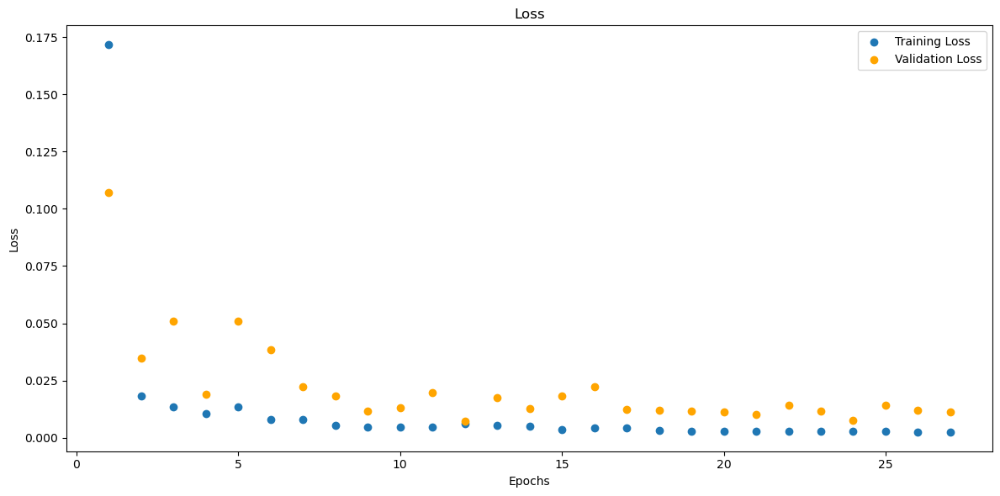

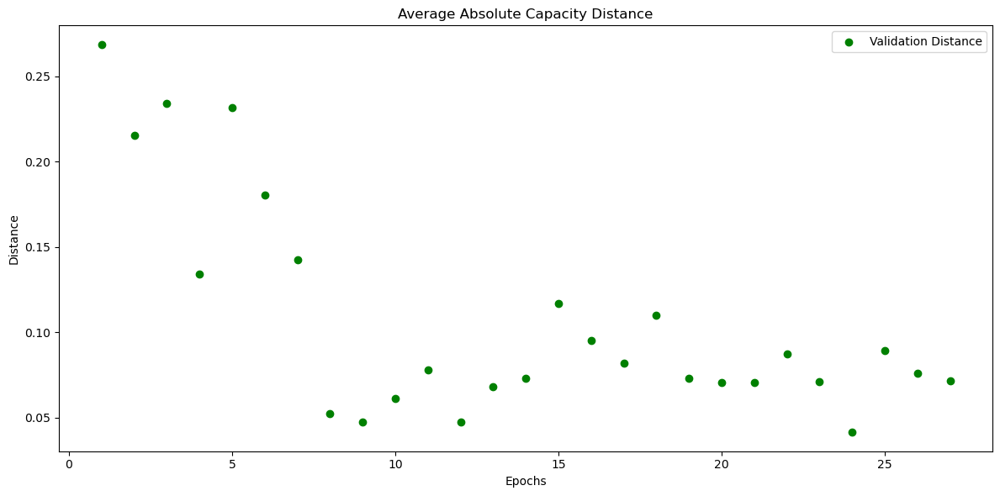

In [153]:
# B0005_charge_mm
model_B0005_charge_mm = LSTM_2(input_shape=input_shape_single)
model_B0005_charge_mm, train_losses_B0005_charge_mm, val_losses_B0005_charge_mm, val_distances_B0005_charge_mm, metrics_history_B0005_charge_mm = train(data_loaders['B0005_charge_mm_val_loader'], data_loaders['B0005_charge_mm_train_loader'], model_B0005_charge_mm)
torch.save(model_B0005_charge_mm, os.path.join(folder_name, 'model_B0005_charge_mm.pth'))

Test Loss: 0.0213, Test Distance: 0.0326, Test Accuracy: 4.7619, SNR: 1.8918
##Metrics##:
MAE : 0.03856075927615166
MSE : 0.0018920174334198236
RMSE : 0.20077329874038696
R-squared : -inf
Count: 21


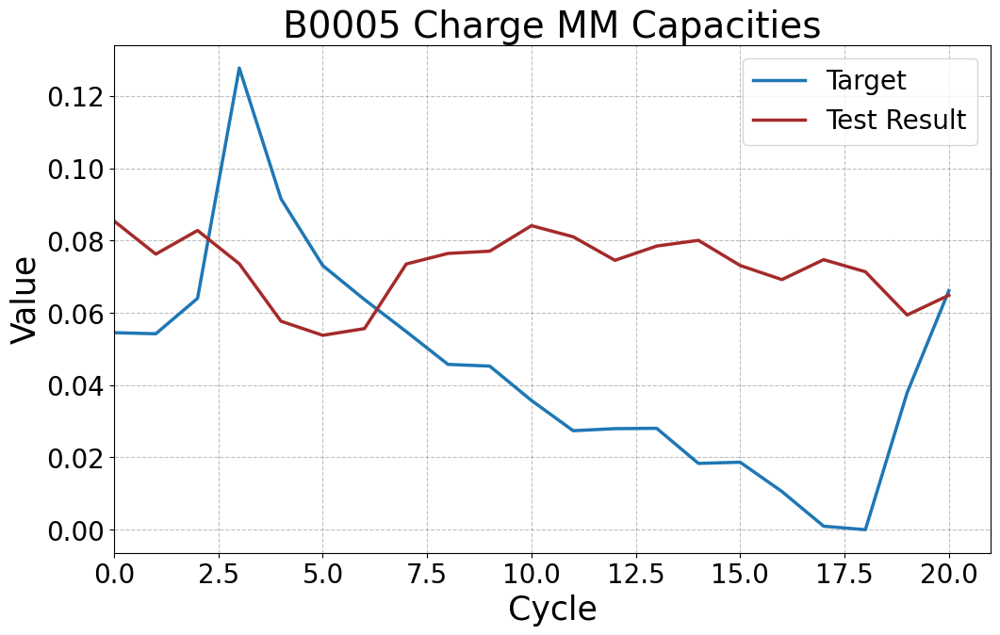

In [154]:
# B0005_charge_mm
model_B0005_charge_mm = torch.load('6. LSTM Models/model_B0005_charge_mm.pth')
y_target_B0005_charge_mm, y_testresult_B0005_charge_mm = test(model_B0005_charge_mm, data_loaders['B0005_charge_mm_test_loader'])
y_target_B0005_charge_mm = flatten_and_concatenate(y_target_B0005_charge_mm)
y_testresult_B0005_charge_mm = flatten_and_concatenate(y_testresult_B0005_charge_mm)
plot_tensors(y_target_B0005_charge_mm, y_testresult_B0005_charge_mm, labels=["Target", "Test Result"], title="B0005 Charge MM Capacities")


Test on complete dataset.

Test Loss: 0.0097, Test Distance: 0.0690, Test Accuracy: 5.3333, SNR: 17.4788
##Metrics##:
MAE : 0.06895744055509567
MSE : 0.006199350114911795
RMSE : 0.26656901836395264
R-squared : -48.84876251220703
Count: 150


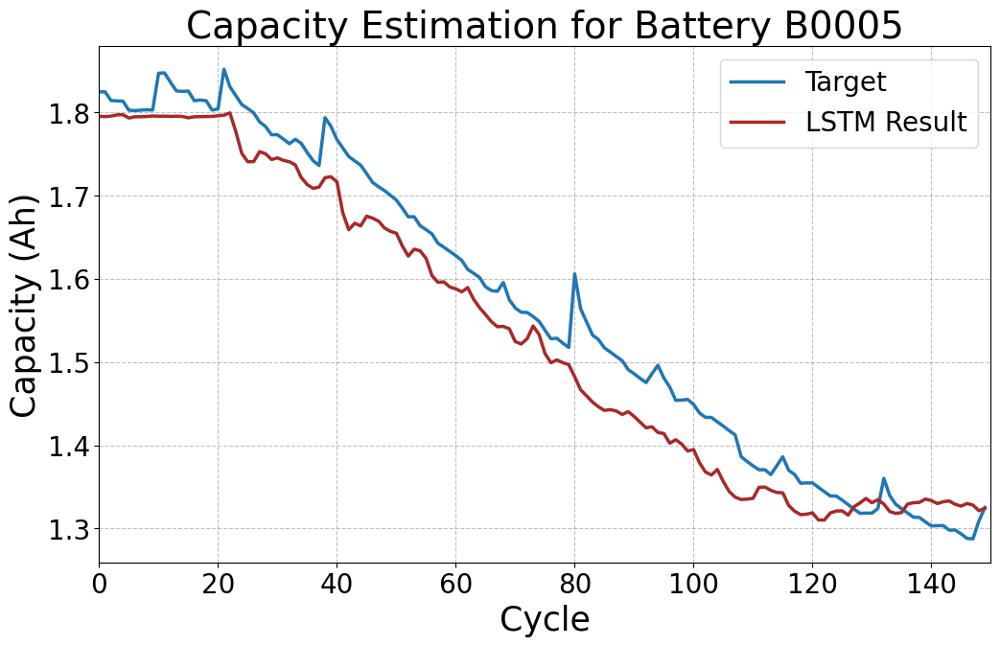

In [155]:
# Run the test on the model
y_target_B0005_charge_mm, y_testresult_B0005_charge_mm = test(model_B0005_charge_mm, data_loaders['B0005_charge_mm_final_test_loader'])

# Flatten and concatenate the results
y_target_B0005_charge_mm = flatten_and_concatenate(y_target_B0005_charge_mm)
y_testresult_B0005_charge_mm = flatten_and_concatenate(y_testresult_B0005_charge_mm)

# Assuming scaler_y_charge_B0005 was used for normalization earlier
# Inverse the normalization process for both target and prediction
original_y_target_B0005_charge_mm = scaler_y_charge_mm_B0005.inverse_transform(y_target_B0005_charge_mm.numpy().reshape(-1, 1))
original_y_testresult_B0005_charge_mm = scaler_y_charge_mm_B0005.inverse_transform(y_testresult_B0005_charge_mm.numpy().reshape(-1, 1))

# Convert the numpy arrays back to tensors
original_y_target_B0005_charge_mm = torch.tensor(original_y_target_B0005_charge_mm)
original_y_testresult_B0005_charge_mm = torch.tensor(original_y_testresult_B0005_charge_mm)

# Plot the inverse transformed results
plot_tensors(original_y_target_B0005_charge_mm, original_y_testresult_B0005_charge_mm, labels=["Target", "LSTM Result"], title="Capacity Estimation for Battery B0005", file_name="B0005_charge_mm", ylabel="Capacity (Ah)", save_dir="11. LSTM Capacity Plots")


SOH plot.

C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_23676\540638711.py:20: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_target_tensor = torch.tensor(soh_target)
C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_23676\540638711.py:21: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_predicted_tensor = torch.tensor(soh_predicted)


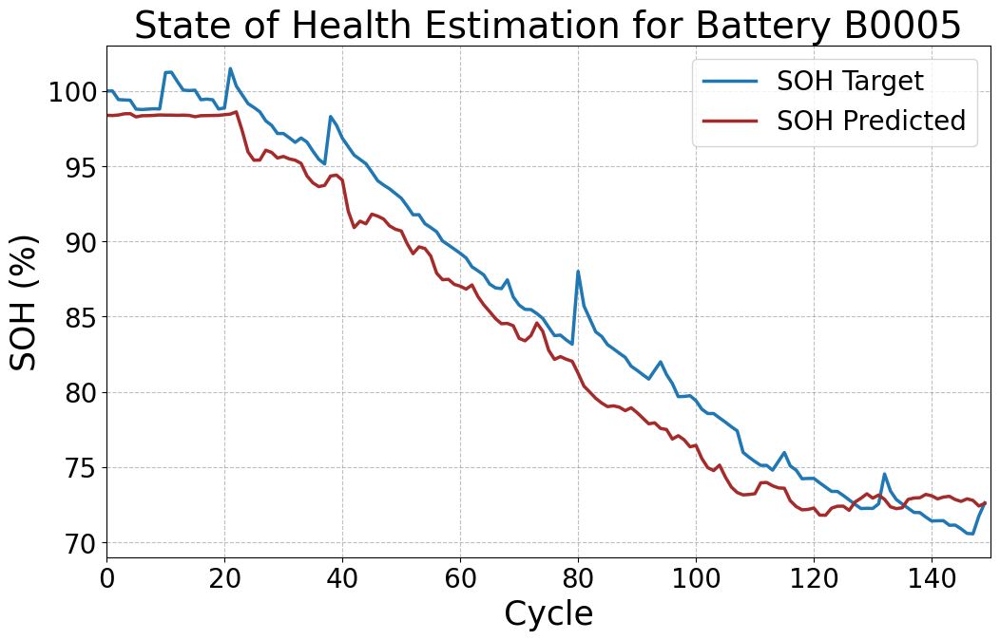

In [156]:
plot_soh(original_y_target_B0005_charge_mm, original_y_testresult_B0005_charge_mm, "State of Health Estimation for Battery B0005", file_name="B0005_charge_mm")


Model 2 - B0005 - Standard Scaler - Charging Data

c:\Users\jawaher.alhaj\AppData\Local\anaconda3\envs\myenv\lib\site-packages\torch\nn\modules\rnn.py:83: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.5 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
c:\Users\jawaher.alhaj\OneDrive - Technology Innovation Institute\Desktop\Dissertation\Nasa Battery Dataset\Single Battery Model\analysis.py:20: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\b\abs_8f7uhuge1i\croot\pytorch-select_1717607507421\work\aten\src\ATen\native\ReduceOps.cpp:1807.)
  target_std = torch.std(targets)


Epoch 1/120, Training Loss: 0.1639, Validation Loss: 0.1317
Validation Distance: 0.3845, Validation Accuracy: 4.7619, SNR: 7.8453
##Metrics##:
MAE : 0.24756458401679993
MSE : 0.10808220505714417
RMSE : 0.5174717903137207
R-squared : -inf
Count: 26
Epoch 2/120, Training Loss: 0.0466, Validation Loss: 0.2749
Validation Distance: 0.5735, Validation Accuracy: 0.0000, SNR: 5.4327
##Metrics##:
MAE : 0.42464160919189453
MSE : 0.23589526116847992
RMSE : 0.6534273028373718
R-squared : -inf
Count: 26
Epoch 3/120, Training Loss: 0.0275, Validation Loss: 0.2599
Validation Distance: 0.5694, Validation Accuracy: 0.0000, SNR: 5.5476
##Metrics##:
MAE : 0.42118963599205017
MSE : 0.23315922915935516
RMSE : 0.6512681245803833
R-squared : -inf
Count: 26
Epoch 4/120, Training Loss: 0.0237, Validation Loss: 0.3554
Validation Distance: 0.6887, Validation Accuracy: 0.0000, SNR: 4.2829
##Metrics##:
MAE : 0.5149282217025757
MSE : 0.344260036945343
RMSE : 0.719978928565979
R-squared : -inf
Count: 26
Epoch 5/120,

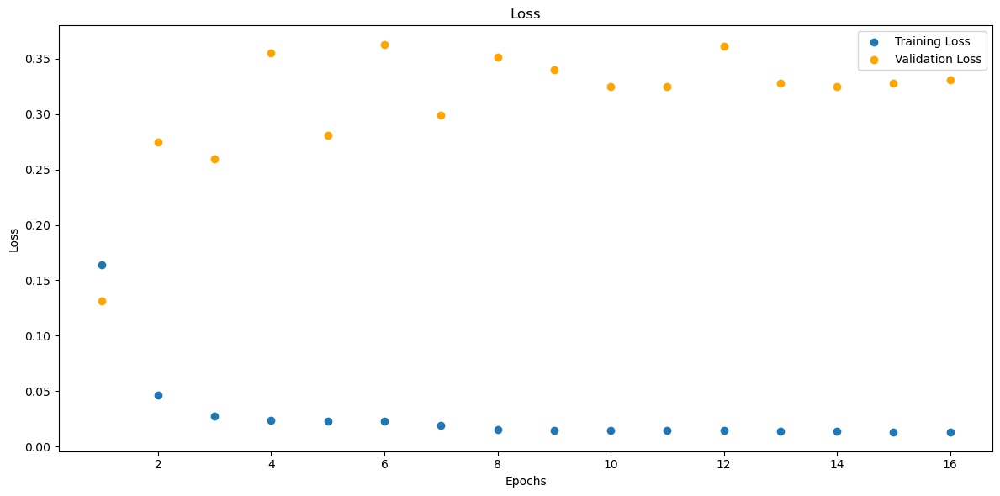

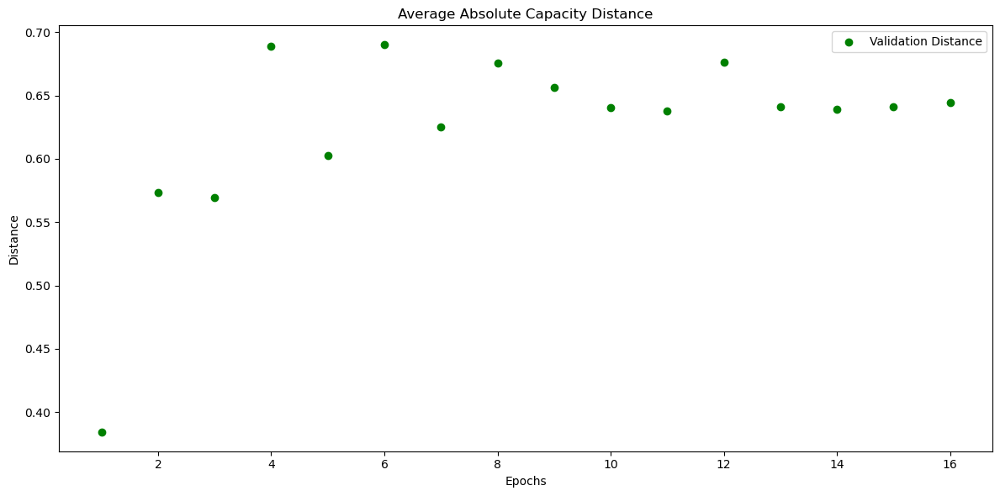

In [157]:
# B0005_charge_std
model_B0005_charge_std = LSTM_2(input_shape=input_shape_single)
model_B0005_charge_std, train_losses_B0005_charge_std, val_losses_B0005_charge_std, val_distances_B0005_charge_std, metrics_history_B0005_charge_std = train(data_loaders['B0005_charge_std_val_loader'], data_loaders['B0005_charge_std_train_loader'], model_B0005_charge_std)
torch.save(model_B0005_charge_std, os.path.join(folder_name, 'model_B0005_charge_std.pth'))

Test Loss: 1.0974, Test Distance: 1.0386, Test Accuracy: 0.0000, SNR: 2.0774
##Metrics##:
MAE : 1.0570272207260132
MSE : 1.1622812747955322
RMSE : 1.031825304031372
R-squared : -inf
Count: 21


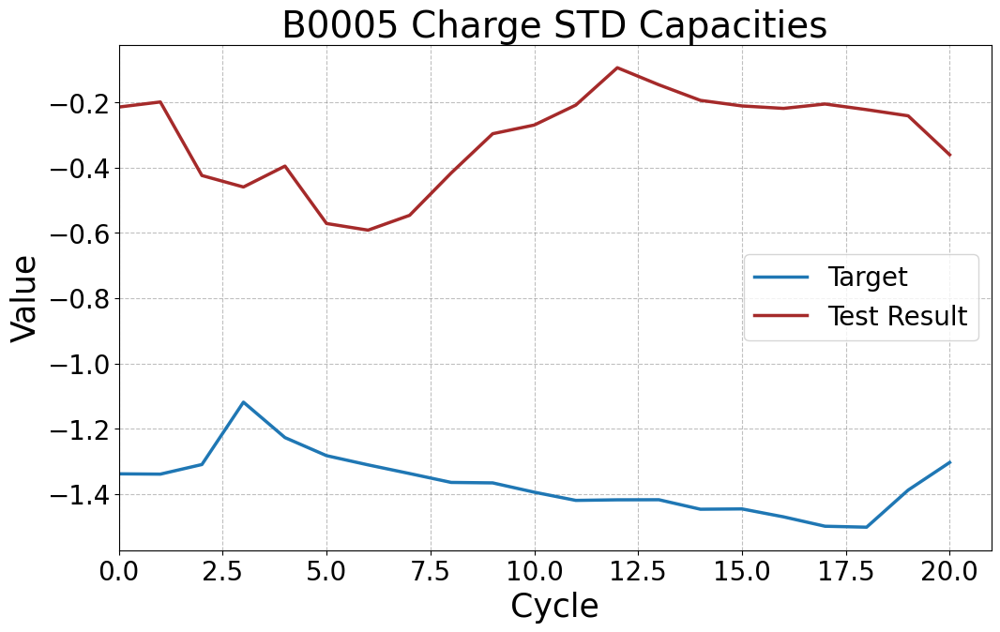

In [158]:
# B0005_charge_std
model_B0005_charge_std = torch.load('6. LSTM Models/model_B0005_charge_std.pth')
y_target_B0005_charge_std, y_testresult_B0005_charge_std = test(model_B0005_charge_std, data_loaders['B0005_charge_std_test_loader'])
y_target_B0005_charge_std = flatten_and_concatenate(y_target_B0005_charge_std)
y_testresult_B0005_charge_std = flatten_and_concatenate(y_testresult_B0005_charge_std)
plot_tensors(y_target_B0005_charge_std, y_testresult_B0005_charge_std, labels=["Target", "Test Result"], title="B0005 Charge STD Capacities")


Test on Complete dataset

Test Loss: 0.2153, Test Distance: 0.3538, Test Accuracy: 8.0000, SNR: 5.9914
##Metrics##:
MAE : 0.35383519530296326
MSE : 0.2417011708021164
RMSE : 0.6124826073646545
R-squared : -399.5862121582031
Count: 150


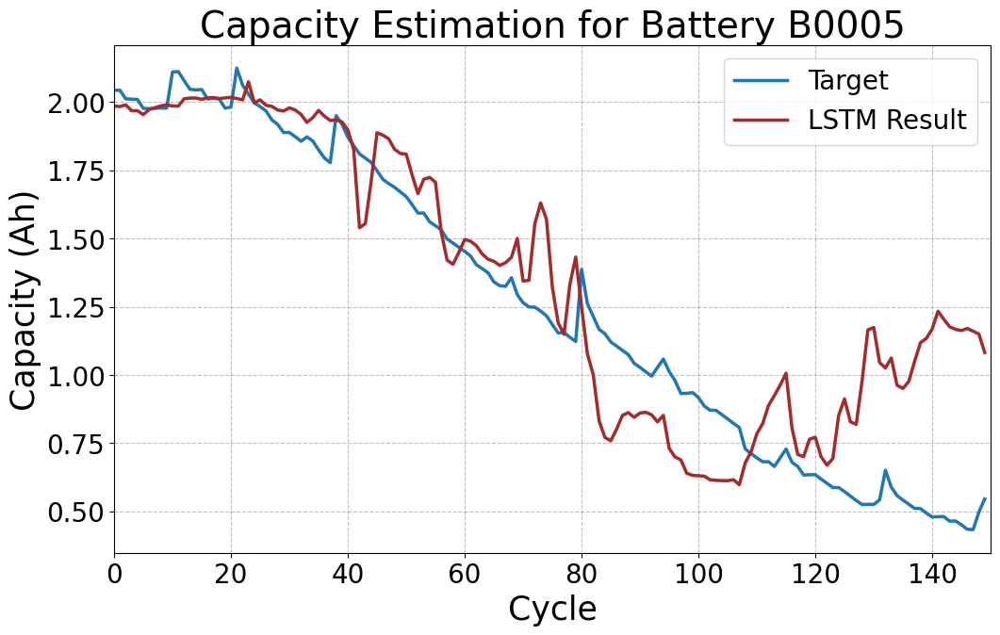

In [159]:
# Run the test on the model
y_target_B0005_charge_std, y_testresult_B0005_charge_std = test(model_B0005_charge_std, data_loaders['B0005_charge_std_final_test_loader'])

# Flatten and concatenate the results
y_target_B0005_charge_std = flatten_and_concatenate(y_target_B0005_charge_std)
y_testresult_B0005_charge_std = flatten_and_concatenate(y_testresult_B0005_charge_std)

# Assuming scaler_y_charge_B0005 was used for normalization earlier
# Inverse the normalization process for both target and prediction
original_y_target_B0005_charge_std = scaler_y_charge_mm_B0005.inverse_transform(y_target_B0005_charge_std.numpy().reshape(-1, 1))
original_y_testresult_B0005_charge_std = scaler_y_charge_mm_B0005.inverse_transform(y_testresult_B0005_charge_std.numpy().reshape(-1, 1))

# Convert the numpy arrays back to tensors
original_y_target_B0005_charge_std = torch.tensor(original_y_target_B0005_charge_std)
original_y_testresult_B0005_charge_std = torch.tensor(original_y_testresult_B0005_charge_std)

# Plot the inverse transformed results
plot_tensors(original_y_target_B0005_charge_std, original_y_testresult_B0005_charge_std, labels=["Target", "LSTM Result"], title="Capacity Estimation for Battery B0005", file_name="B0005_charge_std", ylabel="Capacity (Ah)", save_dir="11. LSTM Capacity Plots")


SOH Plot

C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_23676\540638711.py:20: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_target_tensor = torch.tensor(soh_target)
C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_23676\540638711.py:21: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_predicted_tensor = torch.tensor(soh_predicted)


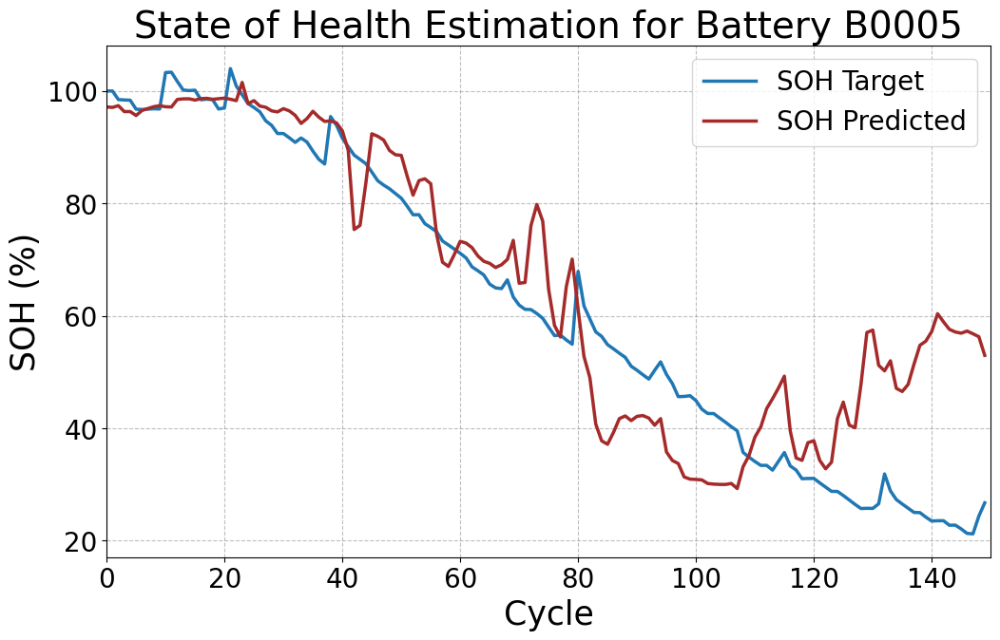

In [160]:
plot_soh(original_y_target_B0005_charge_std, original_y_testresult_B0005_charge_std, "State of Health Estimation for Battery B0005", file_name="B0005_charge_std")


Model 3 - B0005 - Robust Scaler - Charging Data

c:\Users\jawaher.alhaj\AppData\Local\anaconda3\envs\myenv\lib\site-packages\torch\nn\modules\rnn.py:83: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.5 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
c:\Users\jawaher.alhaj\OneDrive - Technology Innovation Institute\Desktop\Dissertation\Nasa Battery Dataset\Single Battery Model\analysis.py:20: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\b\abs_8f7uhuge1i\croot\pytorch-select_1717607507421\work\aten\src\ATen\native\ReduceOps.cpp:1807.)
  target_std = torch.std(targets)


Epoch 1/120, Training Loss: 0.0709, Validation Loss: 0.0224
Validation Distance: 0.1453, Validation Accuracy: 0.0000, SNR: 10.2354
##Metrics##:
MAE : 0.10077589005231857
MSE : 0.017355702817440033
RMSE : 0.3236781060695648
R-squared : -inf
Count: 26
Epoch 2/120, Training Loss: 0.0240, Validation Loss: 0.0453
Validation Distance: 0.2786, Validation Accuracy: 0.0000, SNR: 5.9048
##Metrics##:
MAE : 0.20290109515190125
MSE : 0.05538954585790634
RMSE : 0.4519099295139313
R-squared : -inf
Count: 26
Epoch 3/120, Training Loss: 0.0105, Validation Loss: 0.1563
Validation Distance: 0.4736, Validation Accuracy: 0.0000, SNR: 1.4492
##Metrics##:
MAE : 0.36278560757637024
MSE : 0.16875861585140228
RMSE : 0.6033349633216858
R-squared : -inf
Count: 26
Epoch 4/120, Training Loss: 0.0079, Validation Loss: 0.2036
Validation Distance: 0.5496, Validation Accuracy: 0.0000, SNR: 0.4622
##Metrics##:
MAE : 0.4237556457519531
MSE : 0.22758224606513977
RMSE : 0.6516118049621582
R-squared : -inf
Count: 26
Epoch 5

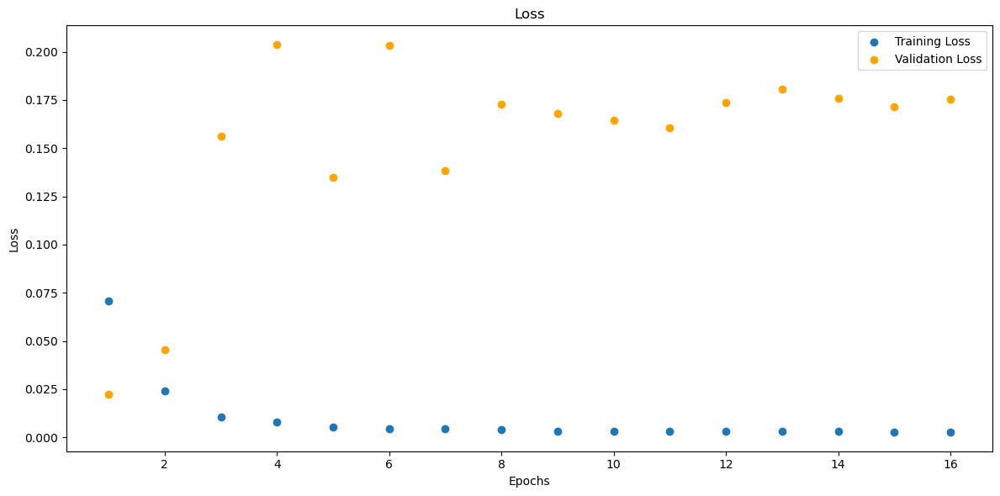

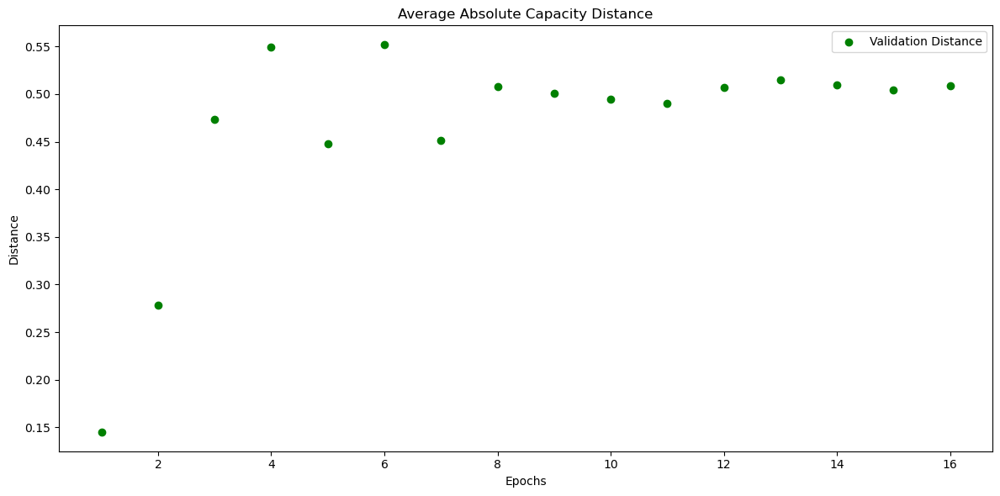

In [161]:
# B0005_charge_rob
model_B0005_charge_rob = LSTM_2(input_shape=input_shape_single)
model_B0005_charge_rob, train_losses_B0005_charge_rob, val_losses_B0005_charge_rob, val_distances_B0005_charge_rob, metrics_history_B0005_charge_rob = train(data_loaders['B0005_charge_rob_val_loader'], data_loaders['B0005_charge_rob_train_loader'], model_B0005_charge_rob)
torch.save(model_B0005_charge_rob, os.path.join(folder_name, 'model_B0005_charge_rob.pth'))

Test Loss: 0.1179, Test Distance: 0.3598, Test Accuracy: 0.0000, SNR: 4.7212
##Metrics##:
MAE : 0.3649595379829407
MSE : 0.14033243060112
RMSE : 0.6063639521598816
R-squared : -inf
Count: 21


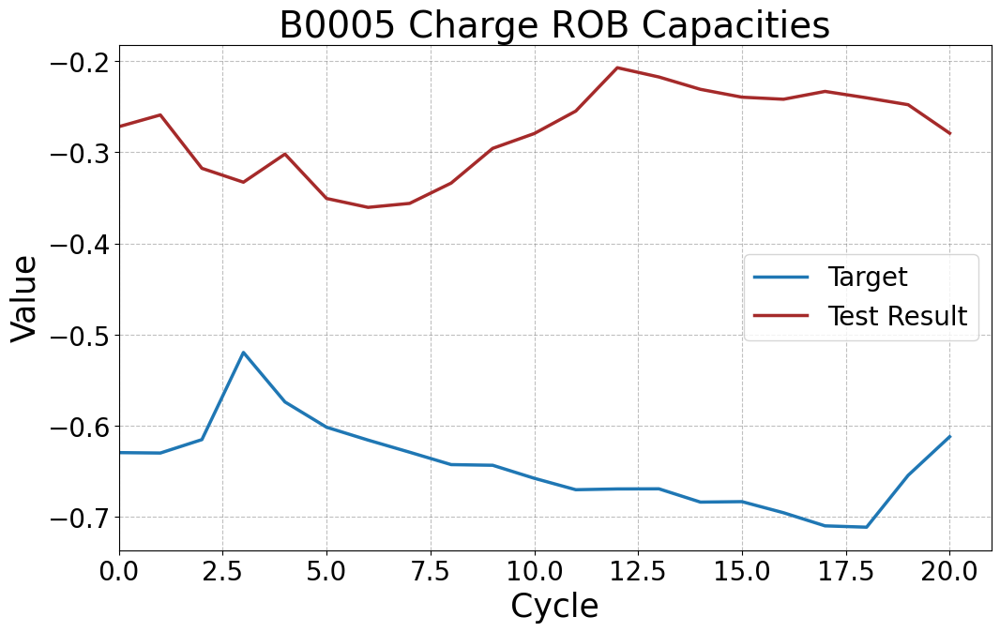

In [162]:
# B0005_charge_rob
model_B0005_charge_rob = torch.load('6. LSTM Models/model_B0005_charge_rob.pth')
y_target_B0005_charge_rob, y_testresult_B0005_charge_rob = test(model_B0005_charge_rob, data_loaders['B0005_charge_rob_test_loader'])
y_target_B0005_charge_rob = flatten_and_concatenate(y_target_B0005_charge_rob)
y_testresult_B0005_charge_rob = flatten_and_concatenate(y_testresult_B0005_charge_rob)
plot_tensors(y_target_B0005_charge_rob, y_testresult_B0005_charge_rob, labels=["Target", "Test Result"], title="B0005 Charge ROB Capacities")


Test on complete dataset.

In [163]:
# Run the test on the model
y_target_B0005_charge_rob, y_testresult_B0005_charge_rob = test(model_B0005_charge_rob, data_loaders['B0005_charge_rob_final_test_loader'])

# Flatten and concatenate the results
y_target_B0005_charge_rob = flatten_and_concatenate(y_target_B0005_charge_rob)
y_testresult_B0005_charge_rob = flatten_and_concatenate(y_testresult_B0005_charge_rob)

# # Assuming scaler_y_charge_B0005 was used for normalization earlier
# # Inverse the normalization process for both target and prediction
# original_y_target_B0005_charge_rob = scaler_y_charge_rob_B0005.inverse_transform(y_target_B0005_charge_rob.numpy().reshape(-1, 1))
# original_y_testresult_B0005_charge_rob = scaler_y_charge_rob_B0005.inverse_transform(y_testresult_B0005_charge_rob.numpy().reshape(-1, 1))

# # Convert the numpy arrays back to tensors
# original_y_target_B0005_charge_rob = torch.tensor(original_y_target_B0005_charge_rob)
# original_y_testresult_B0005_charge_rob = torch.tensor(original_y_testresult_B0005_charge_rob)

# # Plot the inverse transformed results
# plot_tensors(original_y_target_B0005_charge_rob, original_y_testresult_B0005_charge_rob, labels=["Target", "LSTM Result"], title="Capacity Estimation for Battery B0005", file_name="B0005_charge_rob", ylabel="Capacity (Ah)", save_dir="11. LSTM Capacity Plots")


Test Loss: 0.0329, Test Distance: 0.1567, Test Accuracy: 1.3333, SNR: 7.8642
##Metrics##:
MAE : 0.15666209161281586
MSE : 0.039425477385520935
RMSE : 0.40509355068206787
R-squared : -2810.953369140625
Count: 150


SOH plot.

In [164]:
# plot_soh(original_y_target_B0005_charge_rob, original_y_testresult_B0005_charge_rob, "State of Health Estimation for Battery B0005", file_name="B0005_charge_rob")


Model 4 - B0005 - MinMax Scaler - Discharging Data

Epoch 1/120, Training Loss: 0.1818, Validation Loss: 0.0214
Validation Distance: 0.1456, Validation Accuracy: 0.0000, SNR: -5.4715
##Metrics##:
MAE : 0.11187075078487396
MSE : 0.016043005511164665
RMSE : 0.3356821537017822
R-squared : -inf
Count: 26
Epoch 2/120, Training Loss: 0.0211, Validation Loss: 0.0022
Validation Distance: 0.0641, Validation Accuracy: 0.0000, SNR: 8.1864
##Metrics##:
MAE : 0.05346670001745224
MSE : 0.0036785064730793238
RMSE : 0.2327633500099182
R-squared : -inf
Count: 26
Epoch 3/120, Training Loss: 0.0079, Validation Loss: 0.0006
Validation Distance: 0.0209, Validation Accuracy: 0.0000, SNR: 12.2812
##Metrics##:
MAE : 0.018724627792835236
MSE : 0.0005790074937976897
RMSE : 0.1438666135072708
R-squared : -inf
Count: 26
Epoch 4/120, Training Loss: 0.0060, Validation Loss: 0.0007
Validation Distance: 0.0114, Validation Accuracy: 14.2857, SNR: 9.6490
##Metrics##:
MAE : 0.00891643576323986
MSE : 0.0001339263835689053
RMSE : 0.1012008786201477
R-squared : -inf
Count: 

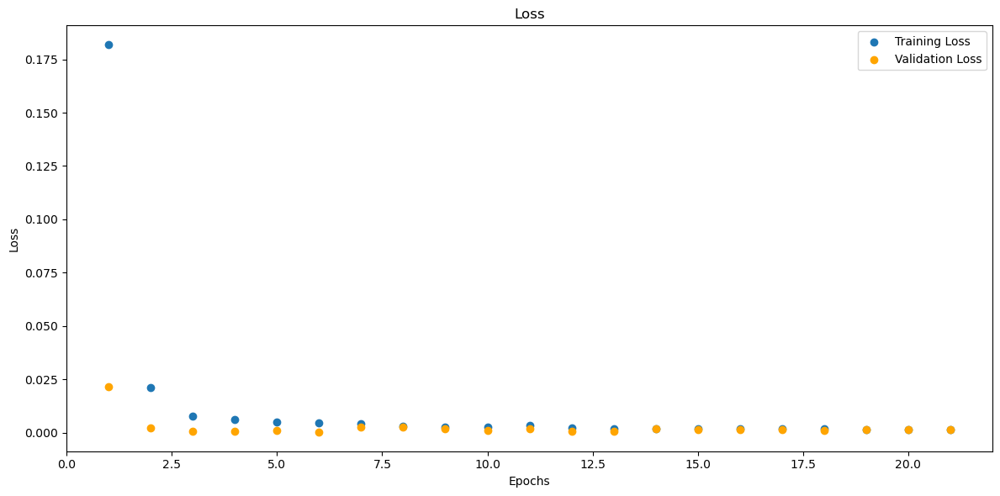

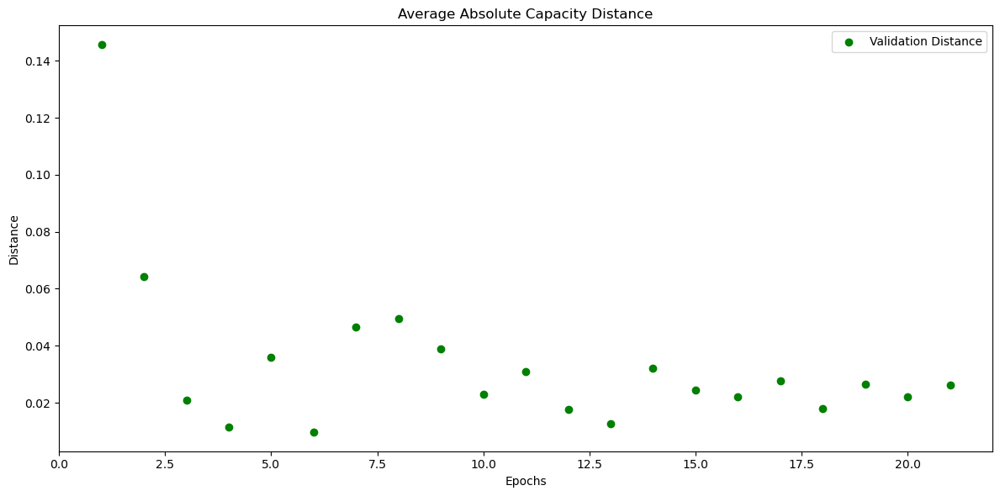

In [165]:
# B0005_discharge_mm
model_B0005_discharge_mm = LSTM_2(input_shape=input_shape_single)
model_B0005_discharge_mm, train_losses_B0005_discharge_mm, val_losses_B0005_discharge_mm, val_distances_B0005_discharge_mm, metrics_history_B0005_discharge_mm = train(data_loaders['B0005_discharge_mm_val_loader'], data_loaders['B0005_discharge_mm_train_loader'], model_B0005_discharge_mm)
torch.save(model_B0005_discharge_mm, os.path.join(folder_name, 'model_B0005_discharge_mm.pth'))

Test Loss: 0.0010, Test Distance: 0.0159, Test Accuracy: 0.0000, SNR: 7.0046
##Metrics##:
MAE : 0.017744893208146095
MSE : 0.000582969980314374
RMSE : 0.14885173738002777
R-squared : -inf
Count: 21


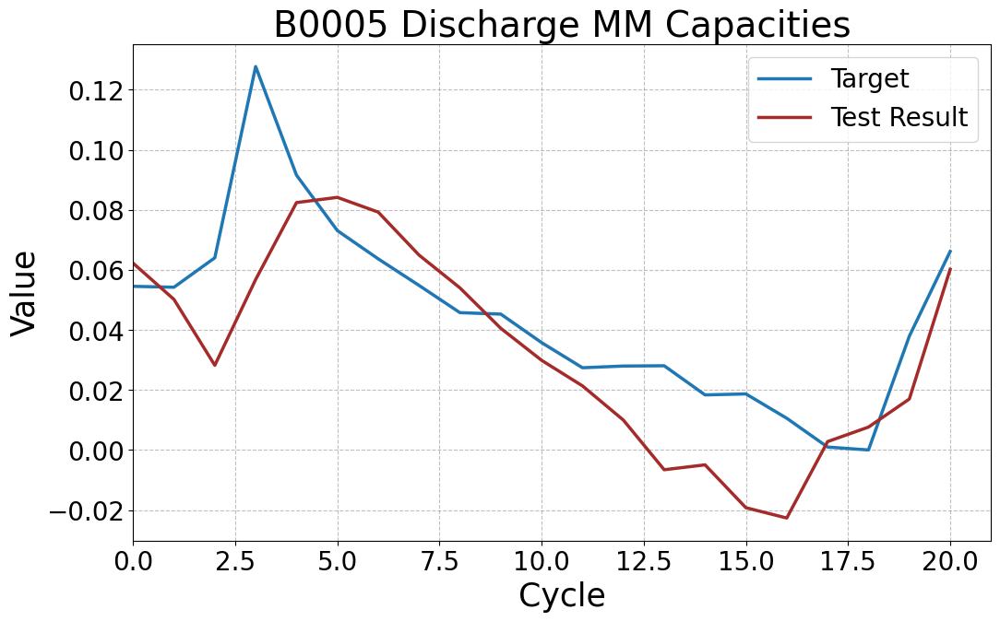

In [166]:
# B0005_discharge_mm
model_B0005_discharge_mm = torch.load('6. LSTM Models/model_B0005_discharge_mm.pth')
y_target_B0005_discharge_mm, y_testresult_B0005_discharge_mm = test(model_B0005_discharge_mm, data_loaders['B0005_discharge_mm_test_loader'])
y_target_B0005_discharge_mm = flatten_and_concatenate(y_target_B0005_discharge_mm)
y_testresult_B0005_discharge_mm = flatten_and_concatenate(y_testresult_B0005_discharge_mm)
plot_tensors(y_target_B0005_discharge_mm, y_testresult_B0005_discharge_mm, labels=["Target", "Test Result"], title="B0005 Discharge MM Capacities")


Test on complete dataset.

Test Loss: 0.0029, Test Distance: 0.0268, Test Accuracy: 28.0000, SNR: 23.2226
##Metrics##:
MAE : 0.026776326820254326
MSE : 0.001651827828027308
RMSE : 0.17631825804710388
R-squared : -56.871150970458984
Count: 150


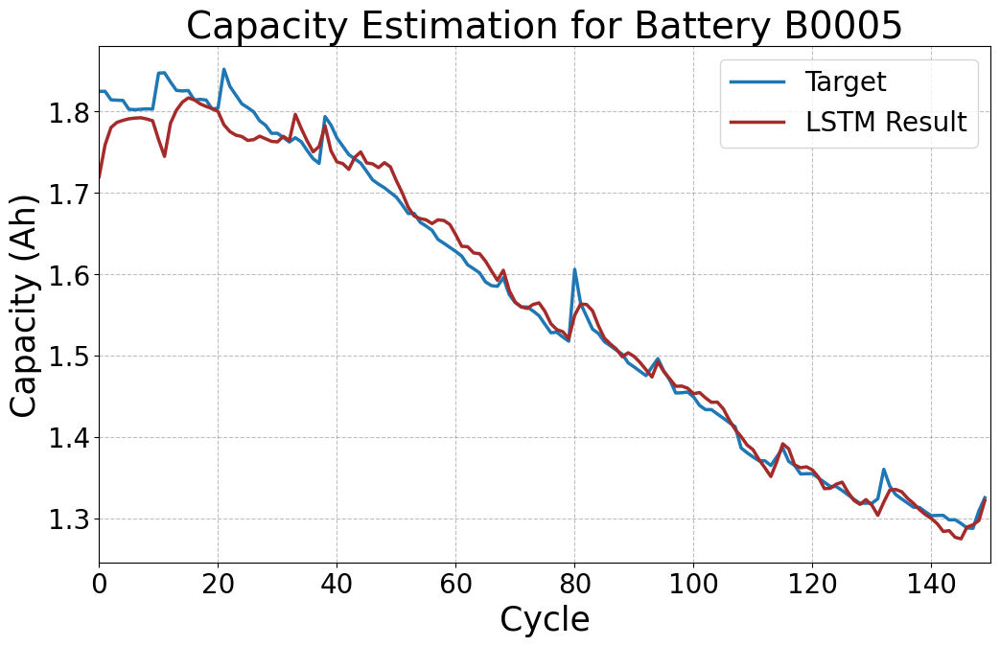

In [167]:
# Run the test on the model
y_target_B0005_discharge_mm, y_testresult_B0005_discharge_mm = test(model_B0005_discharge_mm, data_loaders['B0005_discharge_mm_final_test_loader'])

# Flatten and concatenate the results
y_target_B0005_discharge_mm = flatten_and_concatenate(y_target_B0005_discharge_mm)
y_testresult_B0005_discharge_mm = flatten_and_concatenate(y_testresult_B0005_discharge_mm)

# Assuming scaler_y_discharge_B0005 was used for normalization earlier
# Inverse the normalization process for both target and prediction
original_y_target_B0005_discharge_mm = scaler_y_dis_mm_B0005.inverse_transform(y_target_B0005_discharge_mm.numpy().reshape(-1, 1))
original_y_testresult_B0005_discharge_mm = scaler_y_dis_mm_B0005.inverse_transform(y_testresult_B0005_discharge_mm.numpy().reshape(-1, 1))

# Convert the numpy arrays back to tensors
original_y_target_B0005_discharge_mm = torch.tensor(original_y_target_B0005_discharge_mm)
original_y_testresult_B0005_discharge_mm = torch.tensor(original_y_testresult_B0005_discharge_mm)

# Plot the inverse transformed results
plot_tensors(original_y_target_B0005_discharge_mm, original_y_testresult_B0005_discharge_mm, labels=["Target", "LSTM Result"], title="Capacity Estimation for Battery B0005", file_name="B0005_discharge_mm", ylabel="Capacity (Ah)", save_dir="11. LSTM Capacity Plots")


SOH Plot.

C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_23676\540638711.py:20: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_target_tensor = torch.tensor(soh_target)
C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_23676\540638711.py:21: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_predicted_tensor = torch.tensor(soh_predicted)


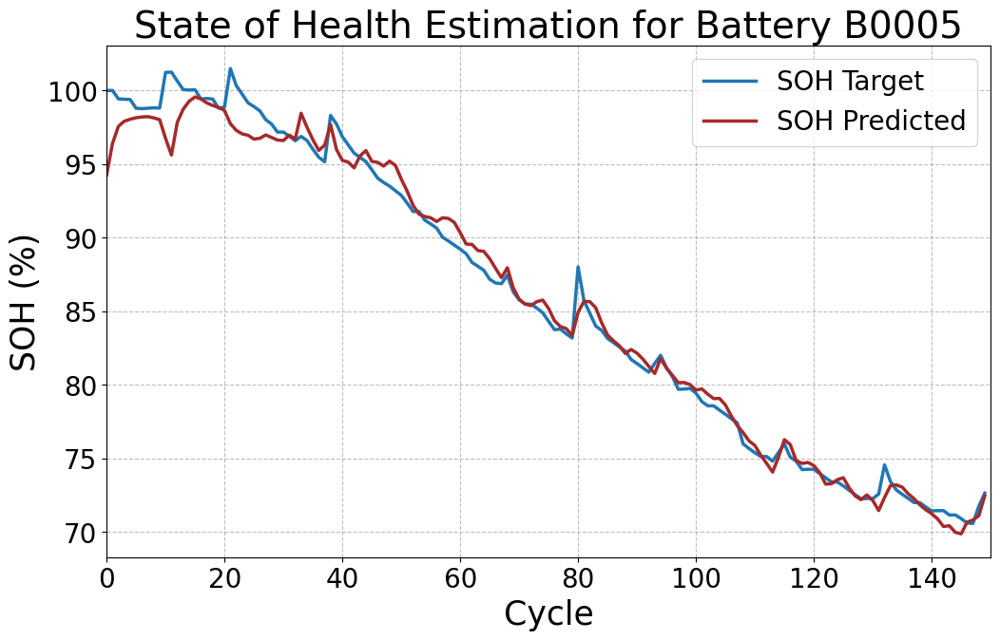

In [168]:
plot_soh(original_y_target_B0005_discharge_mm, original_y_testresult_B0005_discharge_mm, "State of Health Estimation for Battery B0005", file_name="B0005_discharge_mm")

Model 5 - B0005 - Standard Scaler - Discharging Data

c:\Users\jawaher.alhaj\AppData\Local\anaconda3\envs\myenv\lib\site-packages\torch\nn\modules\rnn.py:83: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.5 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
c:\Users\jawaher.alhaj\OneDrive - Technology Innovation Institute\Desktop\Dissertation\Nasa Battery Dataset\Single Battery Model\analysis.py:20: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\b\abs_8f7uhuge1i\croot\pytorch-select_1717607507421\work\aten\src\ATen\native\ReduceOps.cpp:1807.)
  target_std = torch.std(targets)


Epoch 1/120, Training Loss: 0.1578, Validation Loss: 0.3714
Validation Distance: 0.6204, Validation Accuracy: 0.0000, SNR: 3.6606
##Metrics##:
MAE : 0.4677343964576721
MSE : 0.2974562346935272
RMSE : 0.6858890056610107
R-squared : -inf
Count: 26
Epoch 2/120, Training Loss: 0.0311, Validation Loss: 0.3218
Validation Distance: 0.5362, Validation Accuracy: 0.0000, SNR: 4.4081
##Metrics##:
MAE : 0.39456430077552795
MSE : 0.21061113476753235
RMSE : 0.6321641206741333
R-squared : -inf
Count: 26
Epoch 3/120, Training Loss: 0.0143, Validation Loss: 0.3035
Validation Distance: 0.5271, Validation Accuracy: 0.0000, SNR: 4.8092
##Metrics##:
MAE : 0.386013388633728
MSE : 0.19971857964992523
RMSE : 0.6259669661521912
R-squared : -inf
Count: 26
Epoch 4/120, Training Loss: 0.0106, Validation Loss: 0.2831
Validation Distance: 0.4956, Validation Accuracy: 0.0000, SNR: 5.1520
##Metrics##:
MAE : 0.3601115047931671
MSE : 0.1755387783050537
RMSE : 0.6058014035224915
R-squared : -inf
Count: 26
Epoch 5/120, T

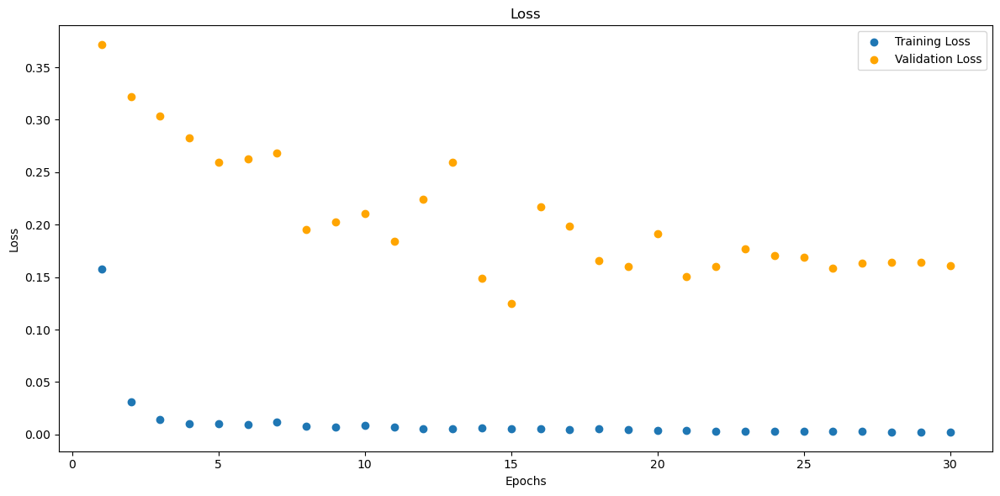

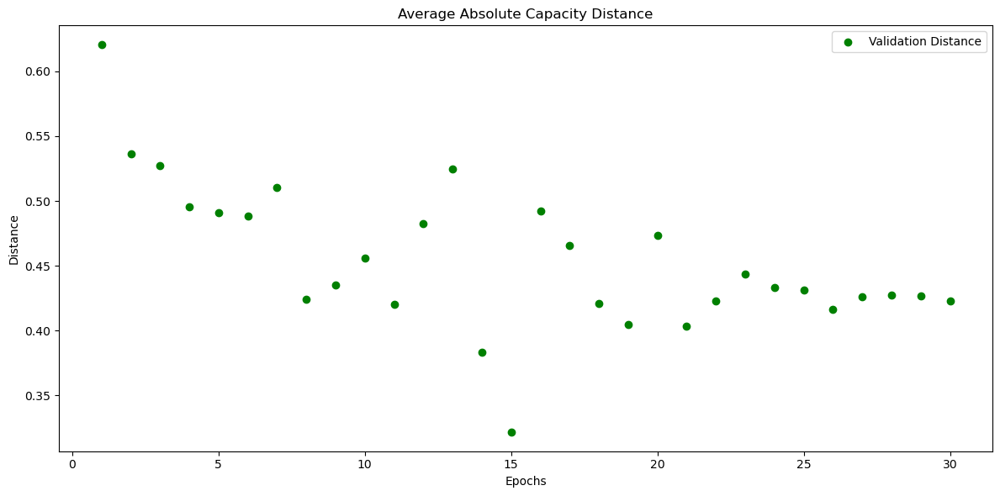

In [169]:
# B0005_discharge_std
model_B0005_discharge_std = LSTM_2(input_shape=input_shape_single)
model_B0005_discharge_std, train_losses_B0005_discharge_std, val_losses_B0005_discharge_std, val_distances_B0005_discharge_std, metrics_history_B0005_discharge_std = train(data_loaders['B0005_discharge_std_val_loader'], data_loaders['B0005_discharge_std_train_loader'], model_B0005_discharge_std)
torch.save(model_B0005_discharge_std, os.path.join(folder_name, 'model_B0005_discharge_std.pth'))

Test Loss: 0.5845, Test Distance: 0.6492, Test Accuracy: 0.0000, SNR: 5.8575
##Metrics##:
MAE : 0.6783303022384644
MSE : 0.4867394268512726
RMSE : 0.8257848024368286
R-squared : -inf
Count: 21


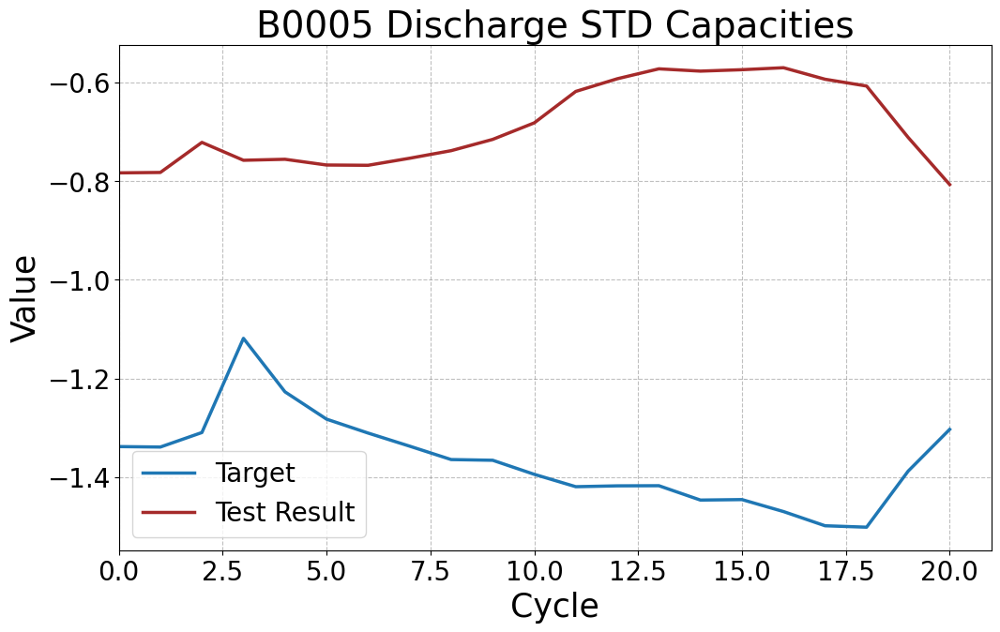

In [170]:
# B0005_discharge_std
model_B0005_discharge_std = torch.load('6. LSTM Models/model_B0005_discharge_std.pth')
y_target_B0005_discharge_std, y_testresult_B0005_discharge_std = test(model_B0005_discharge_std, data_loaders['B0005_discharge_std_test_loader'])
y_target_B0005_discharge_std = flatten_and_concatenate(y_target_B0005_discharge_std)
y_testresult_B0005_discharge_std = flatten_and_concatenate(y_testresult_B0005_discharge_std)
plot_tensors(y_target_B0005_discharge_std, y_testresult_B0005_discharge_std, labels=["Target", "Test Result"], title="B0005 Discharge STD Capacities")


Test on complete dataset.

Test Loss: 0.0947, Test Distance: 0.1659, Test Accuracy: 18.0000, SNR: 10.6317
##Metrics##:
MAE : 0.16585688292980194
MSE : 0.08303260803222656
RMSE : 0.41397666931152344
R-squared : -229.35765075683594
Count: 150


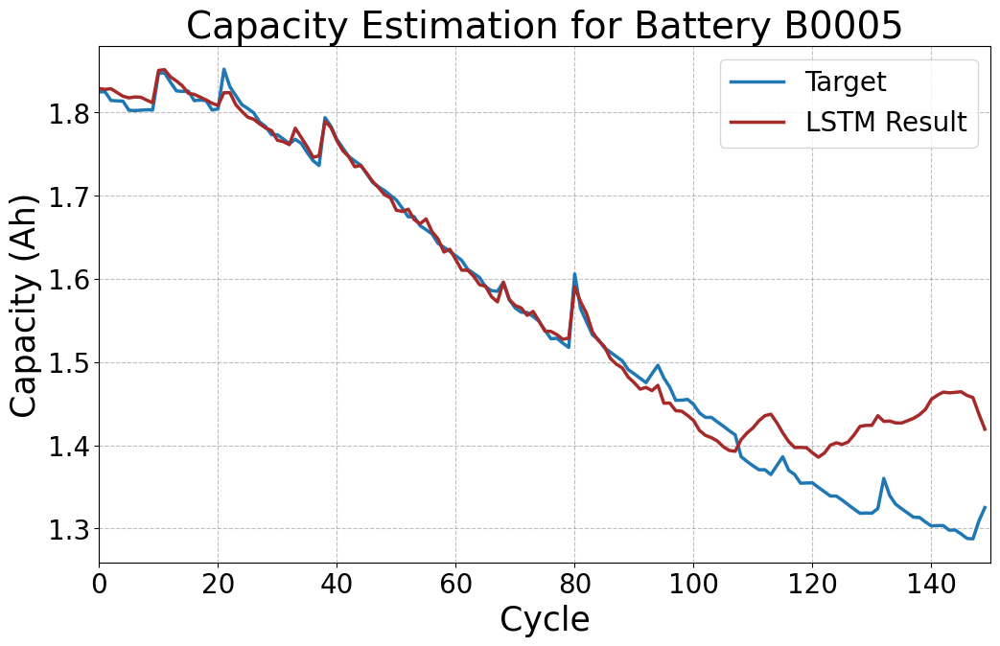

In [171]:
# Run the test on the model
y_target_B0005_discharge_std, y_testresult_B0005_discharge_std = test(model_B0005_discharge_std, data_loaders['B0005_discharge_std_final_test_loader'])

# Flatten and concatenate the results
y_target_B0005_discharge_std = flatten_and_concatenate(y_target_B0005_discharge_std)
y_testresult_B0005_discharge_std = flatten_and_concatenate(y_testresult_B0005_discharge_std)

# Assuming scaler_y_discharge_B0005 was used for normalization earlier
# Inverse the normalization process for both target and prediction
original_y_target_B0005_discharge_std = scaler_y_dis_std_B0005.inverse_transform(y_target_B0005_discharge_std.numpy().reshape(-1, 1))
original_y_testresult_B0005_discharge_std = scaler_y_dis_std_B0005.inverse_transform(y_testresult_B0005_discharge_std.numpy().reshape(-1, 1))

# Convert the numpy arrays back to tensors
original_y_target_B0005_discharge_std = torch.tensor(original_y_target_B0005_discharge_std)
original_y_testresult_B0005_discharge_std = torch.tensor(original_y_testresult_B0005_discharge_std)

# Plot the inverse transformed results
plot_tensors(original_y_target_B0005_discharge_std, original_y_testresult_B0005_discharge_std, labels=["Target", "LSTM Result"], title="Capacity Estimation for Battery B0005", file_name="B0005_discharge_std", ylabel="Capacity (Ah)", save_dir="11. LSTM Capacity Plots")


SOH plot.

C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_23676\540638711.py:20: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_target_tensor = torch.tensor(soh_target)
C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_23676\540638711.py:21: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_predicted_tensor = torch.tensor(soh_predicted)


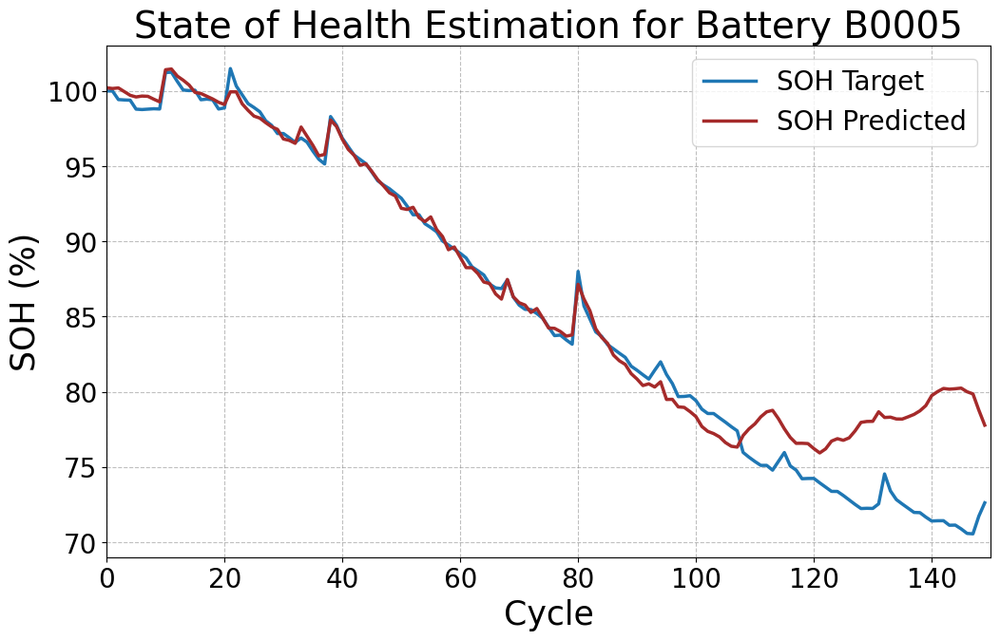

In [172]:
plot_soh(original_y_target_B0005_discharge_std, original_y_testresult_B0005_discharge_std, "State of Health Estimation for Battery B0005", file_name="B0005_discharge_std")

Model 6 - B0005 - Robust Scaler - Discharging Data

c:\Users\jawaher.alhaj\AppData\Local\anaconda3\envs\myenv\lib\site-packages\torch\nn\modules\rnn.py:83: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.5 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
c:\Users\jawaher.alhaj\OneDrive - Technology Innovation Institute\Desktop\Dissertation\Nasa Battery Dataset\Single Battery Model\analysis.py:20: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\b\abs_8f7uhuge1i\croot\pytorch-select_1717607507421\work\aten\src\ATen\native\ReduceOps.cpp:1807.)
  target_std = torch.std(targets)


Epoch 1/120, Training Loss: 0.0895, Validation Loss: 0.2790
Validation Distance: 0.5977, Validation Accuracy: 0.0000, SNR: -0.7546
##Metrics##:
MAE : 0.46852460503578186
MSE : 0.27856865525245667
RMSE : 0.68505859375
R-squared : -inf
Count: 26
Epoch 2/120, Training Loss: 0.0178, Validation Loss: 0.1512
Validation Distance: 0.4395, Validation Accuracy: 0.0000, SNR: 1.2992
##Metrics##:
MAE : 0.3356987535953522
MSE : 0.1471712738275528
RMSE : 0.5800145268440247
R-squared : -inf
Count: 26
Epoch 3/120, Training Loss: 0.0077, Validation Loss: 0.0728
Validation Distance: 0.2934, Validation Accuracy: 0.0000, SNR: 3.7123
##Metrics##:
MAE : 0.21417008340358734
MSE : 0.06449081748723984
RMSE : 0.46399620175361633
R-squared : -inf
Count: 26
Epoch 4/120, Training Loss: 0.0057, Validation Loss: 0.1094
Validation Distance: 0.3569, Validation Accuracy: 0.0000, SNR: 2.4788
##Metrics##:
MAE : 0.2652694582939148
MSE : 0.09349650889635086
RMSE : 0.5159527659416199
R-squared : -inf
Count: 26
Epoch 5/120, T

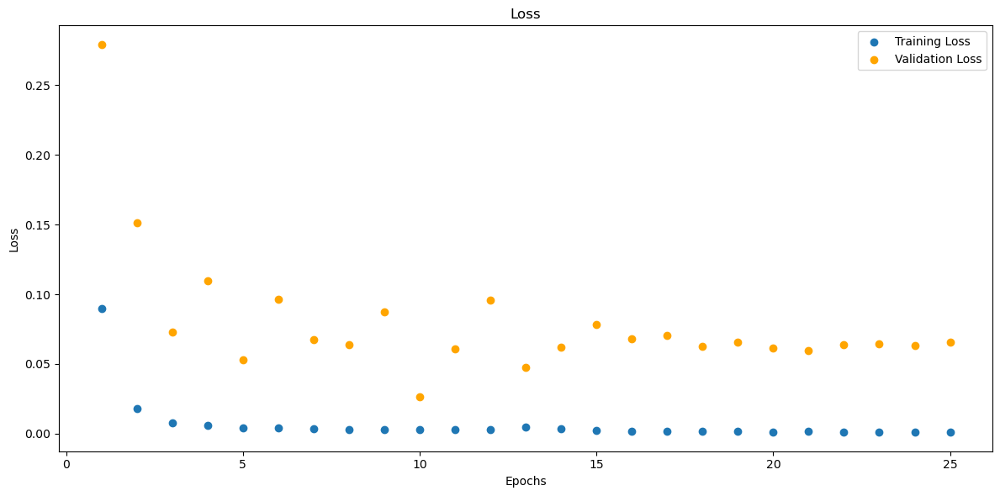

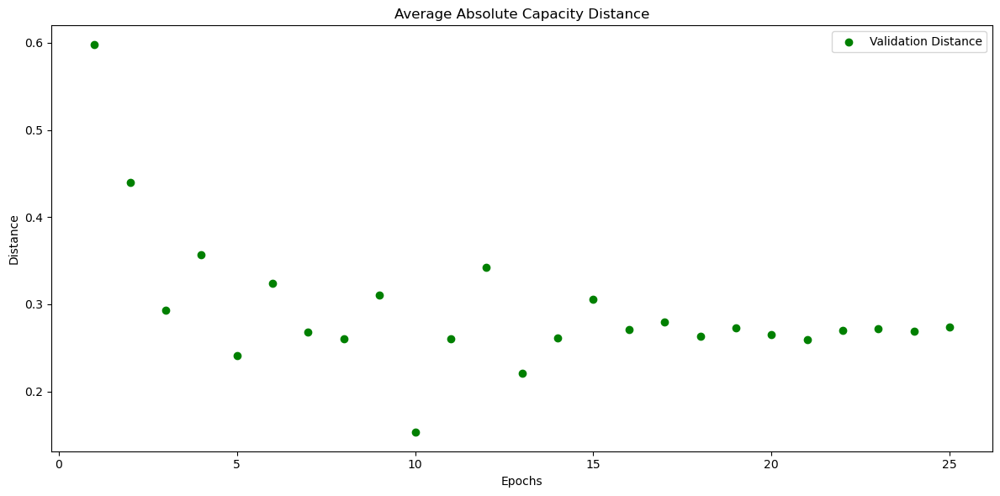

In [173]:
# B0005_discharge_rob
model_B0005_discharge_rob = LSTM_2(input_shape=input_shape_single)
model_B0005_discharge_rob, train_losses_B0005_discharge_rob, val_losses_B0005_discharge_rob, val_distances_B0005_discharge_rob, metrics_history_B0005_discharge_rob = train(data_loaders['B0005_discharge_rob_val_loader'], data_loaders['B0005_discharge_rob_train_loader'], model_B0005_discharge_rob)
torch.save(model_B0005_discharge_rob, os.path.join(folder_name, 'model_B0005_discharge_rob.pth'))

Test Loss: 0.1257, Test Distance: 0.3056, Test Accuracy: 0.0000, SNR: 5.8360
##Metrics##:
MAE : 0.3238579332828522
MSE : 0.1085619255900383
RMSE : 0.5710597038269043
R-squared : -inf
Count: 21


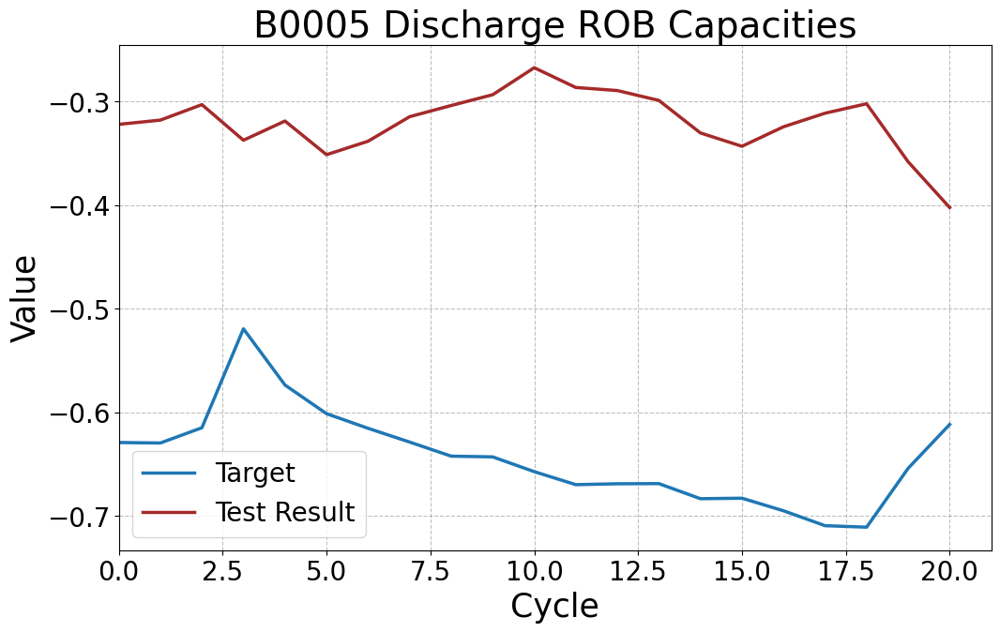

In [174]:
# B0005_discharge_rob
model_B0005_discharge_rob = torch.load('6. LSTM Models/model_B0005_discharge_rob.pth')
y_target_B0005_discharge_rob, y_testresult_B0005_discharge_rob = test(model_B0005_discharge_rob, data_loaders['B0005_discharge_rob_test_loader'])
y_target_B0005_discharge_rob = flatten_and_concatenate(y_target_B0005_discharge_rob)
y_testresult_B0005_discharge_rob = flatten_and_concatenate(y_testresult_B0005_discharge_rob)
plot_tensors(y_target_B0005_discharge_rob, y_testresult_B0005_discharge_rob, labels=["Target", "Test Result"], title="B0005 Discharge ROB Capacities")


Test on complete dataset

In [175]:
# Run the test on the model
y_target_B0005_discharge_rob, y_testresult_B0005_discharge_rob = test(model_B0005_discharge_rob, data_loaders['B0005_discharge_rob_final_test_loader'])

# Flatten and concatenate the results
y_target_B0005_discharge_rob = flatten_and_concatenate(y_target_B0005_discharge_rob)
y_testresult_B0005_discharge_rob = flatten_and_concatenate(y_testresult_B0005_discharge_rob)

# # Assuming scaler_y_discharge_B0005 was used for normalization earlier
# # Inverse the normalization process for both target and prediction
# original_y_target_B0005_discharge_rob = scaler_y_dis_rob_B0005.inverse_transform(y_target_B0005_discharge_rob.numpy().reshape(-1, 1))
# original_y_testresult_B0005_discharge_rob = scaler_y_dis_rob_B0005.inverse_transform(y_testresult_B0005_discharge_rob.numpy().reshape(-1, 1))

# # Convert the numpy arrays back to tensors
# original_y_target_B0005_discharge_rob = torch.tensor(original_y_target_B0005_discharge_rob)
# original_y_testresult_B0005_discharge_rob = torch.tensor(original_y_testresult_B0005_discharge_rob)

# # Plot the inverse transformed results
# plot_tensors(original_y_target_B0005_discharge_rob, original_y_testresult_B0005_discharge_rob, labels=["Target", "LSTM Result"], title="Capacity Estimation for Battery B0005", file_name="B0005_discharge_rob", ylabel="Capacity (Ah)", save_dir="11. LSTM Capacity Plots")


Test Loss: 0.0225, Test Distance: 0.0934, Test Accuracy: 9.3333, SNR: 10.8204
##Metrics##:
MAE : 0.09339205920696259
MSE : 0.01995992101728916
RMSE : 0.31247392296791077
R-squared : -198.8811492919922
Count: 150


SOH plot.

In [176]:
# plot_soh(original_y_target_B0005_discharge_rob, original_y_testresult_B0005_discharge_rob, "State of Health Estimation for Battery B0005", file_name="B0005_discharge_rob")

Model 7 - B0005 - MinMax Scaler - Combined Data

c:\Users\jawaher.alhaj\AppData\Local\anaconda3\envs\myenv\lib\site-packages\torch\nn\modules\rnn.py:83: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.5 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
c:\Users\jawaher.alhaj\OneDrive - Technology Innovation Institute\Desktop\Dissertation\Nasa Battery Dataset\Single Battery Model\analysis.py:20: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\b\abs_8f7uhuge1i\croot\pytorch-select_1717607507421\work\aten\src\ATen\native\ReduceOps.cpp:1807.)
  target_std = torch.std(targets)


Epoch 1/120, Training Loss: 0.1309, Validation Loss: 0.0081
Validation Distance: 0.0713, Validation Accuracy: 0.0000, SNR: -1.3362
##Metrics##:
MAE : 0.052588604390621185
MSE : 0.0036614281125366688
RMSE : 0.23078306019306183
R-squared : -inf
Count: 26
Epoch 2/120, Training Loss: 0.0101, Validation Loss: 0.0065
Validation Distance: 0.0817, Validation Accuracy: 0.0000, SNR: 0.3005
##Metrics##:
MAE : 0.06234905496239662
MSE : 0.004941178485751152
RMSE : 0.2507185637950897
R-squared : -inf
Count: 26
Epoch 3/120, Training Loss: 0.0046, Validation Loss: 0.0039
Validation Distance: 0.0581, Validation Accuracy: 0.0000, SNR: 2.7144
##Metrics##:
MAE : 0.044047269970178604
MSE : 0.0025041361805051565
RMSE : 0.21154426038265228
R-squared : -inf
Count: 26
Epoch 4/120, Training Loss: 0.0034, Validation Loss: 0.0028
Validation Distance: 0.0431, Validation Accuracy: 0.0000, SNR: 4.5903
##Metrics##:
MAE : 0.032660163938999176
MSE : 0.0014113583602011204
RMSE : 0.18328464031219482
R-squared : -inf
Coun

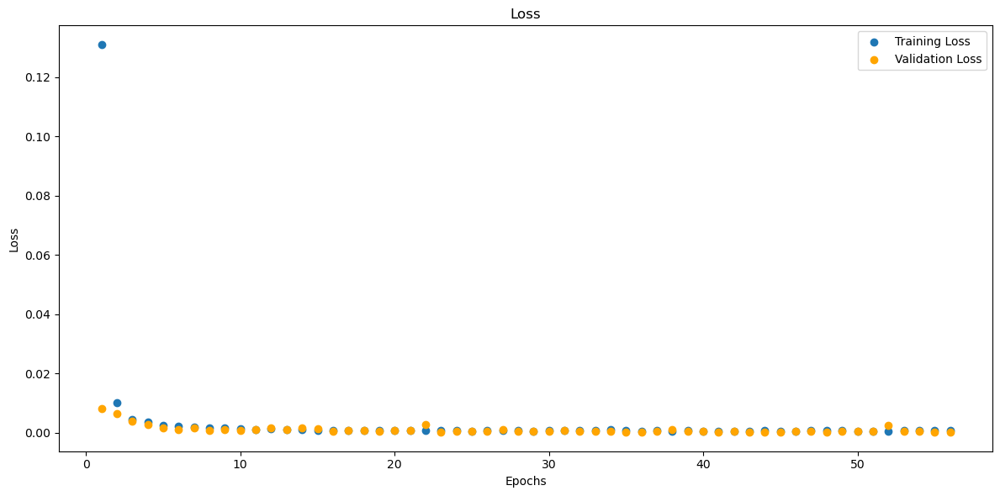

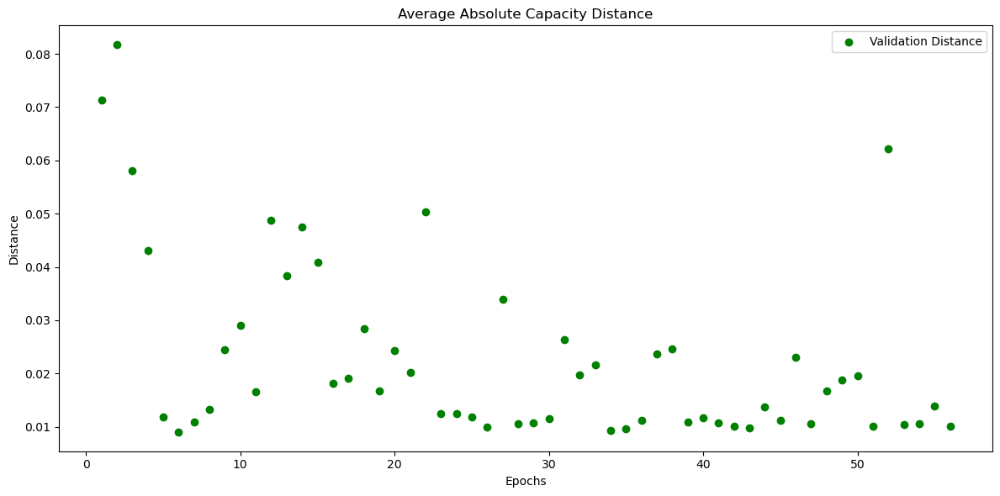

In [376]:
# B0005_combined_mm
model_B0005_combined_mm = LSTM_2(input_shape=input_shape_combined)
model_B0005_combined_mm, train_losses_B0005_combined_mm, val_losses_B0005_combined_mm, val_distances_B0005_combined_mm, metrics_history_B0005_combined_mm = train(data_loaders['B0005_combined_mm_val_loader'], data_loaders['B0005_combined_mm_train_loader'], model_B0005_combined_mm)
torch.save(model_B0005_combined_mm, os.path.join(folder_name, 'model_B0005_combined_mm.pth'))

Test Loss: 0.0006, Test Distance: 0.0180, Test Accuracy: 4.7619, SNR: 6.9859
##Metrics##:
MAE : 0.019809897989034653
MSE : 0.0005854825139977038
RMSE : 0.151689812541008
R-squared : -inf
Count: 21


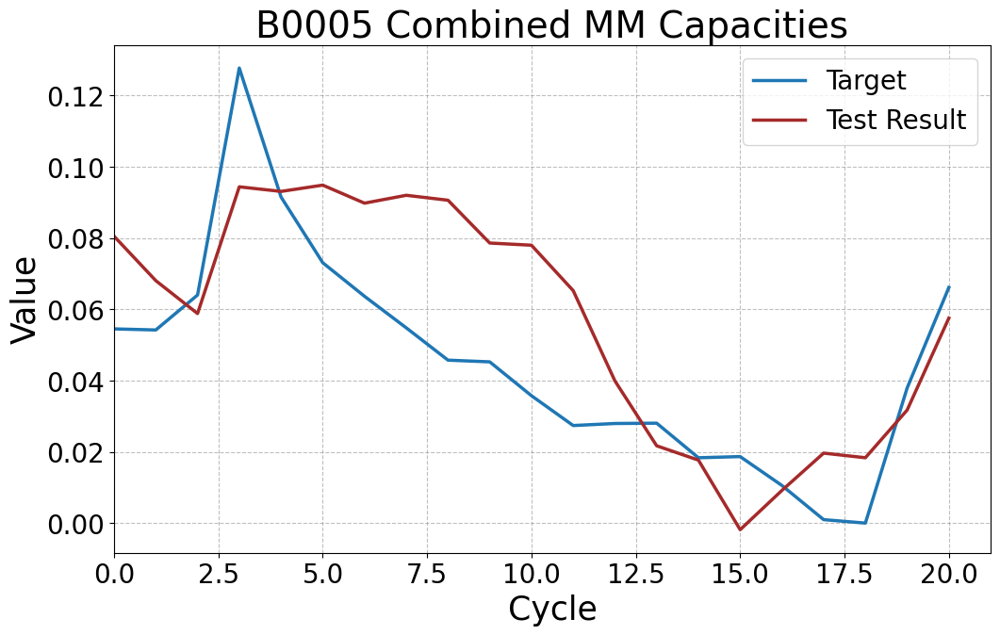

In [377]:
# B0005_combined_mm
model_B0005_combined_mm = torch.load('6. LSTM Models/model_B0005_combined_mm.pth')
y_target_B0005_combined_mm, y_testresult_B0005_combined_mm = test(model_B0005_combined_mm, data_loaders['B0005_combined_mm_test_loader'])
y_target_B0005_combined_mm = flatten_and_concatenate(y_target_B0005_combined_mm)
y_testresult_B0005_combined_mm = flatten_and_concatenate(y_testresult_B0005_combined_mm)
plot_tensors(y_target_B0005_combined_mm, y_testresult_B0005_combined_mm, labels=["Target", "Test Result"], title="B0005 Combined MM Capacities")


Test on complete dataset.

Test Loss: 0.0004, Test Distance: 0.0112, Test Accuracy: 56.6667, SNR: 31.4088
##Metrics##:
MAE : 0.011239703744649887
MSE : 0.000250806100666523
RMSE : 0.1158706396818161
R-squared : -2.1769778728485107
Count: 150


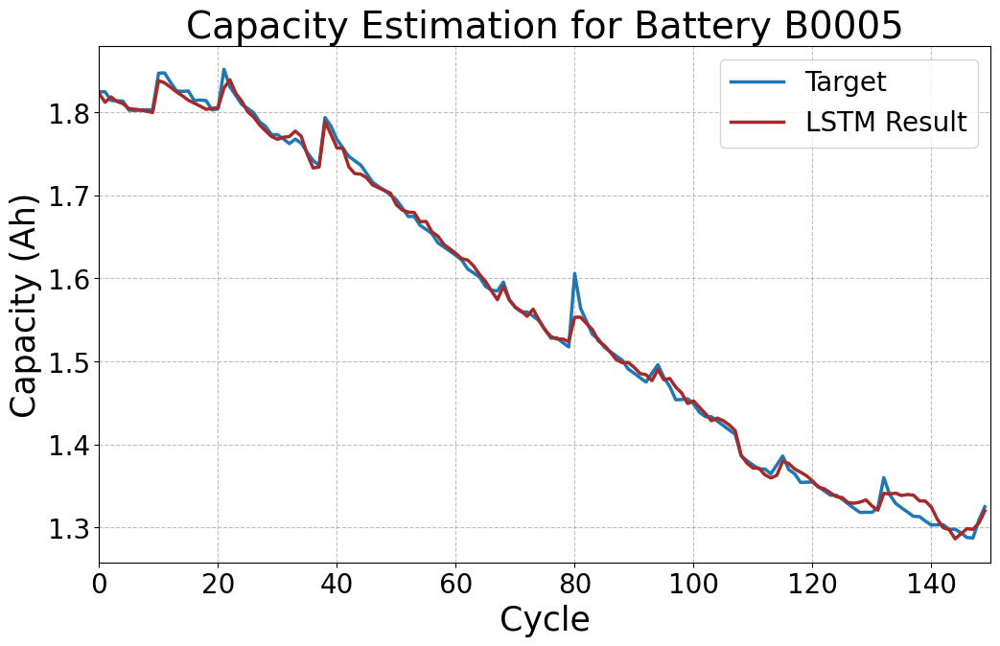

In [378]:
# Run the test on the model
y_target_B0005_combined_mm, y_testresult_B0005_combined_mm = test(model_B0005_combined_mm, data_loaders['B0005_combined_mm_final_test_loader'])

# Flatten and concatenate the results
y_target_B0005_combined_mm = flatten_and_concatenate(y_target_B0005_combined_mm)
y_testresult_B0005_combined_mm = flatten_and_concatenate(y_testresult_B0005_combined_mm)

# Assuming scaler_y_comb_B0005 was used for normalization earlier
# Inverse the normalization process for both target and prediction
original_y_target_B0005_combined_mm = scaler_y_comb_mm_B0005.inverse_transform(y_target_B0005_combined_mm.numpy().reshape(-1, 1))
original_y_testresult_B0005_combined_mm = scaler_y_comb_mm_B0005.inverse_transform(y_testresult_B0005_combined_mm.numpy().reshape(-1, 1))

# Convert the numpy arrays back to tensors
original_y_target_B0005_combined_mm = torch.tensor(original_y_target_B0005_combined_mm)
original_y_testresult_B0005_combined_mm = torch.tensor(original_y_testresult_B0005_combined_mm)
# Plot the inverse transformed results
plot_tensors(original_y_target_B0005_combined_mm, original_y_testresult_B0005_combined_mm, labels=["Target", "LSTM Result"], title="Capacity Estimation for Battery B0005",file_name="B0005_combined_mm", ylabel="Capacity (Ah)", save_dir="11. LSTM Capacity Plots")

In [379]:
# Convert tensors to numpy arrays and flatten to 1D
original_y_target_B0005_combined_mm = original_y_target_B0005_combined_mm.numpy().flatten()
original_y_testresult_B0005_combined_mm = original_y_testresult_B0005_combined_mm.numpy().flatten()

# Create a DataFrame to store the data with new column names
df = pd.DataFrame({
    "y_target_B0005_LSTM": original_y_target_B0005_combined_mm,
    "y_test_B0005_LSTM": original_y_testresult_B0005_combined_mm
})

# Define the directory and file path
save_dir = "15. Results"
if not os.path.exists(save_dir):
    os.makedirs(save_dir)  # Create the directory if it doesn't exist

csv_file_path = os.path.join(save_dir, "B0005_LSTM_results.csv")

# Save the DataFrame to a CSV file
df.to_csv(csv_file_path, index=False)

print(f"Data has been saved to {csv_file_path}")

Data has been saved to 15. Results\B0005_LSTM_results.csv


SOH plot

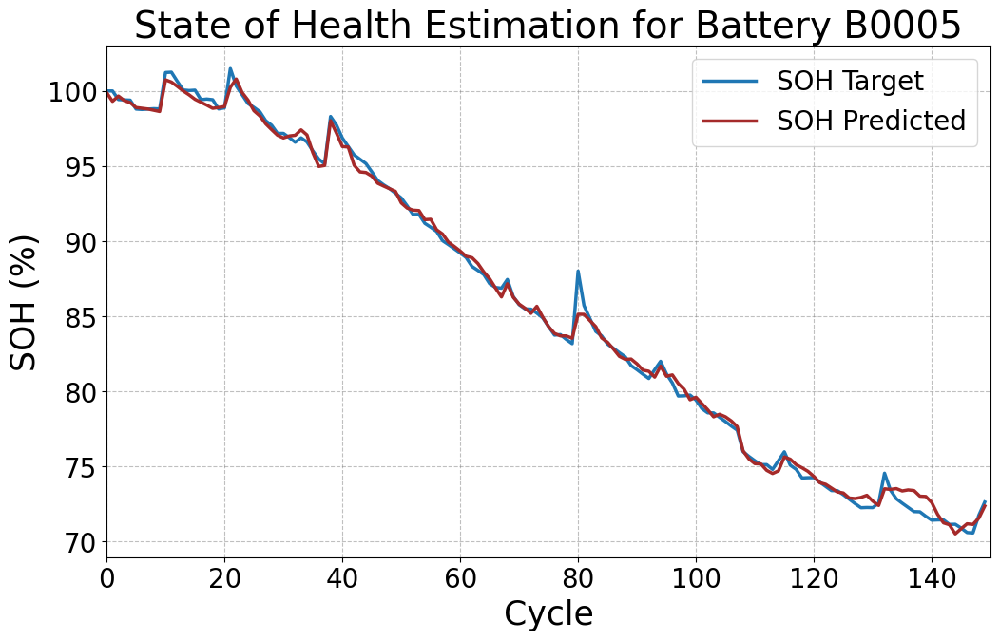

In [380]:
plot_soh(original_y_target_B0005_combined_mm, original_y_testresult_B0005_combined_mm,"State of Health Estimation for Battery B0005", file_name="B0005_combined_mm")

Model 8 - B0005 - Standard Scaler - Combined Data

c:\Users\jawaher.alhaj\AppData\Local\anaconda3\envs\myenv\lib\site-packages\torch\nn\modules\rnn.py:83: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.5 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
c:\Users\jawaher.alhaj\OneDrive - Technology Innovation Institute\Desktop\Dissertation\Nasa Battery Dataset\Single Battery Model\analysis.py:20: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\b\abs_8f7uhuge1i\croot\pytorch-select_1717607507421\work\aten\src\ATen\native\ReduceOps.cpp:1807.)
  target_std = torch.std(targets)


Epoch 1/120, Training Loss: 0.1614, Validation Loss: 1.3154
Validation Distance: 1.3140, Validation Accuracy: 0.0000, SNR: -0.8186
##Metrics##:
MAE : 1.0078940391540527
MSE : 1.2822903394699097
RMSE : 1.005167841911316
R-squared : -inf
Count: 26
Epoch 2/120, Training Loss: 0.0461, Validation Loss: 0.2736
Validation Distance: 0.5739, Validation Accuracy: 0.0000, SNR: 5.7088
##Metrics##:
MAE : 0.4277893900871277
MSE : 0.23714397847652435
RMSE : 0.6567486524581909
R-squared : -inf
Count: 26
Epoch 3/120, Training Loss: 0.0182, Validation Loss: 0.1587
Validation Distance: 0.4196, Validation Accuracy: 0.0000, SNR: 8.0403
##Metrics##:
MAE : 0.30365121364593506
MSE : 0.12347923219203949
RMSE : 0.5556504130363464
R-squared : -inf
Count: 26
Epoch 4/120, Training Loss: 0.0086, Validation Loss: 0.2788
Validation Distance: 0.5640, Validation Accuracy: 0.0000, SNR: 5.9208
##Metrics##:
MAE : 0.42179960012435913
MSE : 0.22880998253822327
RMSE : 0.6520386338233948
R-squared : -inf
Count: 26
Epoch 5/120

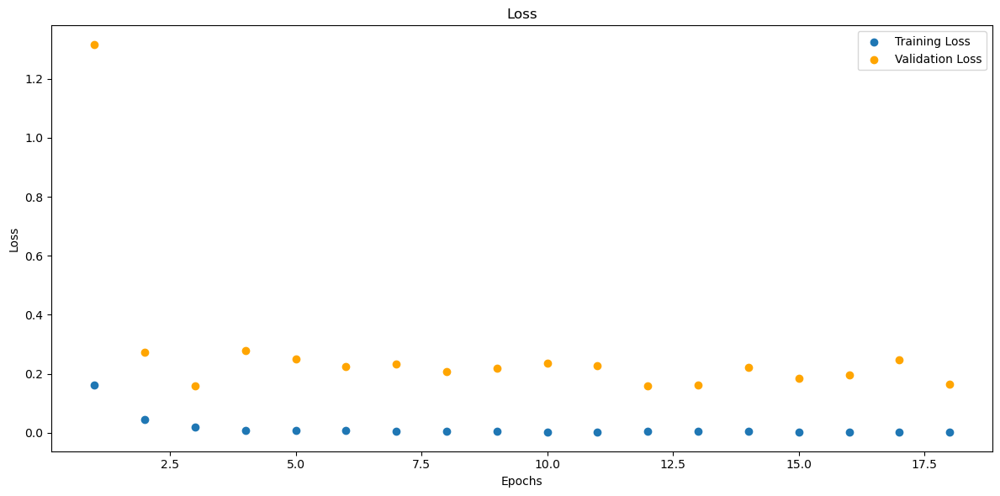

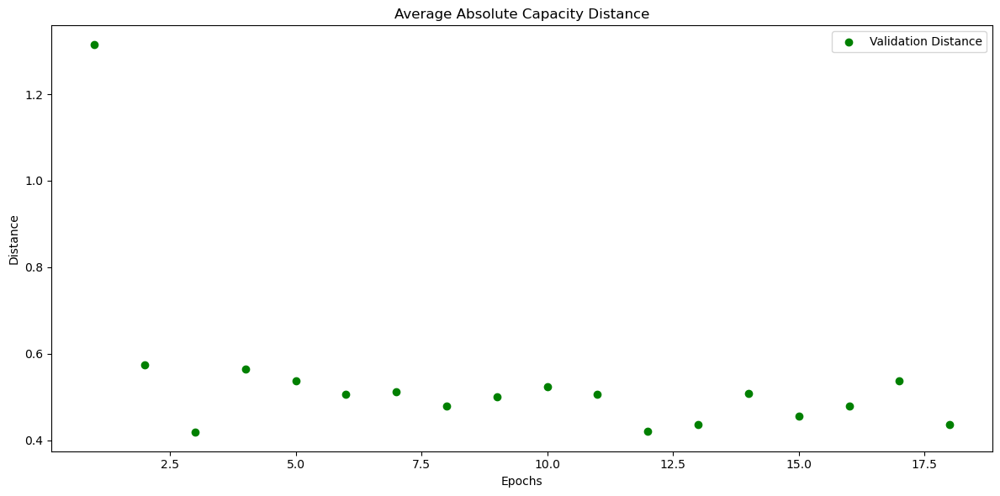

In [381]:
# B0005_combined_std
model_B0005_combined_std = LSTM_2(input_shape=input_shape_combined)
model_B0005_combined_std, train_losses_B0005_combined_std, val_losses_B0005_combined_std, val_distances_B0005_combined_std, metrics_history_B0005_combined_std = train(data_loaders['B0005_combined_std_val_loader'], data_loaders['B0005_combined_std_train_loader'], model_B0005_combined_std)
torch.save(model_B0005_combined_std, os.path.join(folder_name, 'model_B0005_combined_std.pth'))

Test Loss: 0.6866, Test Distance: 0.8068, Test Accuracy: 0.0000, SNR: 4.3614
##Metrics##:
MAE : 0.8192425966262817
MSE : 0.6869236826896667
RMSE : 0.906222403049469
R-squared : -inf
Count: 21


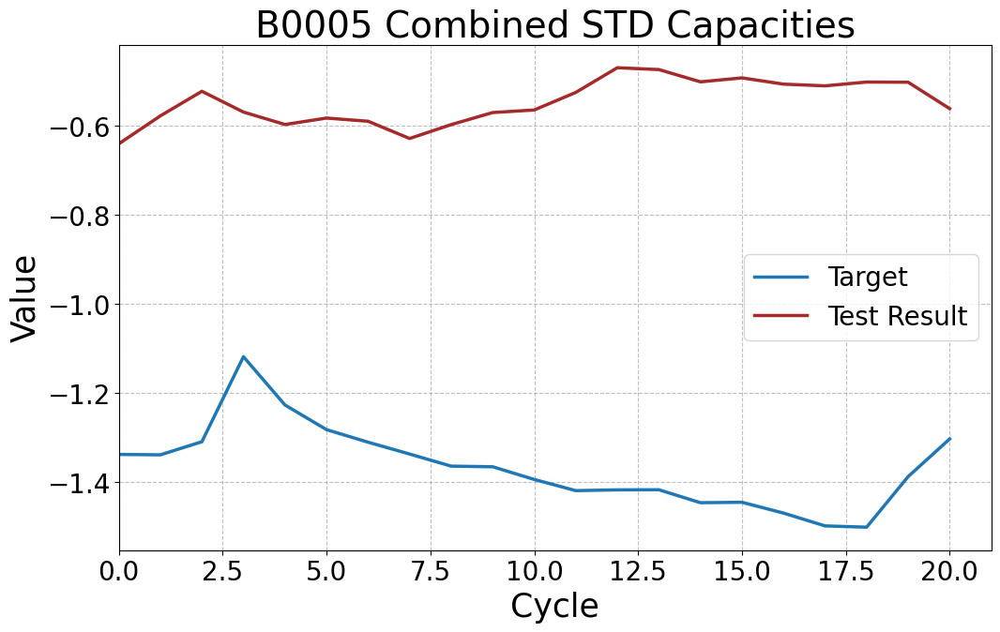

In [382]:
# B0005_combined_std
model_B0005_combined_std = torch.load('6. LSTM Models/model_B0005_combined_std.pth')
y_target_B0005_combined_std, y_testresult_B0005_combined_std = test(model_B0005_combined_std, data_loaders['B0005_combined_std_test_loader'])
y_target_B0005_combined_std = flatten_and_concatenate(y_target_B0005_combined_std)
y_testresult_B0005_combined_std = flatten_and_concatenate(y_testresult_B0005_combined_std)
plot_tensors(y_target_B0005_combined_std, y_testresult_B0005_combined_std, labels=["Target", "Test Result"], title="B0005 Combined STD Capacities")


Test on complete dataset.

Test Loss: 0.1197, Test Distance: 0.2343, Test Accuracy: 9.3333, SNR: 8.7938
##Metrics##:
MAE : 0.23428522050380707
MSE : 0.12677647173404694
RMSE : 0.4914877712726593
R-squared : -221.20794677734375
Count: 150


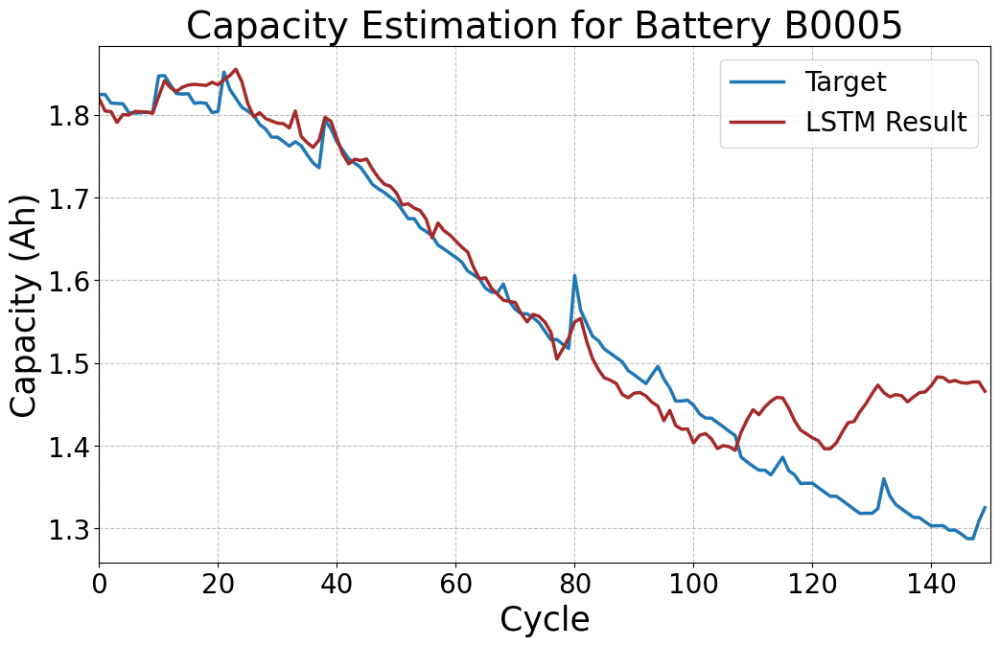

In [383]:
# Run the test on the model
y_target_B0005_combined_std, y_testresult_B0005_combined_std = test(model_B0005_combined_std, data_loaders['B0005_combined_std_final_test_loader'])

# Flatten and concatenate the results
y_target_B0005_combined_std = flatten_and_concatenate(y_target_B0005_combined_std)
y_testresult_B0005_combined_std = flatten_and_concatenate(y_testresult_B0005_combined_std)

# Assuming scaler_y_comb_B0005 was used for normalization earlier
# Inverse the normalization process for both target and prediction
original_y_target_B0005_combined_std = scaler_y_comb_std_B0005.inverse_transform(y_target_B0005_combined_std.numpy().reshape(-1, 1))
original_y_testresult_B0005_combined_std = scaler_y_comb_std_B0005.inverse_transform(y_testresult_B0005_combined_std.numpy().reshape(-1, 1))

# Convert the numpy arrays back to tensors
original_y_target_B0005_combined_std = torch.tensor(original_y_target_B0005_combined_std)
original_y_testresult_B0005_combined_std = torch.tensor(original_y_testresult_B0005_combined_std)

# Plot the inverse transformed results
plot_tensors(original_y_target_B0005_combined_std, original_y_testresult_B0005_combined_std, labels=["Target", "LSTM Result"], title="Capacity Estimation for Battery B0005", file_name="B0005_combined_std", ylabel="Capacity (Ah)", save_dir="11. LSTM Capacity Plots/")


SOH Plot.

C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_23676\540638711.py:20: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_target_tensor = torch.tensor(soh_target)
C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_23676\540638711.py:21: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_predicted_tensor = torch.tensor(soh_predicted)


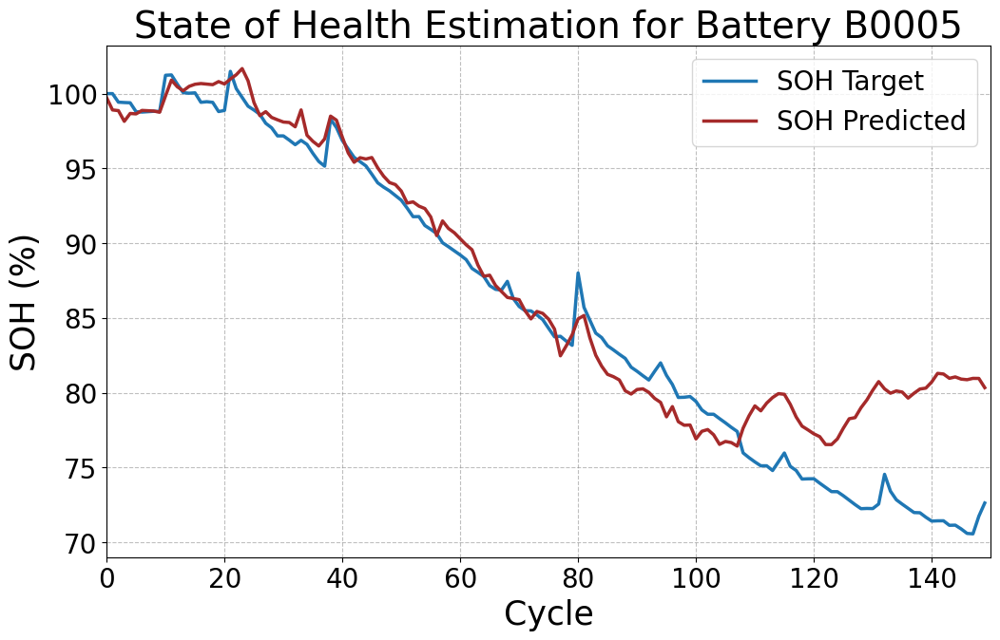

In [384]:
plot_soh(original_y_target_B0005_combined_std, original_y_testresult_B0005_combined_std,"State of Health Estimation for Battery B0005", file_name="B0005_combined_std")

Model 9 - B0005 - Robust Scaler - Combined Data

c:\Users\jawaher.alhaj\AppData\Local\anaconda3\envs\myenv\lib\site-packages\torch\nn\modules\rnn.py:83: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.5 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
c:\Users\jawaher.alhaj\OneDrive - Technology Innovation Institute\Desktop\Dissertation\Nasa Battery Dataset\Single Battery Model\analysis.py:20: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\b\abs_8f7uhuge1i\croot\pytorch-select_1717607507421\work\aten\src\ATen\native\ReduceOps.cpp:1807.)
  target_std = torch.std(targets)


Epoch 1/120, Training Loss: 0.2272, Validation Loss: 0.0633
Validation Distance: 0.1851, Validation Accuracy: 14.2857, SNR: 6.3854
##Metrics##:
MAE : 0.16090044379234314
MSE : 0.04049476236104965
RMSE : 0.4192146062850952
R-squared : -inf
Count: 26
Epoch 2/120, Training Loss: 0.0291, Validation Loss: 0.0819
Validation Distance: 0.2408, Validation Accuracy: 0.0000, SNR: 4.7718
##Metrics##:
MAE : 0.1951071172952652
MSE : 0.050554219633340836
RMSE : 0.4459266662597656
R-squared : -inf
Count: 26
Epoch 3/120, Training Loss: 0.0087, Validation Loss: 0.0616
Validation Distance: 0.2032, Validation Accuracy: 0.0000, SNR: 5.6725
##Metrics##:
MAE : 0.16071447730064392
MSE : 0.03441518917679787
RMSE : 0.40408825874328613
R-squared : -inf
Count: 26
Epoch 4/120, Training Loss: 0.0042, Validation Loss: 0.0400
Validation Distance: 0.1430, Validation Accuracy: 0.0000, SNR: 7.2323
##Metrics##:
MAE : 0.10882154852151871
MSE : 0.017021480947732925
RMSE : 0.33372604846954346
R-squared : -inf
Count: 26
Epoc

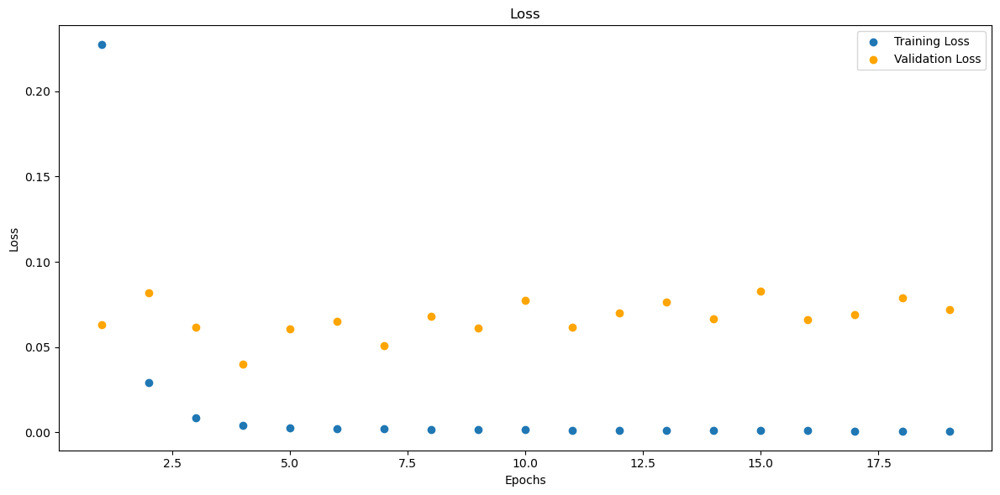

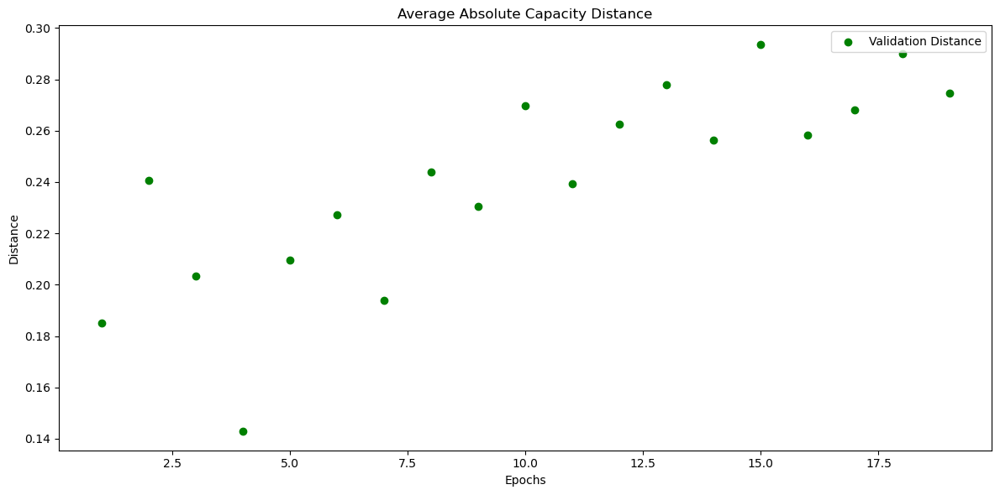

In [385]:
# B0005_combined_rob
model_B0005_combined_rob = LSTM_2(input_shape=input_shape_combined)
model_B0005_combined_rob, train_losses_B0005_combined_rob, val_losses_B0005_combined_rob, val_distances_B0005_combined_rob, metrics_history_B0005_combined_rob = train(data_loaders['B0005_combined_rob_val_loader'], data_loaders['B0005_combined_rob_train_loader'], model_B0005_combined_rob)
torch.save(model_B0005_combined_rob, os.path.join(folder_name, 'model_B0005_combined_rob.pth'))

Test Loss: 0.1026, Test Distance: 0.2543, Test Accuracy: 0.0000, SNR: 7.7318
##Metrics##:
MAE : 0.2601565718650818
MSE : 0.07016020268201828
RMSE : 0.5123661756515503
R-squared : -inf
Count: 21


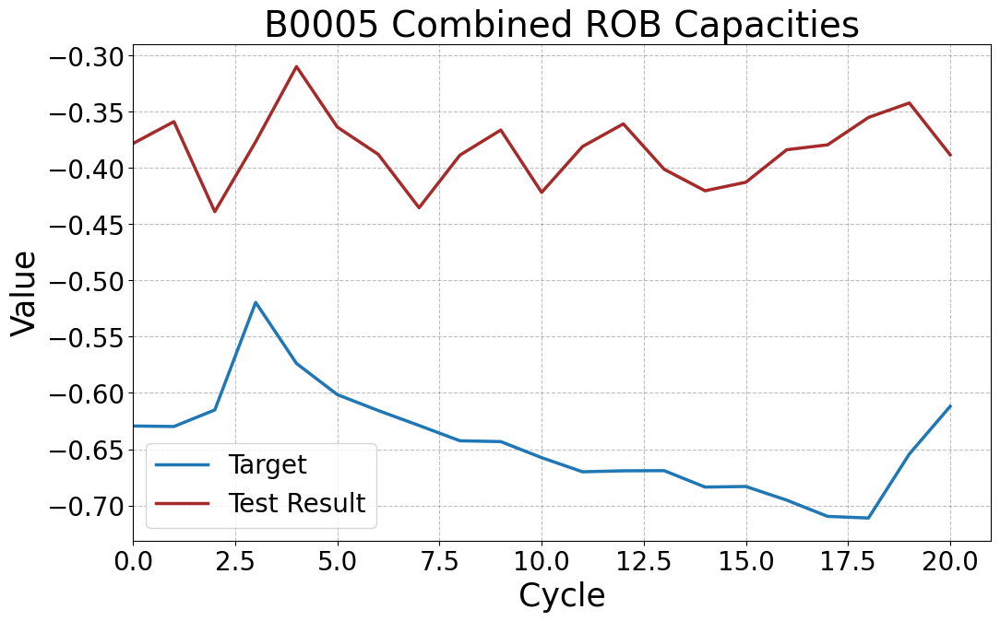

In [386]:
# B0005_combined_rob
model_B0005_combined_rob = torch.load('6. LSTM Models/model_B0005_combined_rob.pth')
y_target_B0005_combined_rob, y_testresult_B0005_combined_rob = test(model_B0005_combined_rob, data_loaders['B0005_combined_rob_test_loader'])
y_target_B0005_combined_rob = flatten_and_concatenate(y_target_B0005_combined_rob)
y_testresult_B0005_combined_rob = flatten_and_concatenate(y_testresult_B0005_combined_rob)
plot_tensors(y_target_B0005_combined_rob, y_testresult_B0005_combined_rob, labels=["Target", "Test Result"], title="B0005 Combined ROB Capacities")


Test on complete dataset.

In [387]:
# Run the test on the model
y_target_B0005_combined_rob, y_testresult_B0005_combined_rob = test(model_B0005_combined_rob, data_loaders['B0005_combined_rob_final_test_loader'])

# Flatten and concatenate the results
y_target_B0005_combined_rob = flatten_and_concatenate(y_target_B0005_combined_rob)
y_testresult_B0005_combined_rob = flatten_and_concatenate(y_testresult_B0005_combined_rob)

# # Assuming scaler_y_comb_B0005 was used for normalization earlier
# # Inverse the normalization process for both target and prediction
# original_y_target_B0005_combined_rob = scaler_y_comb_rob_B0005.inverse_transform(y_target_B0005_combined_rob.numpy().reshape(-1, 1))
# original_y_testresult_B0005_combined_rob = scaler_y_comb_rob_B0005.inverse_transform(y_testresult_B0005_combined_rob.numpy().reshape(-1, 1))

# # Convert the numpy arrays back to tensors
# original_y_target_B0005_combined_rob = torch.tensor(original_y_target_B0005_combined_rob)
# original_y_testresult_B0005_combined_rob = torch.tensor(original_y_testresult_B0005_combined_rob)

# # Plot the inverse transformed results
# plot_tensors(original_y_target_B0005_combined_rob, original_y_testresult_B0005_combined_rob, labels=["Target", "LSTM Result"], title="Capacity Estimation for Battery B0005", file_name="B0005_combined_rob", ylabel="Capacity (Ah)", save_dir="11. LSTM Capacity Plots")


Test Loss: 0.0213, Test Distance: 0.0837, Test Accuracy: 12.6667, SNR: 12.2165
##Metrics##:
MAE : 0.08366365730762482
MSE : 0.01447274163365364
RMSE : 0.2975693345069885
R-squared : -99.51348114013672
Count: 150


SOH Plot.

In [388]:
# plot_soh(original_y_target_B0005_combined_rob, original_y_testresult_B0005_combined_rob, "State of Health Estimation for Battery B0005", file_name="B0005_combined_rob")

Model 10 - B0006 - MinMax Scaler - Charging Data

Epoch 1/120, Training Loss: 0.1268, Validation Loss: 0.0168
Validation Distance: 0.1348, Validation Accuracy: 0.0000, SNR: -0.9341
##Metrics##:
MAE : 0.1043534129858017
MSE : 0.014092251658439636
RMSE : 0.32405203580856323
R-squared : -inf
Count: 26
Epoch 2/120, Training Loss: 0.0353, Validation Loss: 0.0324
Validation Distance: 0.1889, Validation Accuracy: 0.0000, SNR: -3.3593
##Metrics##:
MAE : 0.1477779746055603
MSE : 0.02758278325200081
RMSE : 0.38490721583366394
R-squared : -inf
Count: 26
Epoch 3/120, Training Loss: 0.0103, Validation Loss: 0.0547
Validation Distance: 0.2507, Validation Accuracy: 0.0000, SNR: -5.6384
##Metrics##:
MAE : 0.1956469863653183
MSE : 0.04800311475992203
RMSE : 0.4425435960292816
R-squared : -inf
Count: 26
Epoch 4/120, Training Loss: 0.0083, Validation Loss: 0.0198
Validation Distance: 0.1463, Validation Accuracy: 0.0000, SNR: -2.1229
##Metrics##:
MAE : 0.11006978154182434
MSE : 0.015725627541542053
RMSE : 0.3323737382888794
R-squared : -inf
Count: 26
Epo

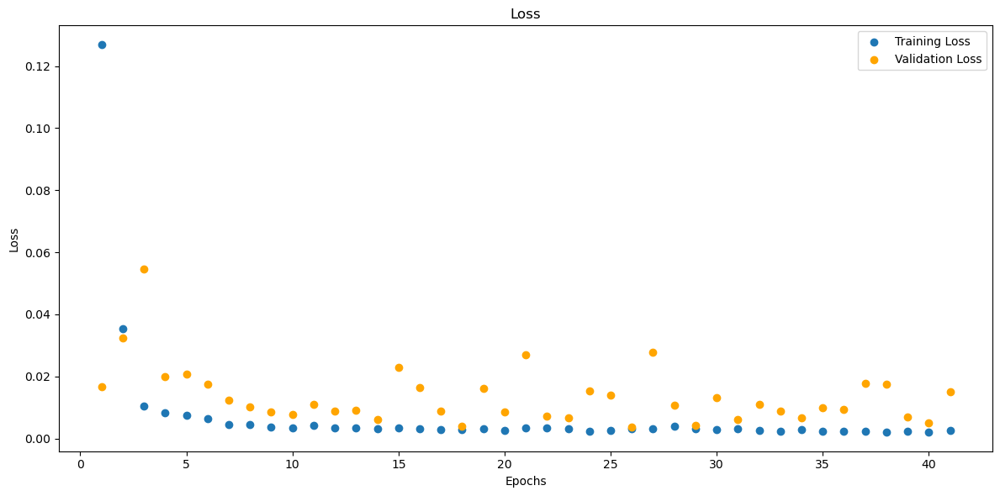

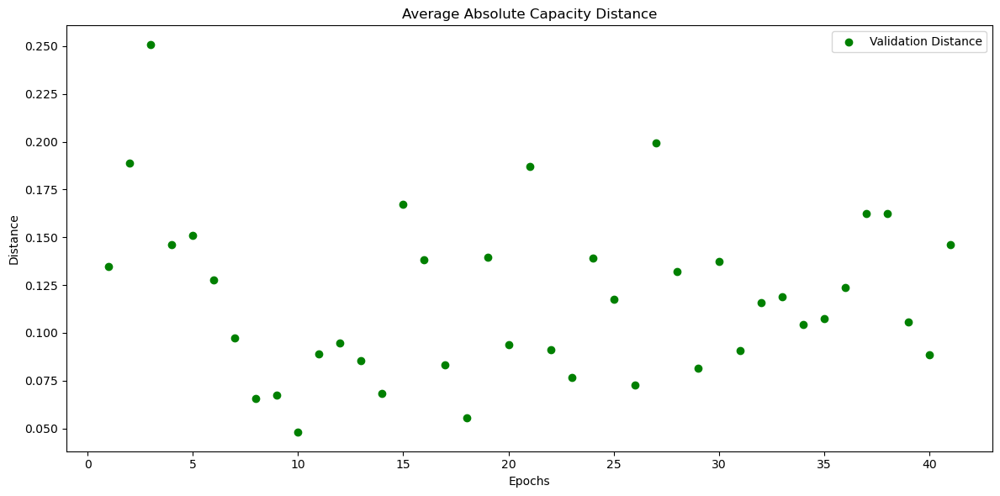

In [389]:
# B0006_charge_mm
model_B0006_charge_mm = LSTM_2(input_shape=input_shape_single)
model_B0006_charge_mm, train_losses_B0006_charge_mm, val_losses_B0006_charge_mm, val_distances_B0006_charge_mm, metrics_history_B0006_charge_mm = train(data_loaders['B0006_charge_mm_val_loader'], data_loaders['B0006_charge_mm_train_loader'], model_B0006_charge_mm)
torch.save(model_B0006_charge_mm, os.path.join(folder_name, 'model_B0006_charge_mm.pth'))

Test Loss: 0.0126, Test Distance: 0.1074, Test Accuracy: 0.0000, SNR: -3.2060
##Metrics##:
MAE : 0.10392795503139496
MSE : 0.012490388937294483
RMSE : 0.3246559202671051
R-squared : -inf
Count: 21


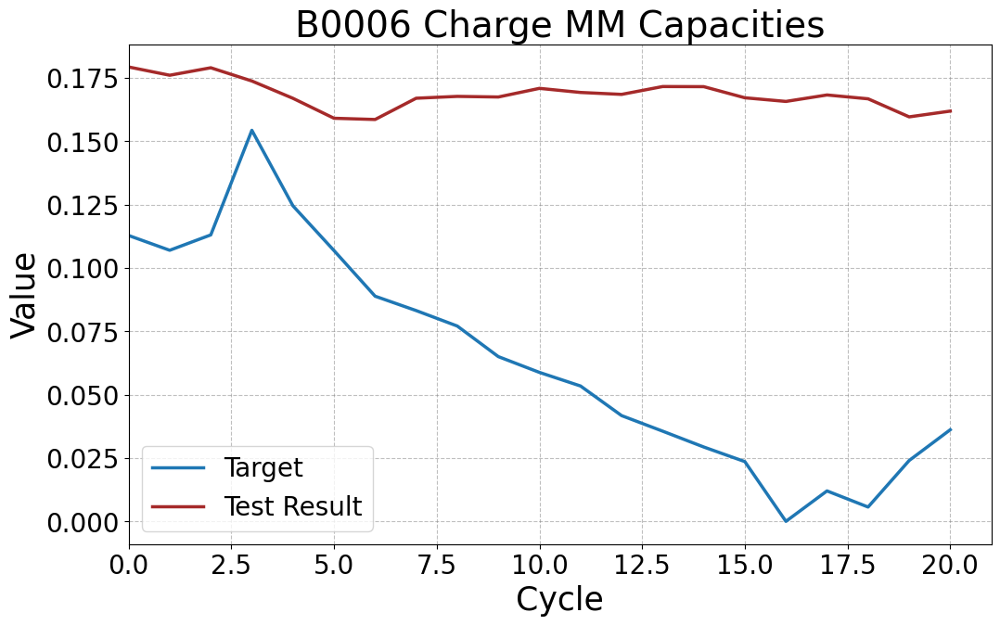

In [191]:
# B0006_charge_mm
model_B0006_charge_mm = torch.load('6. LSTM Models/model_B0006_charge_mm.pth')
y_target_B0006_charge_mm, y_testresult_B0006_charge_mm = test(model_B0006_charge_mm, data_loaders['B0006_charge_mm_test_loader'])
y_target_B0006_charge_mm = flatten_and_concatenate(y_target_B0006_charge_mm)
y_testresult_B0006_charge_mm = flatten_and_concatenate(y_testresult_B0006_charge_mm)
plot_tensors(y_target_B0006_charge_mm, y_testresult_B0006_charge_mm, labels=["Target", "Test Result"], title="B0006 Charge MM Capacities")


Test on complete dataset.

Test Loss: 0.0368, Test Distance: 0.1776, Test Accuracy: 0.0000, SNR: 7.6397
##Metrics##:
MAE : 0.17761632800102234
MSE : 0.04374568164348602
RMSE : 0.42499613761901855
R-squared : -186.455810546875
Count: 150


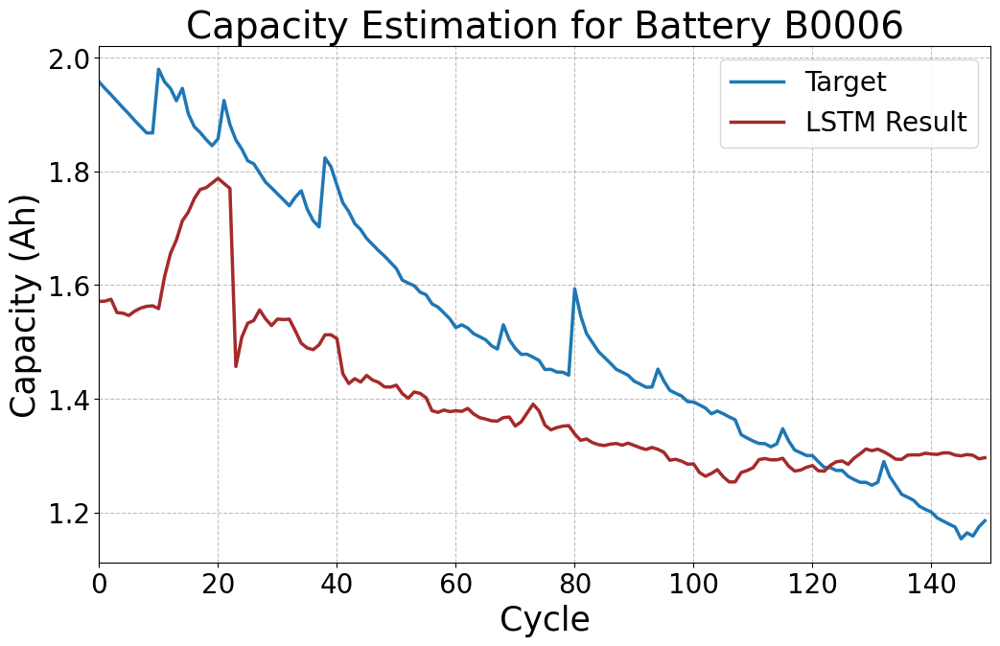

In [192]:
# Run the test on the model
y_target_B0006_charge_mm, y_testresult_B0006_charge_mm = test(model_B0006_charge_mm, data_loaders['B0006_charge_mm_final_test_loader'])

# Flatten and concatenate the results
y_target_B0006_charge_mm = flatten_and_concatenate(y_target_B0006_charge_mm)
y_testresult_B0006_charge_mm = flatten_and_concatenate(y_testresult_B0006_charge_mm)

# Assuming scaler_y_charge_B0006 was used for normalization earlier
# Inverse the normalization process for both target and prediction
original_y_target_B0006_charge_mm = scaler_y_charge_mm_B0006.inverse_transform(y_target_B0006_charge_mm.numpy().reshape(-1, 1))
original_y_testresult_B0006_charge_mm = scaler_y_charge_mm_B0006.inverse_transform(y_testresult_B0006_charge_mm.numpy().reshape(-1, 1))

# Convert the numpy arrays back to tensors
original_y_target_B0006_charge_mm = torch.tensor(original_y_target_B0006_charge_mm)
original_y_testresult_B0006_charge_mm = torch.tensor(original_y_testresult_B0006_charge_mm)

# Plot the inverse transformed results
plot_tensors(original_y_target_B0006_charge_mm, original_y_testresult_B0006_charge_mm, labels=["Target", "LSTM Result"], title="Capacity Estimation for Battery B0006", file_name="B0006_charge_mm", ylabel="Capacity (Ah)", save_dir="11. LSTM Capacity Plots")


SOH Plot.

C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_23676\540638711.py:20: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_target_tensor = torch.tensor(soh_target)
C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_23676\540638711.py:21: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_predicted_tensor = torch.tensor(soh_predicted)


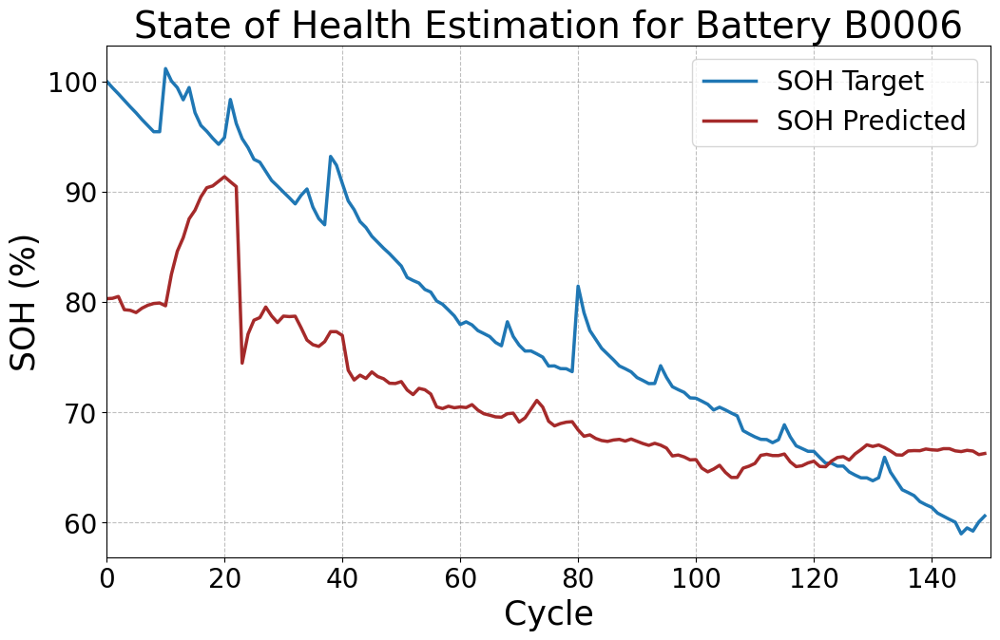

In [193]:
plot_soh(original_y_target_B0006_charge_mm, original_y_testresult_B0006_charge_mm, "State of Health Estimation for Battery B0006", file_name="B0006_charge_mm")

Model 11 - B0006 - Standard Scaler - Charging Data

Epoch 1/120, Training Loss: 0.2217, Validation Loss: 0.1618
Validation Distance: 0.4832, Validation Accuracy: 0.0000, SNR: 5.5691
##Metrics##:
MAE : 0.3463459610939026
MSE : 0.16380636394023895
RMSE : 0.5902208685874939
R-squared : -inf
Count: 26
Epoch 2/120, Training Loss: 0.0595, Validation Loss: 0.1669
Validation Distance: 0.4840, Validation Accuracy: 0.0000, SNR: 5.1347
##Metrics##:
MAE : 0.34290868043899536
MSE : 0.16769066452980042
RMSE : 0.5897670388221741
R-squared : -inf
Count: 26
Epoch 3/120, Training Loss: 0.0470, Validation Loss: 0.2825
Validation Distance: 0.6018, Validation Accuracy: 0.0000, SNR: 3.6547
##Metrics##:
MAE : 0.4462814927101135
MSE : 0.2628057301044464
RMSE : 0.6697426438331604
R-squared : -inf
Count: 26
Epoch 4/120, Training Loss: 0.0328, Validation Loss: 0.2136
Validation Distance: 0.5318, Validation Accuracy: 0.0000, SNR: 4.6879
##Metrics##:
MAE : 0.39311137795448303
MSE : 0.20718908309936523
RMSE : 0.6293647885322571
R-squared : -inf
Count: 26
Epoch 5/120

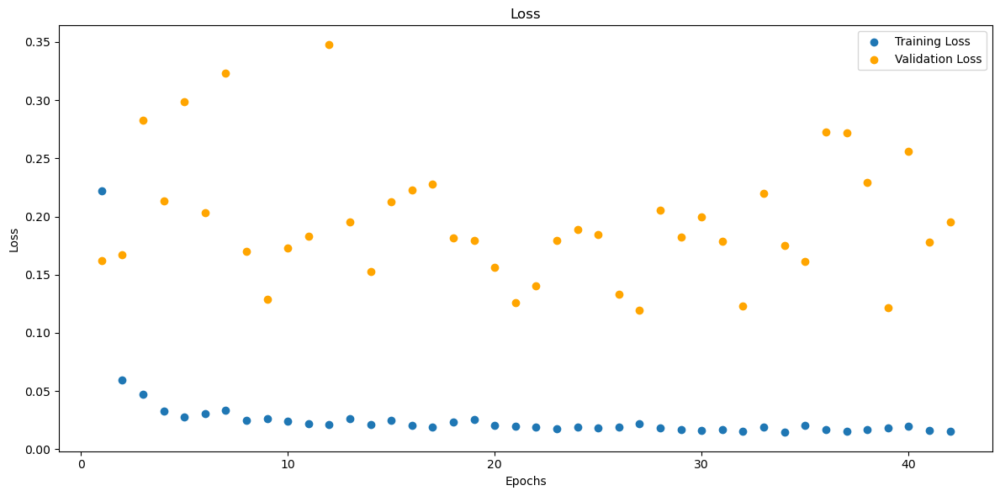

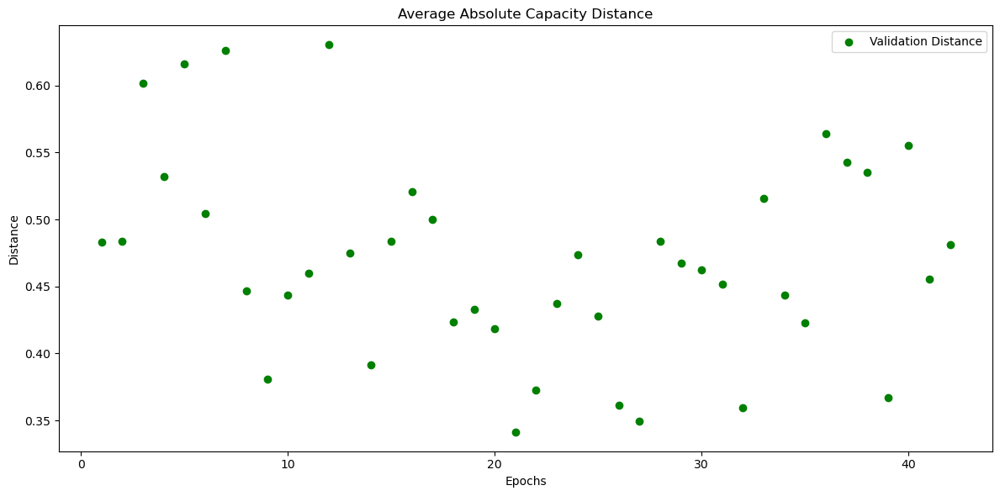

In [390]:
# B0006_charge_std
model_B0006_charge_std = LSTM_2(input_shape=input_shape_single)
model_B0006_charge_std, train_losses_B0006_charge_std, val_losses_B0006_charge_std, val_distances_B0006_charge_std, metrics_history_B0006_charge_std = train(data_loaders['B0006_charge_std_val_loader'], data_loaders['B0006_charge_std_train_loader'], model_B0006_charge_std)
torch.save(model_B0006_charge_std, os.path.join(folder_name, 'model_B0006_charge_std.pth'))

Test Loss: 0.6002, Test Distance: 0.7456, Test Accuracy: 0.0000, SNR: 5.1458
##Metrics##:
MAE : 0.7307887673377991
MSE : 0.5544276237487793
RMSE : 0.8556798100471497
R-squared : -inf
Count: 21


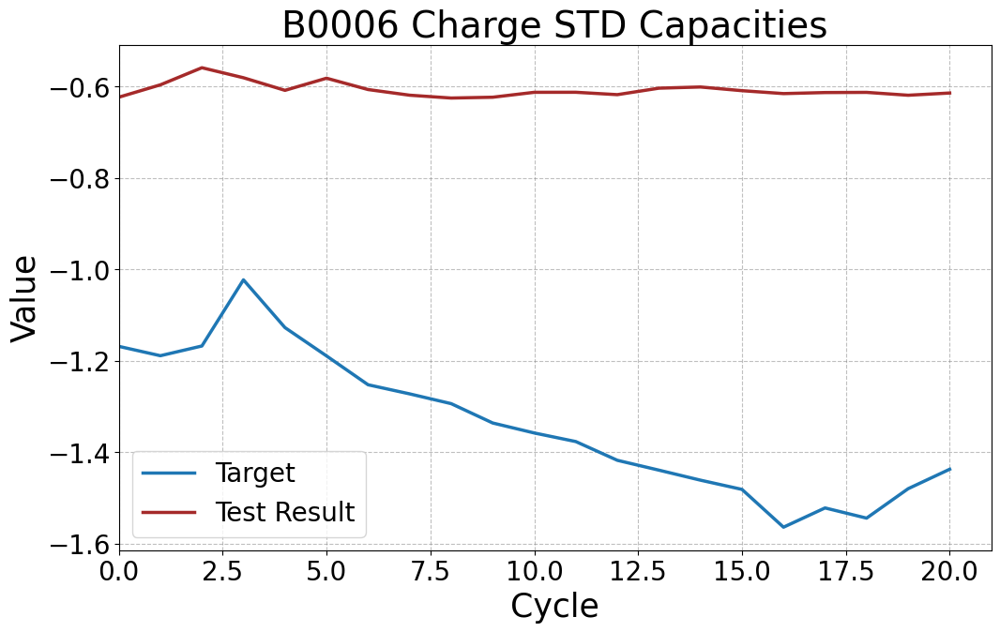

In [391]:
# B0006_charge_std
model_B0006_charge_std = torch.load('6. LSTM Models/model_B0006_charge_std.pth')
y_target_B0006_charge_std, y_testresult_B0006_charge_std = test(model_B0006_charge_std, data_loaders['B0006_charge_std_test_loader'])
y_target_B0006_charge_std = flatten_and_concatenate(y_target_B0006_charge_std)
y_testresult_B0006_charge_std = flatten_and_concatenate(y_testresult_B0006_charge_std)
plot_tensors(y_target_B0006_charge_std, y_testresult_B0006_charge_std, labels=["Target", "Test Result"], title="B0006 Charge STD Capacities")


Test on complete dataset.

Test Loss: 0.1028, Test Distance: 0.2098, Test Accuracy: 9.3333, SNR: 9.3125
##Metrics##:
MAE : 0.20982155203819275
MSE : 0.10408993065357208
RMSE : 0.46874821186065674
R-squared : -70.73208618164062
Count: 150


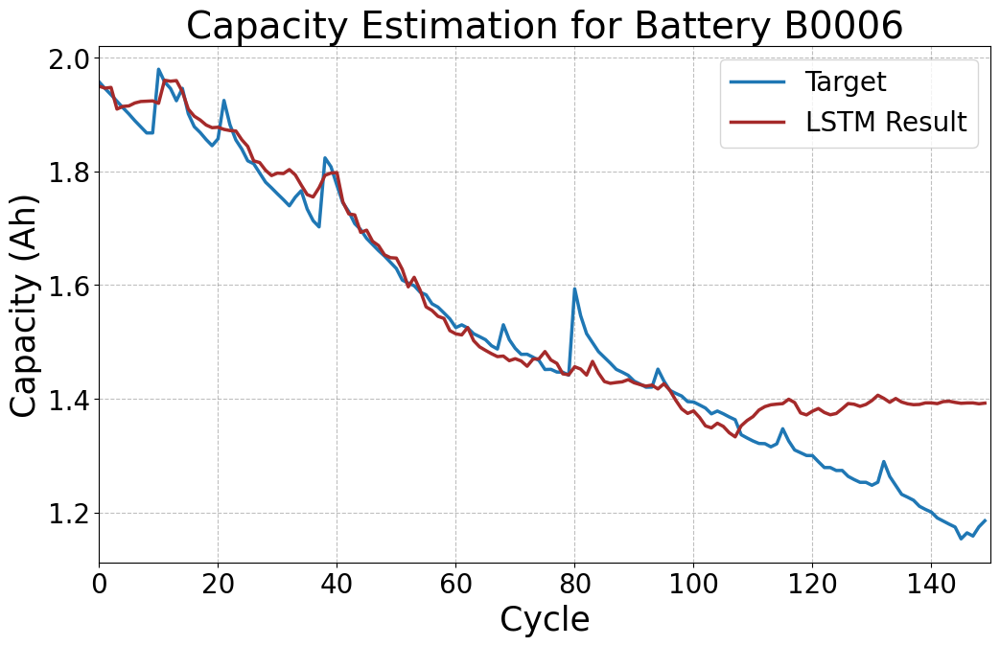

In [392]:
# Run the test on the model
y_target_B0006_charge_std, y_testresult_B0006_charge_std = test(model_B0006_charge_std, data_loaders['B0006_charge_std_final_test_loader'])

# Flatten and concatenate the results
y_target_B0006_charge_std = flatten_and_concatenate(y_target_B0006_charge_std)
y_testresult_B0006_charge_std = flatten_and_concatenate(y_testresult_B0006_charge_std)

# Assuming scaler_y_charge_B0006 was used for normalization earlier
# Inverse the normalization process for both target and prediction
original_y_target_B0006_charge_std = scaler_y_charge_std_B0006.inverse_transform(y_target_B0006_charge_std.numpy().reshape(-1, 1))
original_y_testresult_B0006_charge_std = scaler_y_charge_std_B0006.inverse_transform(y_testresult_B0006_charge_std.numpy().reshape(-1, 1))

# Convert the numpy arrays back to tensors
original_y_target_B0006_charge_std = torch.tensor(original_y_target_B0006_charge_std)
original_y_testresult_B0006_charge_std = torch.tensor(original_y_testresult_B0006_charge_std)

# Plot the inverse transformed results
plot_tensors(original_y_target_B0006_charge_std, original_y_testresult_B0006_charge_std, labels=["Target", "LSTM Result"], title="Capacity Estimation for Battery B0006", file_name="B0006_charge_std", ylabel="Capacity (Ah)", save_dir="11. LSTM Capacity Plots")


SOH Plot.

C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_23676\540638711.py:20: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_target_tensor = torch.tensor(soh_target)
C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_23676\540638711.py:21: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_predicted_tensor = torch.tensor(soh_predicted)


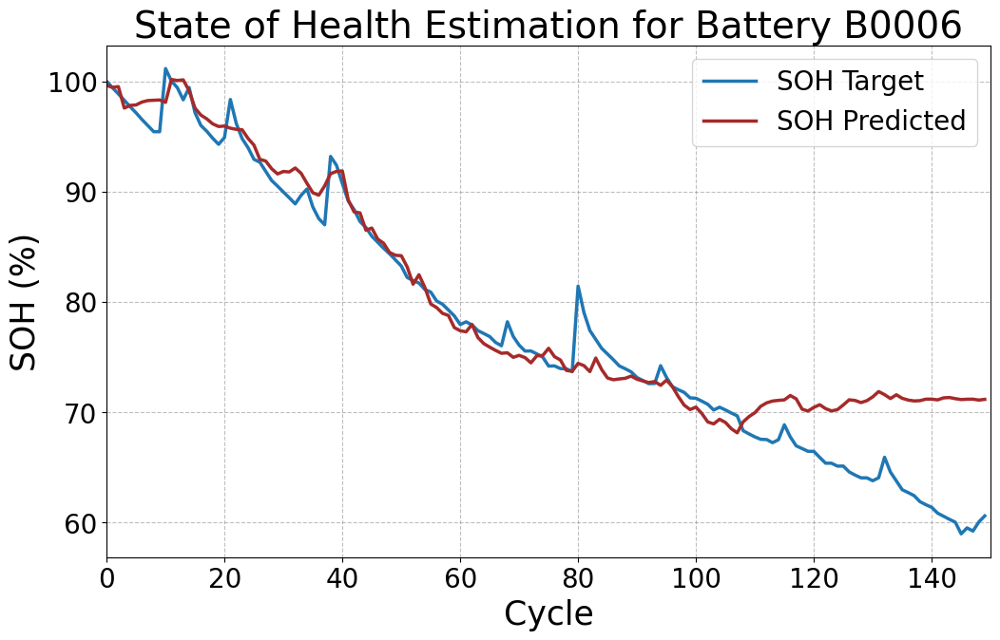

In [393]:
plot_soh(original_y_target_B0006_charge_std, original_y_testresult_B0006_charge_std, "State of Health Estimation for Battery B0006", file_name="B0006_charge_std")

Model 12 - B0006 - Robust Scaler - Charging Data

c:\Users\jawaher.alhaj\AppData\Local\anaconda3\envs\myenv\lib\site-packages\torch\nn\modules\rnn.py:83: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.5 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
c:\Users\jawaher.alhaj\OneDrive - Technology Innovation Institute\Desktop\Dissertation\Nasa Battery Dataset\Single Battery Model\analysis.py:20: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\b\abs_8f7uhuge1i\croot\pytorch-select_1717607507421\work\aten\src\ATen\native\ReduceOps.cpp:1807.)
  target_std = torch.std(targets)


Epoch 1/120, Training Loss: 0.1754, Validation Loss: 0.0832
Validation Distance: 0.2786, Validation Accuracy: 0.0000, SNR: 5.5502
##Metrics##:
MAE : 0.21885782480239868
MSE : 0.0653449073433876
RMSE : 0.4768833518028259
R-squared : -inf
Count: 26
Epoch 2/120, Training Loss: 0.0293, Validation Loss: 0.1724
Validation Distance: 0.4711, Validation Accuracy: 0.0000, SNR: 0.3355
##Metrics##:
MAE : 0.3680194020271301
MSE : 0.17176833748817444
RMSE : 0.6080479621887207
R-squared : -inf
Count: 26
Epoch 3/120, Training Loss: 0.0191, Validation Loss: 0.2489
Validation Distance: 0.6133, Validation Accuracy: 0.0000, SNR: -1.9930
##Metrics##:
MAE : 0.47189635038375854
MSE : 0.28422001004219055
RMSE : 0.6882410049438477
R-squared : -inf
Count: 26
Epoch 4/120, Training Loss: 0.0124, Validation Loss: 0.1621
Validation Distance: 0.4866, Validation Accuracy: 0.0000, SNR: -0.3840
##Metrics##:
MAE : 0.37163788080215454
MSE : 0.178802490234375
RMSE : 0.6110606789588928
R-squared : -inf
Count: 26
Epoch 5/12

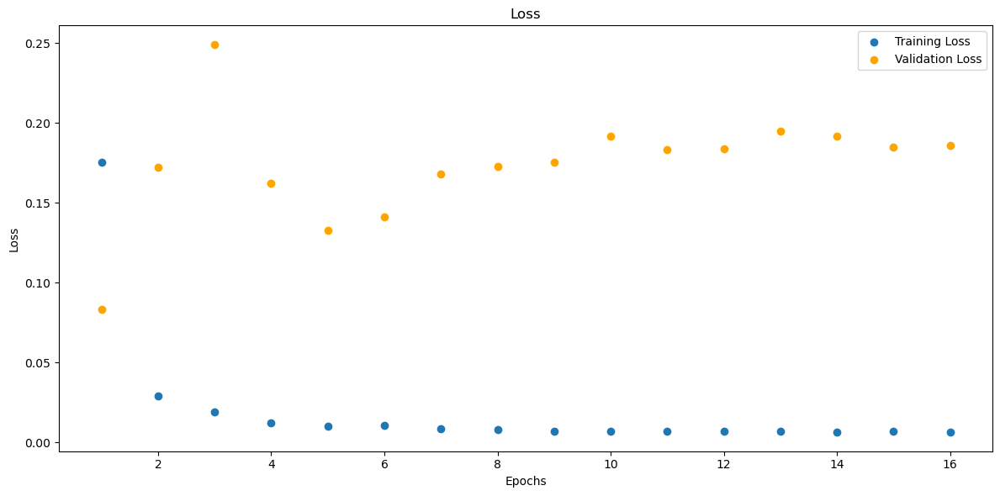

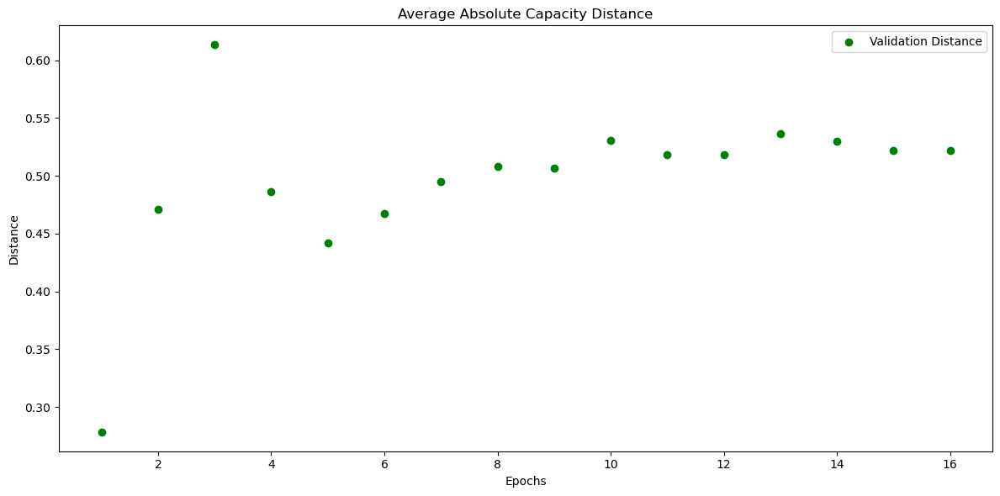

In [198]:
# B0006_charge_rob
model_B0006_charge_rob = LSTM_2(input_shape=input_shape_single)
model_B0006_charge_rob, train_losses_B0006_charge_rob, val_losses_B0006_charge_rob, val_distances_B0006_charge_rob, metrics_history_B0006_charge_rob = train(data_loaders['B0006_charge_rob_val_loader'], data_loaders['B0006_charge_rob_train_loader'], model_B0006_charge_rob)
torch.save(model_B0006_charge_rob, os.path.join(folder_name, 'model_B0006_charge_rob.pth'))

c:\Users\jawaher.alhaj\OneDrive - Technology Innovation Institute\Desktop\Dissertation\Nasa Battery Dataset\Single Battery Model\analysis.py:20: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\b\abs_8f7uhuge1i\croot\pytorch-select_1717607507421\work\aten\src\ATen\native\ReduceOps.cpp:1807.)
  target_std = torch.std(targets)


Test Loss: 0.1630, Test Distance: 0.4362, Test Accuracy: 0.0000, SNR: 3.5336
##Metrics##:
MAE : 0.4270496368408203
MSE : 0.1934833526611328
RMSE : 0.6555976867675781
R-squared : -inf
Count: 21


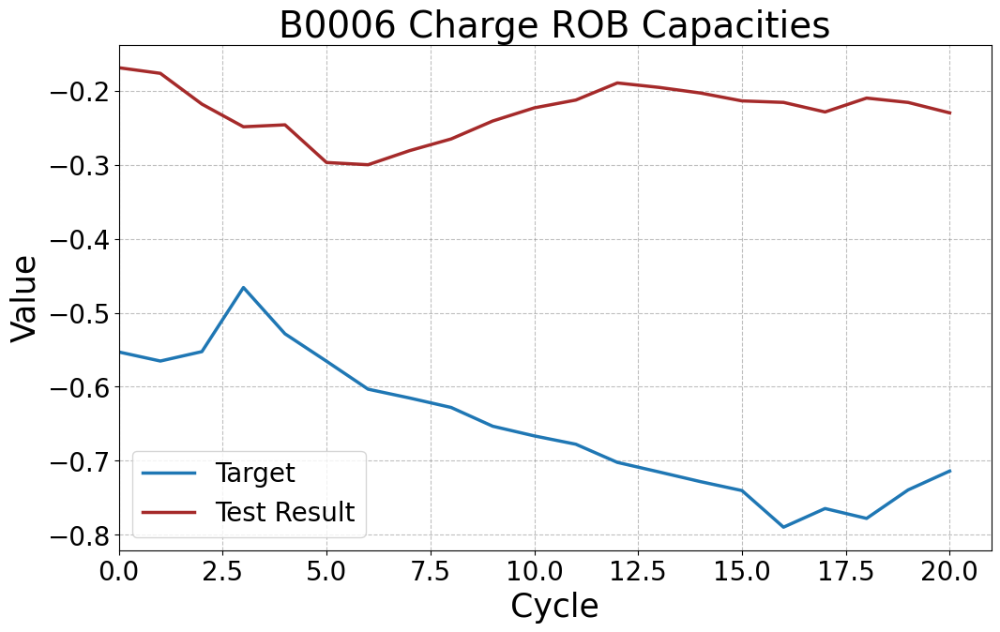

In [199]:
# B0006_charge_rob
model_B0006_charge_rob = torch.load('6. LSTM Models/model_B0006_charge_rob.pth')
y_target_B0006_charge_rob, y_testresult_B0006_charge_rob = test(model_B0006_charge_rob, data_loaders['B0006_charge_rob_test_loader'])
y_target_B0006_charge_rob = flatten_and_concatenate(y_target_B0006_charge_rob)
y_testresult_B0006_charge_rob = flatten_and_concatenate(y_testresult_B0006_charge_rob)
plot_tensors(y_target_B0006_charge_rob, y_testresult_B0006_charge_rob, labels=["Target", "Test Result"], title="B0006 Charge ROB Capacities")


Test on complete dataset.

In [200]:
# Run the test on the model
y_target_B0006_charge_rob, y_testresult_B0006_charge_rob = test(model_B0006_charge_rob, data_loaders['B0006_charge_rob_final_test_loader'])

# Flatten and concatenate the results
y_target_B0006_charge_rob = flatten_and_concatenate(y_target_B0006_charge_rob)
y_testresult_B0006_charge_rob = flatten_and_concatenate(y_testresult_B0006_charge_rob)

# # Assuming scaler_y_charge_B0006 was used for normalization earlier
# # Inverse the normalization process for both target and prediction
# original_y_target_B0006_charge_rob = scaler_y_charge_rob_B0006.inverse_transform(y_target_B0006_charge_rob.numpy().reshape(-1, 1))
# original_y_testresult_B0006_charge_rob = scaler_y_charge_rob_B0006.inverse_transform(y_testresult_B0006_charge_rob.numpy().reshape(-1, 1))

# # Convert the numpy arrays back to tensors
# original_y_target_B0006_charge_rob = torch.tensor(original_y_target_B0006_charge_rob)
# original_y_testresult_B0006_charge_rob = torch.tensor(original_y_testresult_B0006_charge_rob)

# # Plot the inverse transformed results
# plot_tensors(original_y_target_B0006_charge_rob, original_y_testresult_B0006_charge_rob, labels=["Target", "LSTM Result"], title="Capacity Estimation for Battery B0006", file_name="B0006_charge_rob", ylabel="Capacity (Ah)", save_dir="11. LSTM Capacity Plots")


Test Loss: 0.0626, Test Distance: 0.2157, Test Accuracy: 5.3333, SNR: 6.5857
##Metrics##:
MAE : 0.2157481163740158
MSE : 0.07202618569135666
RMSE : 0.47660499811172485
R-squared : -125.41416931152344
Count: 150


SOH Plot.

In [201]:
# plot_soh(original_y_target_B0006_charge_rob, original_y_testresult_B0006_charge_rob, "State of Health Estimation for Battery B0006", file_name="B0006_charge_rob")

Model 13 - B0006 - MinMax Scaler - Discharging Data

c:\Users\jawaher.alhaj\AppData\Local\anaconda3\envs\myenv\lib\site-packages\torch\nn\modules\rnn.py:83: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.5 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "


Epoch 1/120, Training Loss: 0.0707, Validation Loss: 0.0747
Validation Distance: 0.2845, Validation Accuracy: 0.0000, SNR: -6.7406
##Metrics##:
MAE : 0.22501659393310547
MSE : 0.06341571360826492
RMSE : 0.4745717942714691
R-squared : -inf
Count: 26
Epoch 2/120, Training Loss: 0.0129, Validation Loss: 0.0479
Validation Distance: 0.2609, Validation Accuracy: 0.0000, SNR: -4.9482
##Metrics##:
MAE : 0.20576827228069305
MSE : 0.053094543516635895
RMSE : 0.45384272933006287
R-squared : -inf
Count: 26
Epoch 3/120, Training Loss: 0.0056, Validation Loss: 0.0038
Validation Distance: 0.0713, Validation Accuracy: 0.0000, SNR: 3.8289
##Metrics##:
MAE : 0.0519162155687809
MSE : 0.004132154397666454
RMSE : 0.22984622418880463
R-squared : -inf
Count: 26
Epoch 4/120, Training Loss: 0.0026, Validation Loss: 0.0103
Validation Distance: 0.1188, Validation Accuracy: 0.0000, SNR: 0.3828
##Metrics##:
MAE : 0.08996258676052094
MSE : 0.010866230353713036
RMSE : 0.3006574809551239
R-squared : -inf
Count: 26
Ep

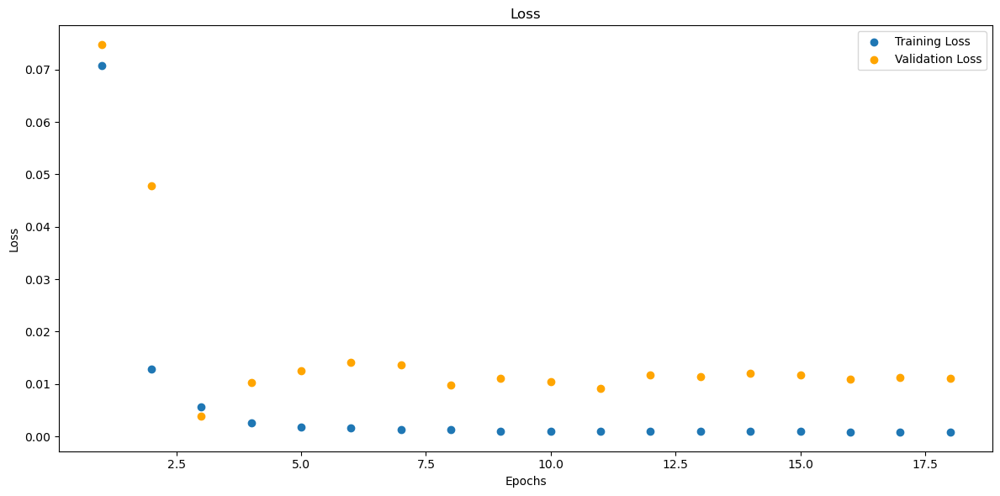

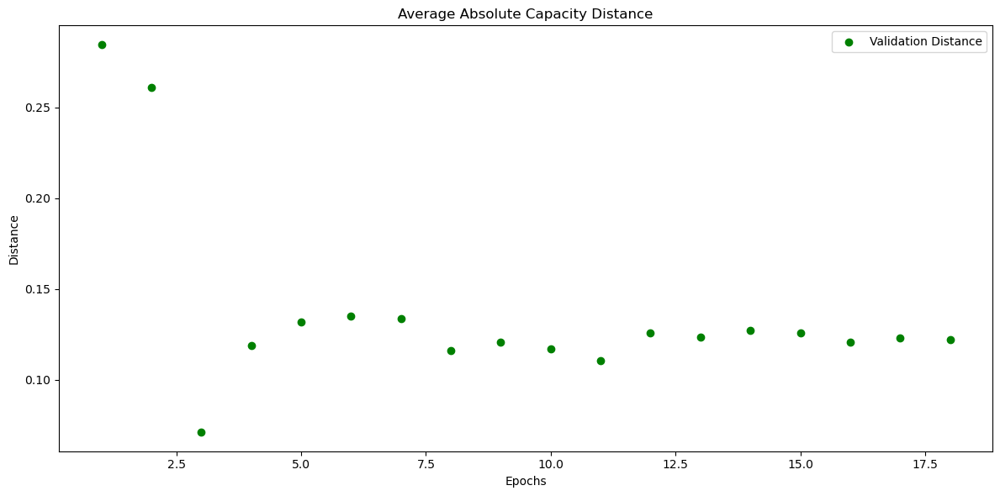

In [202]:
# B0006_discharge_mm
model_B0006_discharge_mm = LSTM_2(input_shape=input_shape_single)
model_B0006_discharge_mm, train_losses_B0006_discharge_mm, val_losses_B0006_discharge_mm, val_distances_B0006_discharge_mm, metrics_history_B0006_discharge_mm = train(data_loaders['B0006_discharge_mm_val_loader'], data_loaders['B0006_discharge_mm_train_loader'], model_B0006_discharge_mm)
torch.save(model_B0006_discharge_mm, os.path.join(folder_name, 'model_B0006_discharge_mm.pth'))

Test Loss: 0.0255, Test Distance: 0.1888, Test Accuracy: 0.0000, SNR: -7.5337
##Metrics##:
MAE : 0.17981010675430298
MSE : 0.03383345156908035
RMSE : 0.4244660437107086
R-squared : -inf
Count: 21


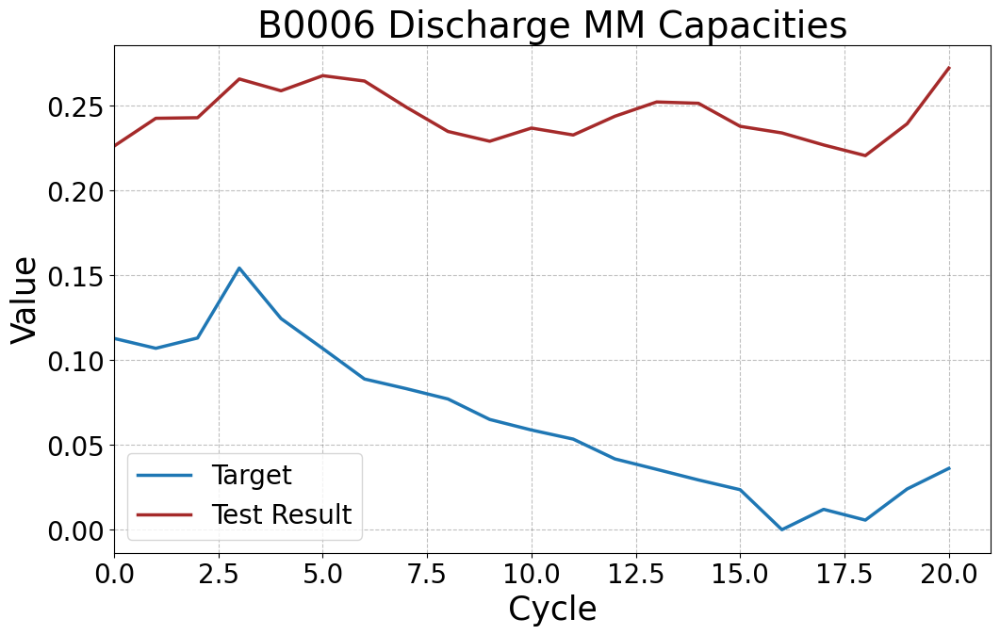

In [203]:
# B0006_discharge_mm
model_B0006_discharge_mm = torch.load('6. LSTM Models/model_B0006_discharge_mm.pth')
y_target_B0006_discharge_mm, y_testresult_B0006_discharge_mm = test(model_B0006_discharge_mm, data_loaders['B0006_discharge_mm_test_loader'])
y_target_B0006_discharge_mm = flatten_and_concatenate(y_target_B0006_discharge_mm)
y_testresult_B0006_discharge_mm = flatten_and_concatenate(y_testresult_B0006_discharge_mm)
plot_tensors(y_target_B0006_discharge_mm, y_testresult_B0006_discharge_mm, labels=["Target", "Test Result"], title="B0006 Discharge MM Capacities")


Test on complete dataset.

Test Loss: 0.0051, Test Distance: 0.0566, Test Accuracy: 12.6667, SNR: 15.9143
##Metrics##:
MAE : 0.05663107708096504
MSE : 0.006508420221507549
RMSE : 0.2438921183347702
R-squared : -46.435020446777344
Count: 150


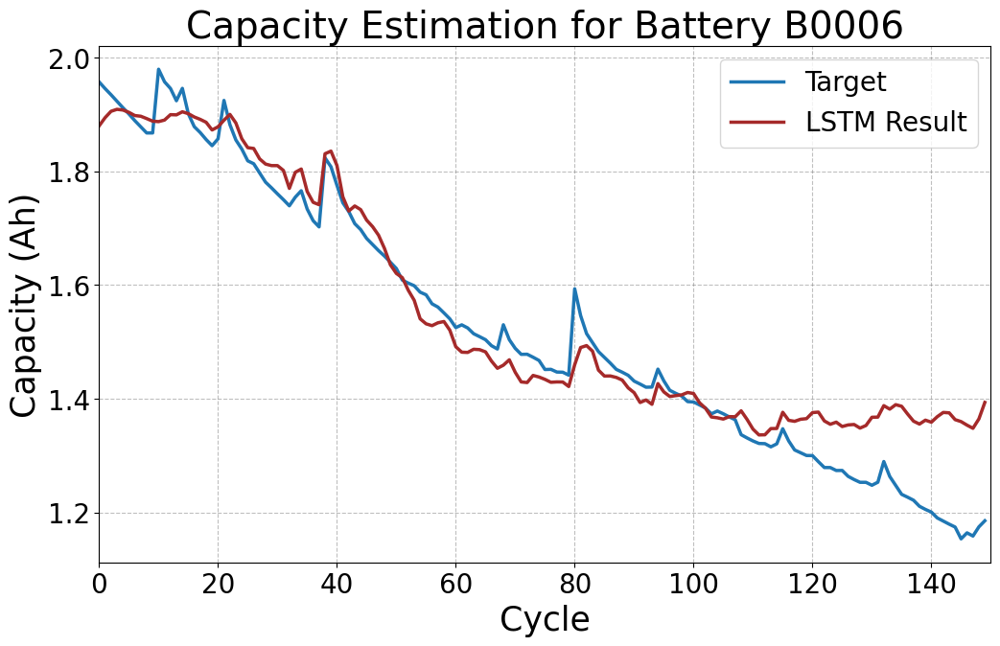

In [204]:
# Run the test on the model
y_target_B0006_discharge_mm, y_testresult_B0006_discharge_mm = test(model_B0006_discharge_mm, data_loaders['B0006_discharge_mm_final_test_loader'])

# Flatten and concatenate the results
y_target_B0006_discharge_mm = flatten_and_concatenate(y_target_B0006_discharge_mm)
y_testresult_B0006_discharge_mm = flatten_and_concatenate(y_testresult_B0006_discharge_mm)

# Assuming scaler_y_discharge_B0006 was used for normalization earlier
# Inverse the normalization process for both target and prediction
original_y_target_B0006_discharge_mm = scaler_y_dis_mm_B0006.inverse_transform(y_target_B0006_discharge_mm.numpy().reshape(-1, 1))
original_y_testresult_B0006_discharge_mm = scaler_y_dis_mm_B0006.inverse_transform(y_testresult_B0006_discharge_mm.numpy().reshape(-1, 1))

# Convert the numpy arrays back to tensors
original_y_target_B0006_discharge_mm = torch.tensor(original_y_target_B0006_discharge_mm)
original_y_testresult_B0006_discharge_mm = torch.tensor(original_y_testresult_B0006_discharge_mm)

# Plot the inverse transformed results
plot_tensors(original_y_target_B0006_discharge_mm, original_y_testresult_B0006_discharge_mm, labels=["Target", "LSTM Result"], title="Capacity Estimation for Battery B0006", file_name="B0006_discharge_mm", ylabel="Capacity (Ah)", save_dir="11. LSTM Capacity Plots")


SOH Plot.

C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_23676\540638711.py:20: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_target_tensor = torch.tensor(soh_target)
C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_23676\540638711.py:21: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_predicted_tensor = torch.tensor(soh_predicted)


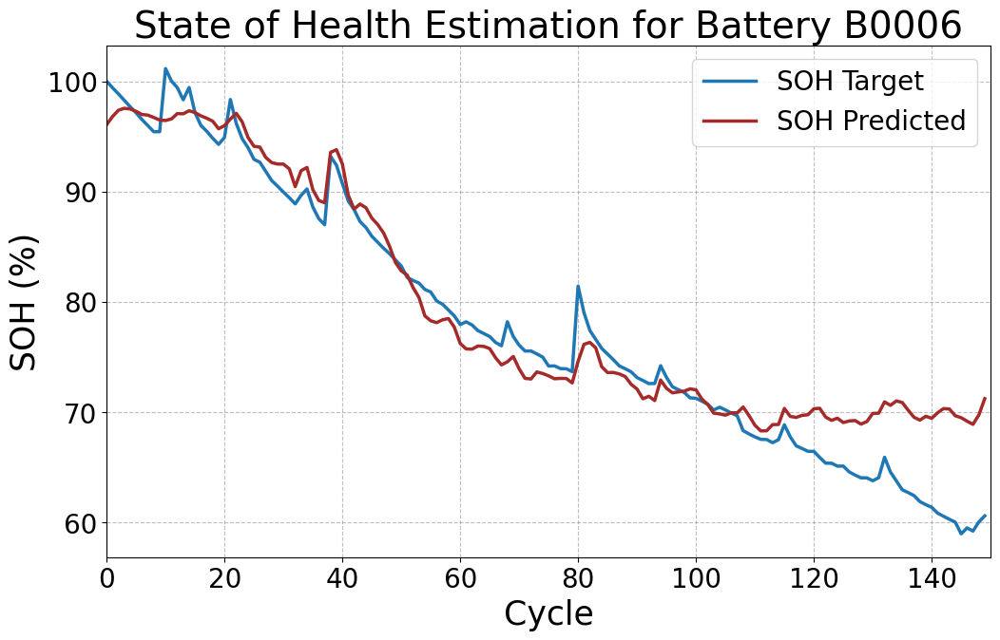

In [205]:
plot_soh(original_y_target_B0006_discharge_mm, original_y_testresult_B0006_discharge_mm, "State of Health Estimation for Battery B0006", file_name="B0006_discharge_mm")

Model 14 - B0006 - Standard Scaler - Discharging Data

c:\Users\jawaher.alhaj\AppData\Local\anaconda3\envs\myenv\lib\site-packages\torch\nn\modules\rnn.py:83: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.5 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
c:\Users\jawaher.alhaj\OneDrive - Technology Innovation Institute\Desktop\Dissertation\Nasa Battery Dataset\Single Battery Model\analysis.py:20: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\b\abs_8f7uhuge1i\croot\pytorch-select_1717607507421\work\aten\src\ATen\native\ReduceOps.cpp:1807.)
  target_std = torch.std(targets)


Epoch 1/120, Training Loss: 0.2241, Validation Loss: 0.4213
Validation Distance: 0.8000, Validation Accuracy: 0.0000, SNR: 1.3050
##Metrics##:
MAE : 0.5764710903167725
MSE : 0.4645048975944519
RMSE : 0.7606956958770752
R-squared : -inf
Count: 26
Epoch 2/120, Training Loss: 0.0242, Validation Loss: 0.4358
Validation Distance: 0.7742, Validation Accuracy: 0.0000, SNR: 1.2432
##Metrics##:
MAE : 0.5554987192153931
MSE : 0.4341367483139038
RMSE : 0.7468956708908081
R-squared : -inf
Count: 26
Epoch 3/120, Training Loss: 0.0196, Validation Loss: 0.1690
Validation Distance: 0.4397, Validation Accuracy: 0.0000, SNR: 4.7789
##Metrics##:
MAE : 0.2947925925254822
MSE : 0.14312534034252167
RMSE : 0.5466623306274414
R-squared : -inf
Count: 26
Epoch 4/120, Training Loss: 0.0168, Validation Loss: 0.2704
Validation Distance: 0.5698, Validation Accuracy: 0.0000, SNR: 3.4536
##Metrics##:
MAE : 0.4066324532032013
MSE : 0.23242594301700592
RMSE : 0.6393358111381531
R-squared : -inf
Count: 26
Epoch 5/120, T

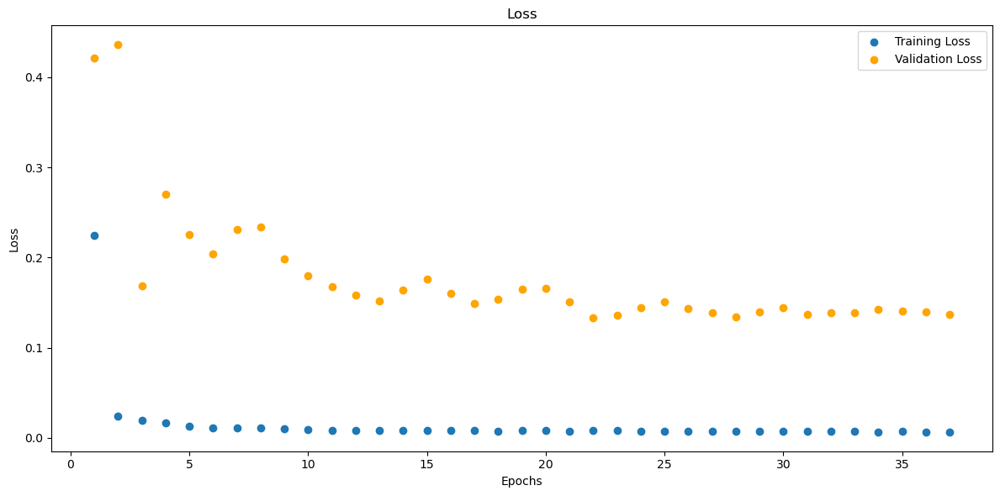

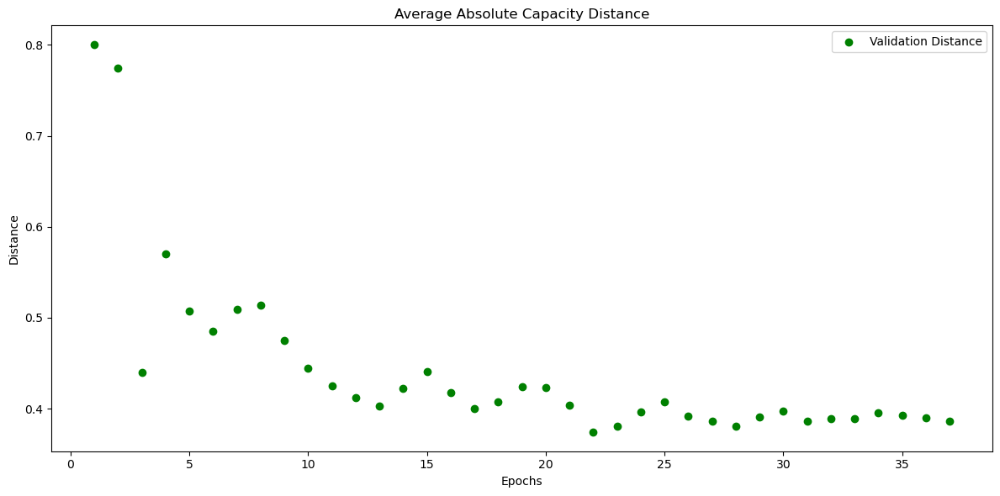

In [206]:
# B0006_discharge_std
model_B0006_discharge_std = LSTM_2(input_shape=input_shape_single)
model_B0006_discharge_std, train_losses_B0006_discharge_std, val_losses_B0006_discharge_std, val_distances_B0006_discharge_std, metrics_history_B0006_discharge_std = train(data_loaders['B0006_discharge_std_val_loader'], data_loaders['B0006_discharge_std_train_loader'], model_B0006_discharge_std)
torch.save(model_B0006_discharge_std, os.path.join(folder_name, 'model_B0006_discharge_std.pth'))

Test Loss: 0.4640, Test Distance: 0.5940, Test Accuracy: 0.0000, SNR: 6.8744
##Metrics##:
MAE : 0.600536048412323
MSE : 0.3723791837692261
RMSE : 0.7765633463859558
R-squared : -inf
Count: 21


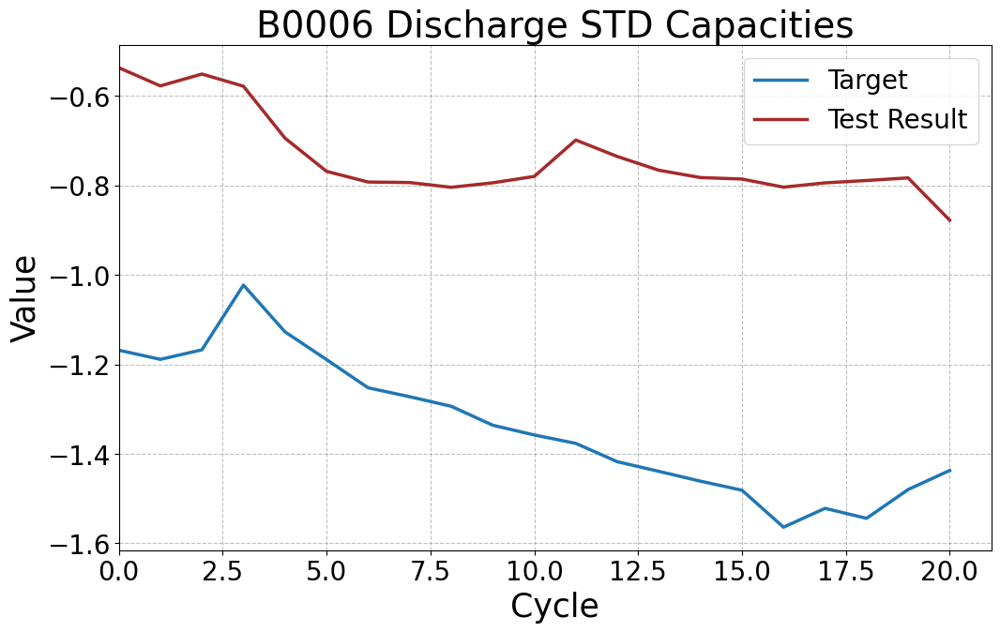

In [207]:
# B0006_discharge_std
model_B0006_discharge_std = torch.load('6. LSTM Models/model_B0006_discharge_std.pth')
y_target_B0006_discharge_std, y_testresult_B0006_discharge_std = test(model_B0006_discharge_std, data_loaders['B0006_discharge_std_test_loader'])
y_target_B0006_discharge_std = flatten_and_concatenate(y_target_B0006_discharge_std)
y_testresult_B0006_discharge_std = flatten_and_concatenate(y_testresult_B0006_discharge_std)
plot_tensors(y_target_B0006_discharge_std, y_testresult_B0006_discharge_std, labels=["Target", "Test Result"], title="B0006 Discharge STD Capacities")


Test on complete dataset.

Test Loss: 0.0813, Test Distance: 0.1638, Test Accuracy: 12.0000, SNR: 10.8602
##Metrics##:
MAE : 0.16378812491893768
MSE : 0.07288456708192825
RMSE : 0.4153316617012024
R-squared : -52.919776916503906
Count: 150


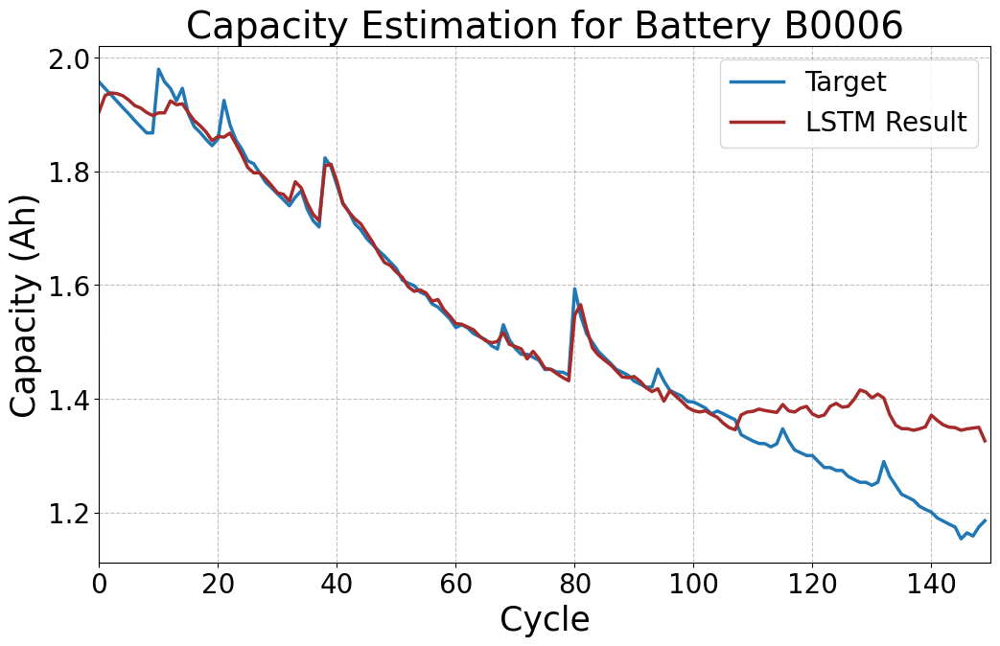

In [208]:
# Run the test on the model
y_target_B0006_discharge_std, y_testresult_B0006_discharge_std = test(model_B0006_discharge_std, data_loaders['B0006_discharge_std_final_test_loader'])

# Flatten and concatenate the results
y_target_B0006_discharge_std = flatten_and_concatenate(y_target_B0006_discharge_std)
y_testresult_B0006_discharge_std = flatten_and_concatenate(y_testresult_B0006_discharge_std)

# Assuming scaler_y_discharge_B0006 was used for normalization earlier
# Inverse the normalization process for both target and prediction
original_y_target_B0006_discharge_std = scaler_y_dis_std_B0006.inverse_transform(y_target_B0006_discharge_std.numpy().reshape(-1, 1))
original_y_testresult_B0006_discharge_std = scaler_y_dis_std_B0006.inverse_transform(y_testresult_B0006_discharge_std.numpy().reshape(-1, 1))

# Convert the numpy arrays back to tensors
original_y_target_B0006_discharge_std = torch.tensor(original_y_target_B0006_discharge_std)
original_y_testresult_B0006_discharge_std = torch.tensor(original_y_testresult_B0006_discharge_std)

# Plot the inverse transformed results
plot_tensors(original_y_target_B0006_discharge_std, original_y_testresult_B0006_discharge_std, labels=["Target", "LSTM Result"], title="Capacity Estimation for Battery B0006", file_name="B0006_discharge_std", ylabel="Capacity (Ah)", save_dir="11. LSTM Capacity Plots")


SOH Plot.

C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_23676\540638711.py:20: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_target_tensor = torch.tensor(soh_target)
C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_23676\540638711.py:21: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_predicted_tensor = torch.tensor(soh_predicted)


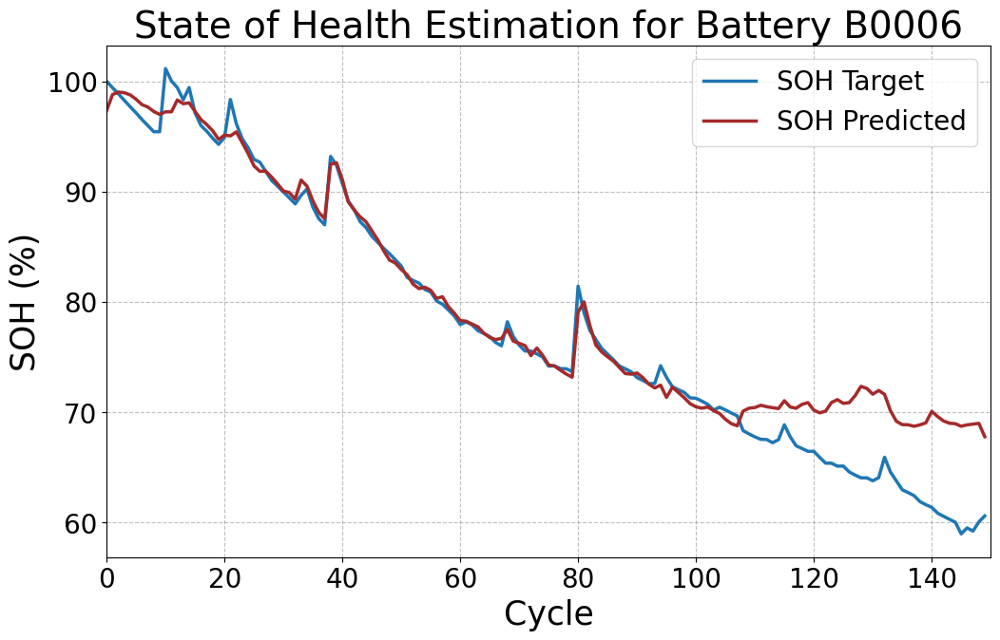

In [209]:
plot_soh(original_y_target_B0006_discharge_std, original_y_testresult_B0006_discharge_std, "State of Health Estimation for Battery B0006", file_name="B0006_discharge_std")

Model 15 - B0006 - Robust Scaler - Discharging Data

c:\Users\jawaher.alhaj\AppData\Local\anaconda3\envs\myenv\lib\site-packages\torch\nn\modules\rnn.py:83: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.5 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
c:\Users\jawaher.alhaj\OneDrive - Technology Innovation Institute\Desktop\Dissertation\Nasa Battery Dataset\Single Battery Model\analysis.py:20: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\b\abs_8f7uhuge1i\croot\pytorch-select_1717607507421\work\aten\src\ATen\native\ReduceOps.cpp:1807.)
  target_std = torch.std(targets)


Epoch 1/120, Training Loss: 0.1862, Validation Loss: 0.1013
Validation Distance: 0.2812, Validation Accuracy: 0.0000, SNR: 3.6252
##Metrics##:
MAE : 0.22791799902915955
MSE : 0.06501872837543488
RMSE : 0.4785151183605194
R-squared : -inf
Count: 26
Epoch 2/120, Training Loss: 0.0224, Validation Loss: 0.1489
Validation Distance: 0.4374, Validation Accuracy: 0.0000, SNR: -0.1111
##Metrics##:
MAE : 0.3319186568260193
MSE : 0.14634129405021667
RMSE : 0.5774116516113281
R-squared : -inf
Count: 26
Epoch 3/120, Training Loss: 0.0093, Validation Loss: 0.1078
Validation Distance: 0.3934, Validation Accuracy: 0.0000, SNR: 0.3757
##Metrics##:
MAE : 0.28769195079803467
MSE : 0.11887709051370621
RMSE : 0.53827965259552
R-squared : -inf
Count: 26
Epoch 4/120, Training Loss: 0.0064, Validation Loss: 0.1096
Validation Distance: 0.3904, Validation Accuracy: 0.0000, SNR: 0.4682
##Metrics##:
MAE : 0.2876957654953003
MSE : 0.11690449714660645
RMSE : 0.538083016872406
R-squared : -inf
Count: 26
Epoch 5/120,

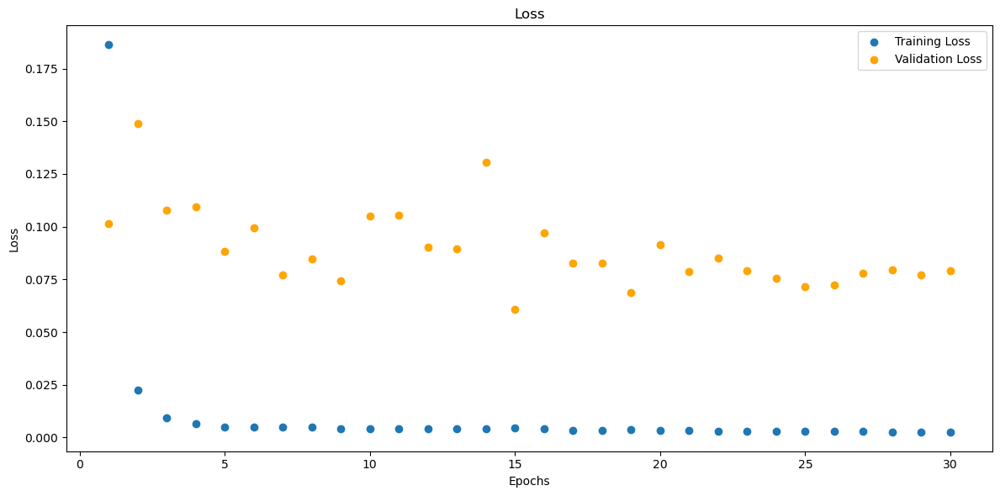

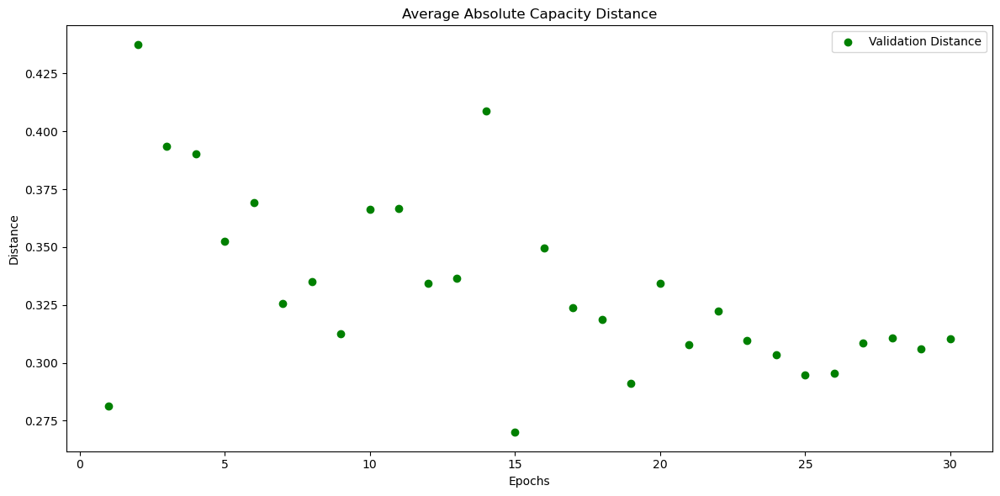

In [210]:
# B0006_discharge_rob
model_B0006_discharge_rob = LSTM_2(input_shape=input_shape_single)
model_B0006_discharge_rob, train_losses_B0006_discharge_rob, val_losses_B0006_discharge_rob, val_distances_B0006_discharge_rob, metrics_history_B0006_discharge_rob = train(data_loaders['B0006_discharge_rob_val_loader'], data_loaders['B0006_discharge_rob_train_loader'], model_B0006_discharge_rob)
torch.save(model_B0006_discharge_rob, os.path.join(folder_name, 'model_B0006_discharge_rob.pth'))

Test Loss: 0.3482, Test Distance: 0.6347, Test Accuracy: 0.0000, SNR: 0.4032
##Metrics##:
MAE : 0.6236615777015686
MSE : 0.3978149890899658
RMSE : 0.7901059985160828
R-squared : -inf
Count: 21


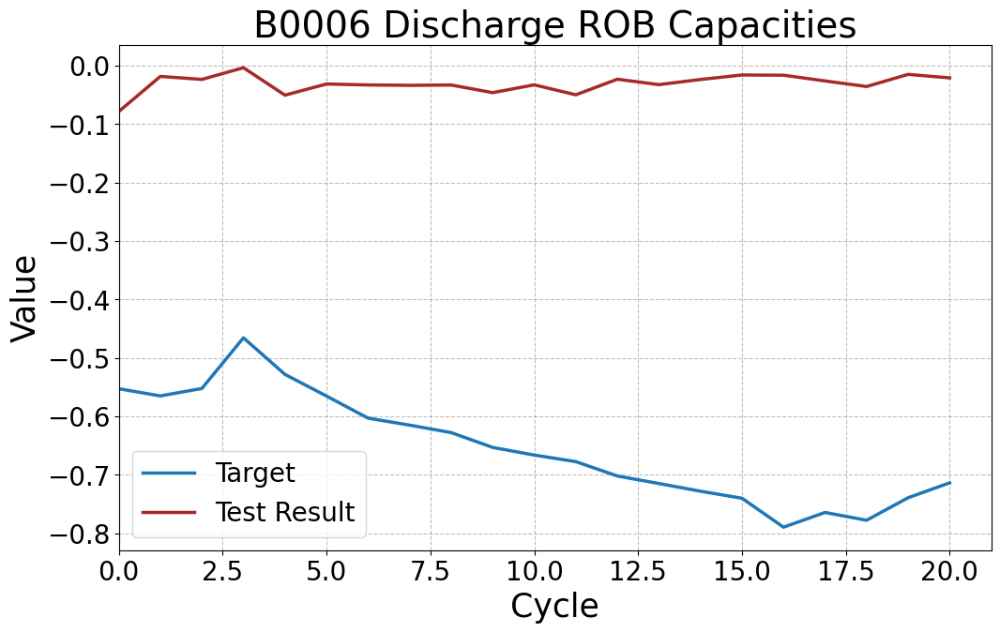

In [211]:
# B0006_discharge_rob
model_B0006_discharge_rob = torch.load('6. LSTM Models/model_B0006_discharge_rob.pth')
y_target_B0006_discharge_rob, y_testresult_B0006_discharge_rob = test(model_B0006_discharge_rob, data_loaders['B0006_discharge_rob_test_loader'])
y_target_B0006_discharge_rob = flatten_and_concatenate(y_target_B0006_discharge_rob)
y_testresult_B0006_discharge_rob = flatten_and_concatenate(y_testresult_B0006_discharge_rob)
plot_tensors(y_target_B0006_discharge_rob, y_testresult_B0006_discharge_rob, labels=["Target", "Test Result"], title="B0006 Discharge ROB Capacities")


Test on complete dataset.

In [212]:
# Run the test on the model
y_target_B0006_discharge_rob, y_testresult_B0006_discharge_rob = test(model_B0006_discharge_rob, data_loaders['B0006_discharge_rob_final_test_loader'])

# Flatten and concatenate the results
y_target_B0006_discharge_rob = flatten_and_concatenate(y_target_B0006_discharge_rob)
y_testresult_B0006_discharge_rob = flatten_and_concatenate(y_testresult_B0006_discharge_rob)

# # Assuming scaler_y_discharge_B0006 was used for normalization earlier
# # Inverse the normalization process for both target and prediction
# original_y_target_B0006_discharge_rob = scaler_y_dis_rob_B0006.inverse_transform(y_target_B0006_discharge_rob.numpy().reshape(-1, 1))
# original_y_testresult_B0006_discharge_rob = scaler_y_dis_rob_B0006.inverse_transform(y_testresult_B0006_discharge_rob.numpy().reshape(-1, 1))

# # Convert the numpy arrays back to tensors
# original_y_target_B0006_discharge_rob = torch.tensor(original_y_target_B0006_discharge_rob)
# original_y_testresult_B0006_discharge_rob = torch.tensor(original_y_testresult_B0006_discharge_rob)

# # Plot the inverse transformed results
# plot_tensors(original_y_target_B0006_discharge_rob, original_y_testresult_B0006_discharge_rob, labels=["Target", "LSTM Result"], title="Capacity Estimation for Battery B0006", file_name="B0006_discharge_rob", ylabel="Capacity (Ah)", save_dir="11. LSTM Capacity Plots")


Test Loss: 0.0537, Test Distance: 0.1491, Test Accuracy: 11.3333, SNR: 6.8315
##Metrics##:
MAE : 0.1490512490272522
MSE : 0.0680636465549469
RMSE : 0.3926984369754791
R-squared : -121.09026336669922
Count: 150


SOH Plot.

In [213]:
# plot_soh(original_y_target_B0006_discharge_rob, original_y_testresult_B0006_discharge_rob, "State of Health Estimation for Battery B0006", file_name="B0006_discharge_rob")

Model 16 - B0006 - MinMax Scaler - Combined Data

c:\Users\jawaher.alhaj\AppData\Local\anaconda3\envs\myenv\lib\site-packages\torch\nn\modules\rnn.py:83: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.5 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
c:\Users\jawaher.alhaj\OneDrive - Technology Innovation Institute\Desktop\Dissertation\Nasa Battery Dataset\Single Battery Model\analysis.py:20: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\b\abs_8f7uhuge1i\croot\pytorch-select_1717607507421\work\aten\src\ATen\native\ReduceOps.cpp:1807.)
  target_std = torch.std(targets)


Epoch 1/120, Training Loss: 0.1610, Validation Loss: 0.0190
Validation Distance: 0.1135, Validation Accuracy: 0.0000, SNR: 1.2589
##Metrics##:
MAE : 0.09475275129079819
MSE : 0.01144193485379219
RMSE : 0.3086662292480469
R-squared : -inf
Count: 26
Epoch 2/120, Training Loss: 0.0106, Validation Loss: 0.0071
Validation Distance: 0.1191, Validation Accuracy: 0.0000, SNR: 2.9941
##Metrics##:
MAE : 0.09289203584194183
MSE : 0.011003122664988041
RMSE : 0.3056090772151947
R-squared : -inf
Count: 26
Epoch 3/120, Training Loss: 0.0030, Validation Loss: 0.0127
Validation Distance: 0.1494, Validation Accuracy: 0.0000, SNR: 0.7387
##Metrics##:
MAE : 0.1174021065235138
MSE : 0.017360465601086617
RMSE : 0.34311985969543457
R-squared : -inf
Count: 26
Epoch 4/120, Training Loss: 0.0017, Validation Loss: 0.0039
Validation Distance: 0.0878, Validation Accuracy: 0.0000, SNR: 5.1864
##Metrics##:
MAE : 0.06781674921512604
MSE : 0.005959862843155861
RMSE : 0.261432945728302
R-squared : -inf
Count: 26
Epoch 

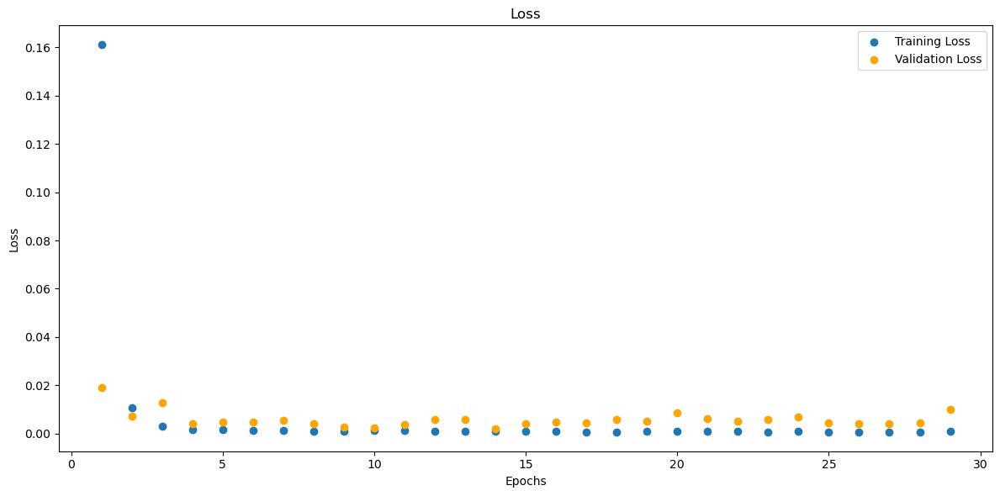

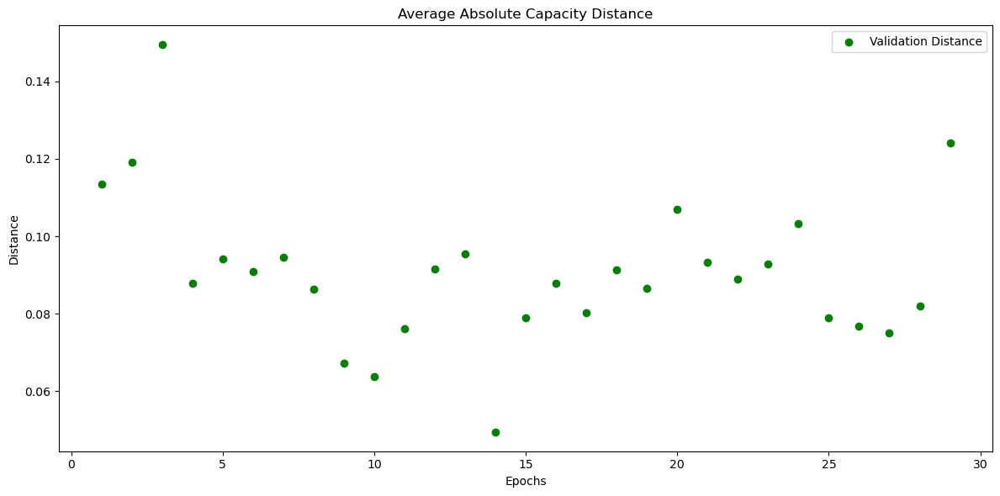

In [368]:
# B0006_combined_mm
model_B0006_combined_mm = LSTM_2(input_shape=input_shape_combined)
model_B0006_combined_mm, train_losses_B0006_combined_mm, val_losses_B0006_combined_mm, val_distances_B0006_combined_mm, metrics_history_B0006_combined_mm = train(data_loaders['B0006_combined_mm_val_loader'], data_loaders['B0006_combined_mm_train_loader'], model_B0006_combined_mm)
torch.save(model_B0006_combined_mm, os.path.join(folder_name, 'model_B0006_combined_mm.pth'))

Test Loss: 0.0104, Test Distance: 0.1157, Test Accuracy: 0.0000, SNR: -3.5009
##Metrics##:
MAE : 0.11251610517501831
MSE : 0.01336802076548338
RMSE : 0.335934042930603
R-squared : -inf
Count: 21


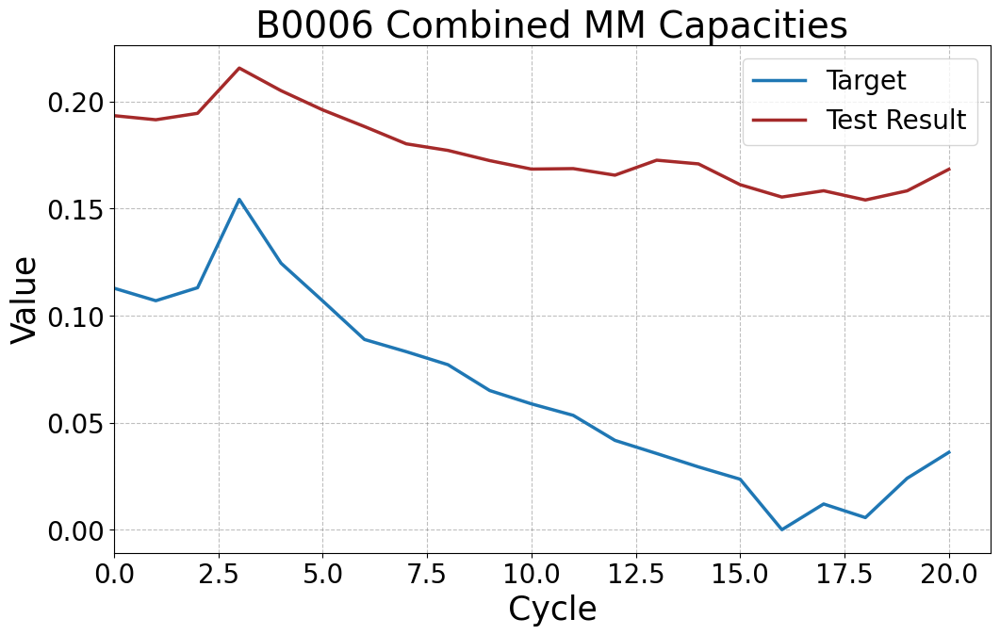

In [369]:
# B0006_combined_mm
model_B0006_combined_mm = torch.load('6. LSTM Models/model_B0006_combined_mm.pth')
y_target_B0006_combined_mm, y_testresult_B0006_combined_mm = test(model_B0006_combined_mm, data_loaders['B0006_combined_mm_test_loader'])
y_target_B0006_combined_mm = flatten_and_concatenate(y_target_B0006_combined_mm)
y_testresult_B0006_combined_mm = flatten_and_concatenate(y_testresult_B0006_combined_mm)
plot_tensors(y_target_B0006_combined_mm, y_testresult_B0006_combined_mm, labels=["Target", "Test Result"], title="B0006 Combined MM Capacities")


Test on complete dataset.

Test Loss: 0.0024, Test Distance: 0.0423, Test Accuracy: 14.6667, SNR: 19.1994
##Metrics##:
MAE : 0.042273279279470444
MSE : 0.0030546721536666155
RMSE : 0.21059048175811768
R-squared : -21.41631317138672
Count: 150


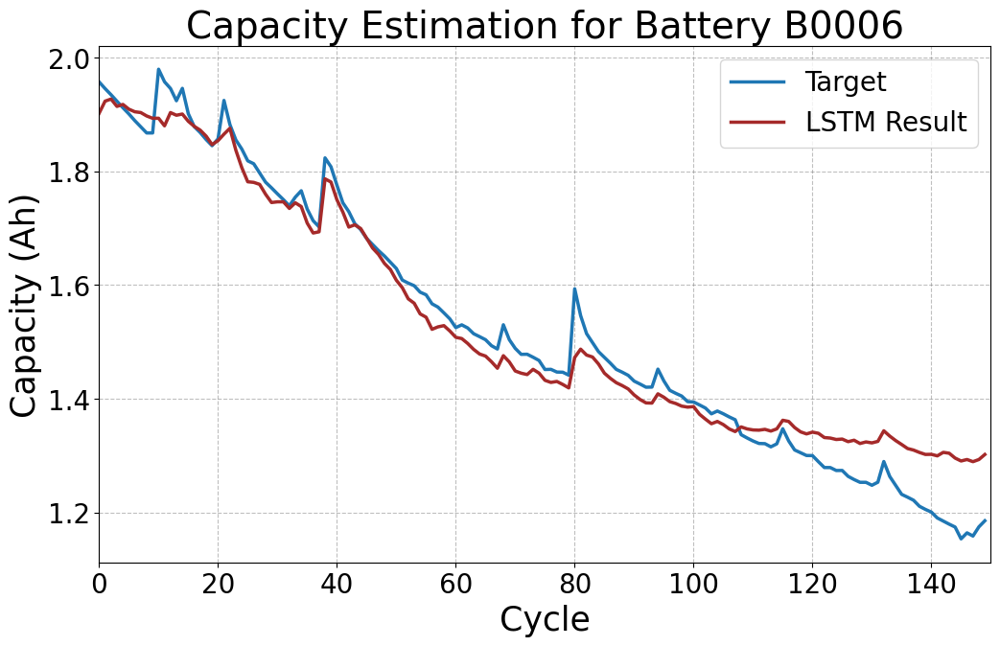

In [370]:
# Run the test on the model
y_target_B0006_combined_mm, y_testresult_B0006_combined_mm = test(model_B0006_combined_mm, data_loaders['B0006_combined_mm_final_test_loader'])

# Flatten and concatenate the results
y_target_B0006_combined_mm = flatten_and_concatenate(y_target_B0006_combined_mm)
y_testresult_B0006_combined_mm = flatten_and_concatenate(y_testresult_B0006_combined_mm)

# Assuming scaler_y_combined_B0006 was used for normalization earlier
# Inverse the normalization process for both target and prediction
original_y_target_B0006_combined_mm = scaler_y_comb_mm_B0006.inverse_transform(y_target_B0006_combined_mm.numpy().reshape(-1, 1))
original_y_testresult_B0006_combined_mm = scaler_y_comb_mm_B0006.inverse_transform(y_testresult_B0006_combined_mm.numpy().reshape(-1, 1))

# Convert the numpy arrays back to tensors
original_y_target_B0006_combined_mm = torch.tensor(original_y_target_B0006_combined_mm)
original_y_testresult_B0006_combined_mm = torch.tensor(original_y_testresult_B0006_combined_mm)

# Plot the inverse transformed results
plot_tensors(original_y_target_B0006_combined_mm, original_y_testresult_B0006_combined_mm, labels=["Target", "LSTM Result"], title="Capacity Estimation for Battery B0006", file_name="B0006_combined_mm", ylabel="Capacity (Ah)", save_dir="11. LSTM Capacity Plots")


SOH Plot.

C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_23676\540638711.py:20: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_target_tensor = torch.tensor(soh_target)
C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_23676\540638711.py:21: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_predicted_tensor = torch.tensor(soh_predicted)


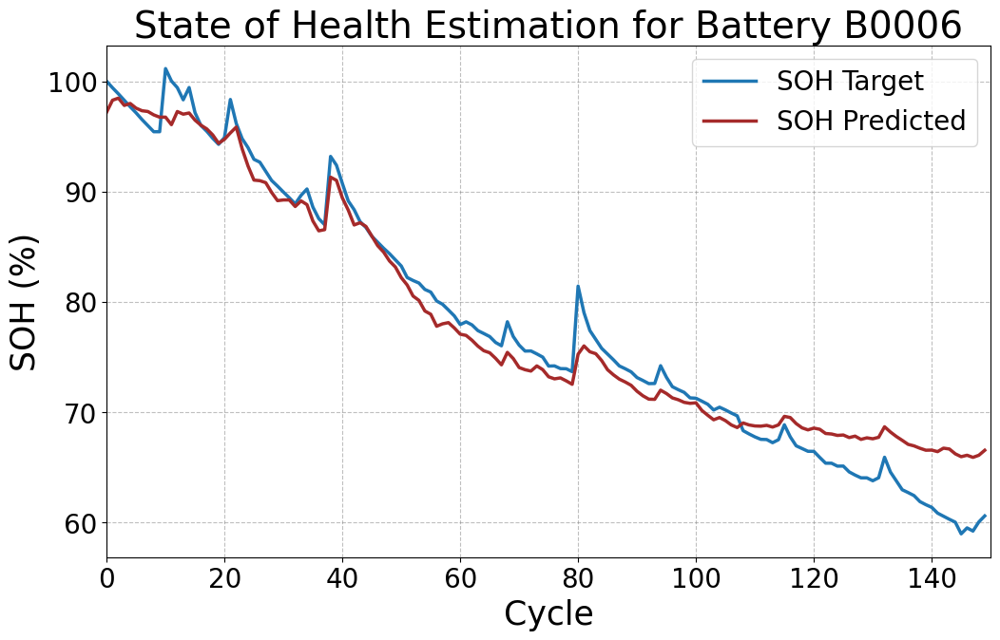

In [371]:
plot_soh(original_y_target_B0006_combined_mm, original_y_testresult_B0006_combined_mm, "State of Health Estimation for Battery B0006", file_name="B0006_combined_mm")

Model 17 - B0006 - Standard Scaler - Combined Data

c:\Users\jawaher.alhaj\AppData\Local\anaconda3\envs\myenv\lib\site-packages\torch\nn\modules\rnn.py:83: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.5 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
c:\Users\jawaher.alhaj\OneDrive - Technology Innovation Institute\Desktop\Dissertation\Nasa Battery Dataset\Single Battery Model\analysis.py:20: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\b\abs_8f7uhuge1i\croot\pytorch-select_1717607507421\work\aten\src\ATen\native\ReduceOps.cpp:1807.)
  target_std = torch.std(targets)


Epoch 1/120, Training Loss: 0.1984, Validation Loss: 0.4786
Validation Distance: 0.8107, Validation Accuracy: 0.0000, SNR: 1.4899
##Metrics##:
MAE : 0.6068093180656433
MSE : 0.4797908663749695
RMSE : 0.7797443270683289
R-squared : -inf
Count: 26
Epoch 2/120, Training Loss: 0.0223, Validation Loss: 0.2790
Validation Distance: 0.6122, Validation Accuracy: 0.0000, SNR: 3.7794
##Metrics##:
MAE : 0.45563608407974243
MSE : 0.27363553643226624
RMSE : 0.6759768128395081
R-squared : -inf
Count: 26
Epoch 3/120, Training Loss: 0.0172, Validation Loss: 0.1959
Validation Distance: 0.4790, Validation Accuracy: 0.0000, SNR: 5.0366
##Metrics##:
MAE : 0.34941565990448
MSE : 0.16565878689289093
RMSE : 0.5922363996505737
R-squared : -inf
Count: 26
Epoch 4/120, Training Loss: 0.0140, Validation Loss: 0.1807
Validation Distance: 0.4605, Validation Accuracy: 0.0000, SNR: 5.3557
##Metrics##:
MAE : 0.3366399109363556
MSE : 0.1535172313451767
RMSE : 0.5813548564910889
R-squared : -inf
Count: 26
Epoch 5/120, Tr

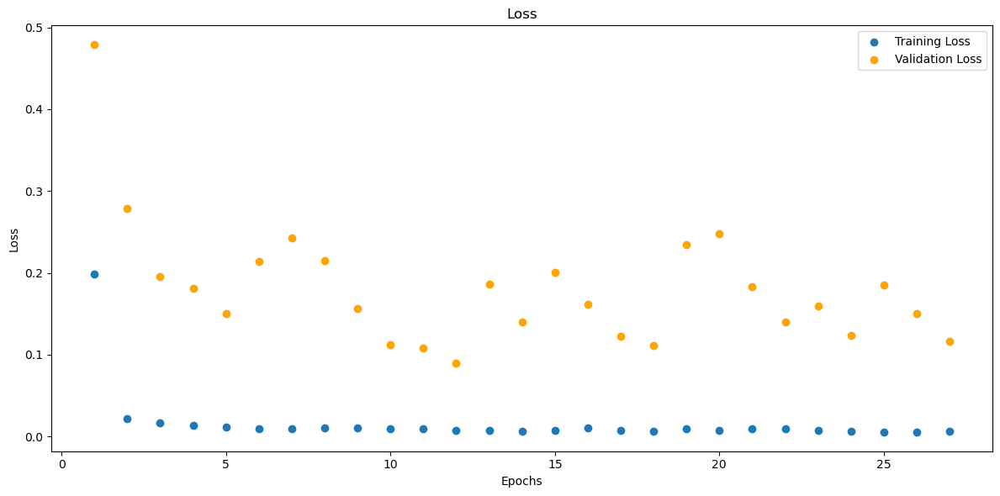

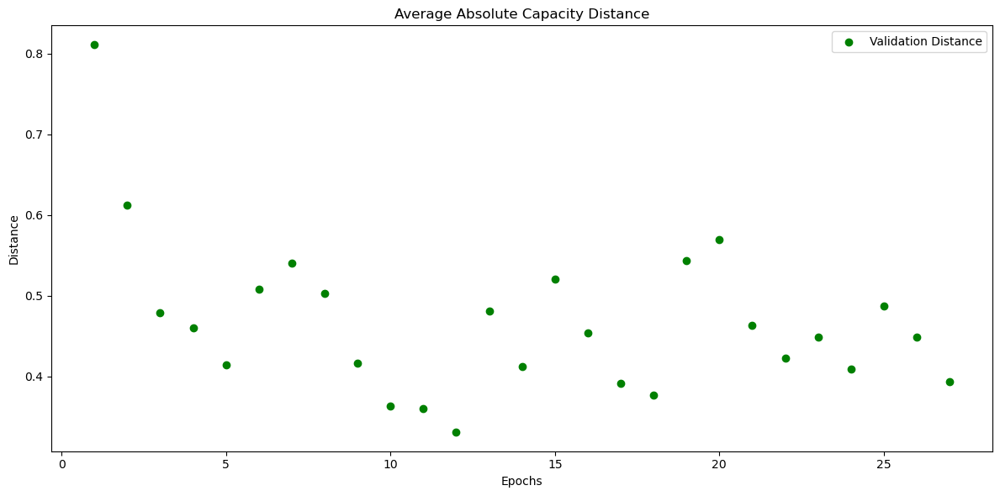

In [372]:
# B0006_combined_std
model_B0006_combined_std = LSTM_2(input_shape=input_shape_combined)
model_B0006_combined_std, train_losses_B0006_combined_std, val_losses_B0006_combined_std, val_distances_B0006_combined_std, metrics_history_B0006_combined_std = train(data_loaders['B0006_combined_std_val_loader'], data_loaders['B0006_combined_std_train_loader'], model_B0006_combined_std)
torch.save(model_B0006_combined_std, os.path.join(folder_name, 'model_B0006_combined_std.pth'))

Test Loss: 0.5044, Test Distance: 0.6919, Test Accuracy: 0.0000, SNR: 5.7208
##Metrics##:
MAE : 0.6804707050323486
MSE : 0.4856705963611603
RMSE : 0.8261902332305908
R-squared : -inf
Count: 21


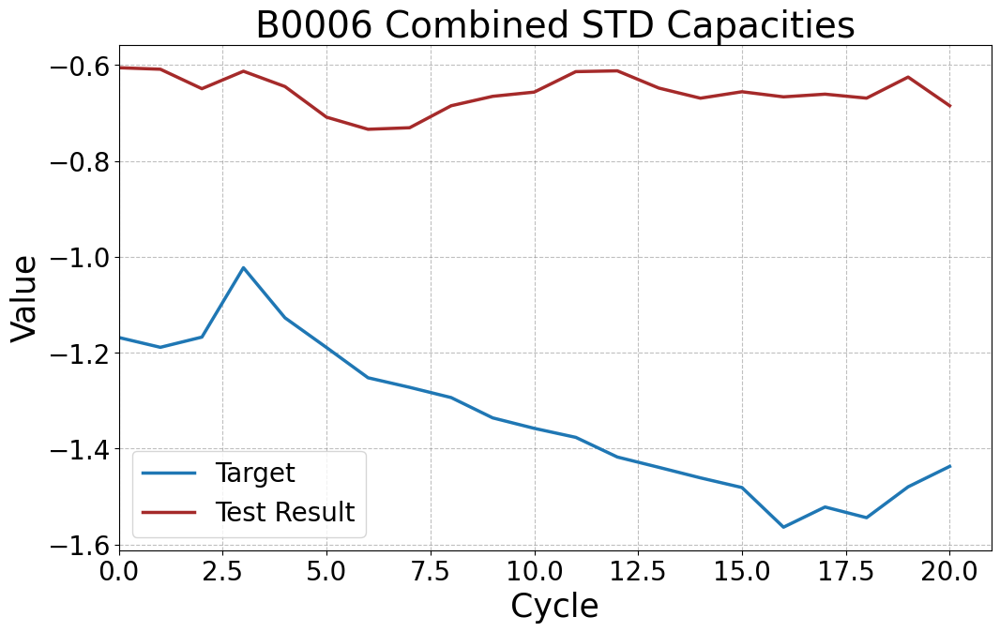

In [373]:
# B0006_combined_std
model_B0006_combined_std = torch.load('6. LSTM Models/model_B0006_combined_std.pth')
y_target_B0006_combined_std, y_testresult_B0006_combined_std = test(model_B0006_combined_std, data_loaders['B0006_combined_std_test_loader'])
y_target_B0006_combined_std = flatten_and_concatenate(y_target_B0006_combined_std)
y_testresult_B0006_combined_std = flatten_and_concatenate(y_testresult_B0006_combined_std)
plot_tensors(y_target_B0006_combined_std, y_testresult_B0006_combined_std, labels=["Target", "Test Result"], title="B0006 Combined STD Capacities")


Test on complete dataset.

Test Loss: 0.0811, Test Distance: 0.1884, Test Accuracy: 13.3333, SNR: 10.0292
##Metrics##:
MAE : 0.18839241564273834
MSE : 0.0882539302110672
RMSE : 0.4425959289073944
R-squared : -60.716739654541016
Count: 150


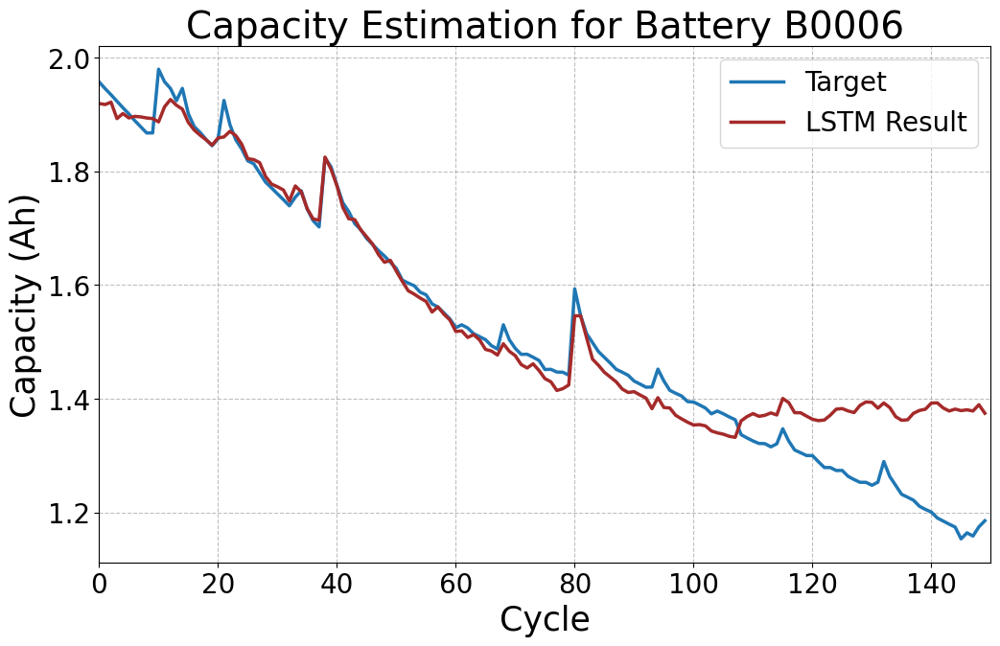

In [374]:
# Run the test on the model
y_target_B0006_combined_std, y_testresult_B0006_combined_std = test(model_B0006_combined_std, data_loaders['B0006_combined_std_final_test_loader'])

# Flatten and concatenate the results
y_target_B0006_combined_std = flatten_and_concatenate(y_target_B0006_combined_std)
y_testresult_B0006_combined_std = flatten_and_concatenate(y_testresult_B0006_combined_std)

# Assuming scaler_y_combined_B0006 was used for normalization earlier
# Inverse the normalization process for both target and prediction
original_y_target_B0006_combined_std = scaler_y_comb_std_B0006.inverse_transform(y_target_B0006_combined_std.numpy().reshape(-1, 1))
original_y_testresult_B0006_combined_std = scaler_y_comb_std_B0006.inverse_transform(y_testresult_B0006_combined_std.numpy().reshape(-1, 1))

# Convert the numpy arrays back to tensors
original_y_target_B0006_combined_std = torch.tensor(original_y_target_B0006_combined_std)
original_y_testresult_B0006_combined_std = torch.tensor(original_y_testresult_B0006_combined_std)

# Plot the inverse transformed results
plot_tensors(original_y_target_B0006_combined_std, original_y_testresult_B0006_combined_std, labels=["Target", "LSTM Result"], title="Capacity Estimation for Battery B0006", file_name="B0006_combined_std", ylabel="Capacity (Ah)", save_dir="11. LSTM Capacity Plots")


SOH Plot.

C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_23676\540638711.py:20: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_target_tensor = torch.tensor(soh_target)
C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_23676\540638711.py:21: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_predicted_tensor = torch.tensor(soh_predicted)


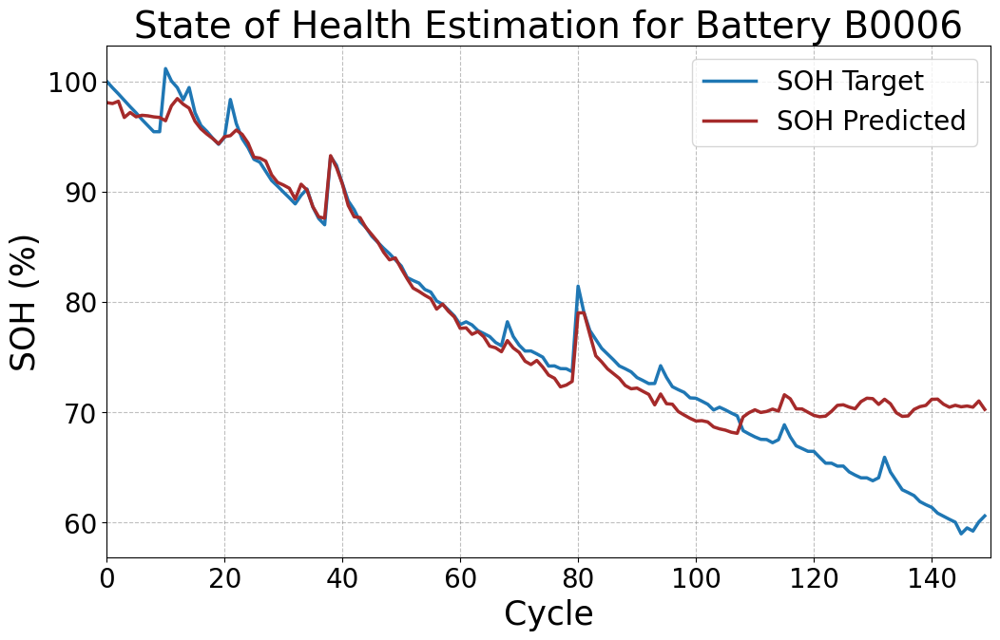

In [375]:
plot_soh(original_y_target_B0006_combined_std, original_y_testresult_B0006_combined_std, "State of Health Estimation for Battery B0006", file_name="B0006_combined_std")

Model 18 - B0006 - Robust Scaler - Combined Data

c:\Users\jawaher.alhaj\AppData\Local\anaconda3\envs\myenv\lib\site-packages\torch\nn\modules\rnn.py:83: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.5 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
c:\Users\jawaher.alhaj\OneDrive - Technology Innovation Institute\Desktop\Dissertation\Nasa Battery Dataset\Single Battery Model\analysis.py:20: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\b\abs_8f7uhuge1i\croot\pytorch-select_1717607507421\work\aten\src\ATen\native\ReduceOps.cpp:1807.)
  target_std = torch.std(targets)


Epoch 1/120, Training Loss: 0.1398, Validation Loss: 0.0672
Validation Distance: 0.3592, Validation Accuracy: 0.0000, SNR: 2.5851
##Metrics##:
MAE : 0.25628164410591125
MSE : 0.09465572237968445
RMSE : 0.5106522440910339
R-squared : -inf
Count: 26
Epoch 2/120, Training Loss: 0.0323, Validation Loss: 0.1576
Validation Distance: 0.4912, Validation Accuracy: 0.0000, SNR: -0.1423
##Metrics##:
MAE : 0.37430906295776367
MSE : 0.1804676055908203
RMSE : 0.6123850345611572
R-squared : -inf
Count: 26
Epoch 3/120, Training Loss: 0.0128, Validation Loss: 0.1087
Validation Distance: 0.4223, Validation Accuracy: 0.0000, SNR: 0.4567
##Metrics##:
MAE : 0.3077253997325897
MSE : 0.13141599297523499
RMSE : 0.5561402440071106
R-squared : -inf
Count: 26
Epoch 4/120, Training Loss: 0.0102, Validation Loss: 0.1501
Validation Distance: 0.4862, Validation Accuracy: 0.0000, SNR: -0.8087
##Metrics##:
MAE : 0.35717666149139404
MSE : 0.17508721351623535
RMSE : 0.5988032817840576
R-squared : -inf
Count: 26
Epoch 5/

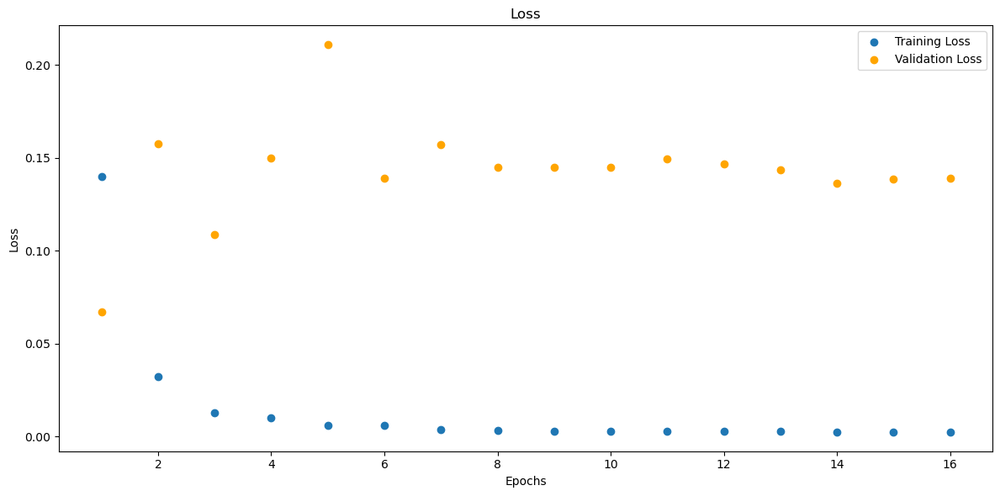

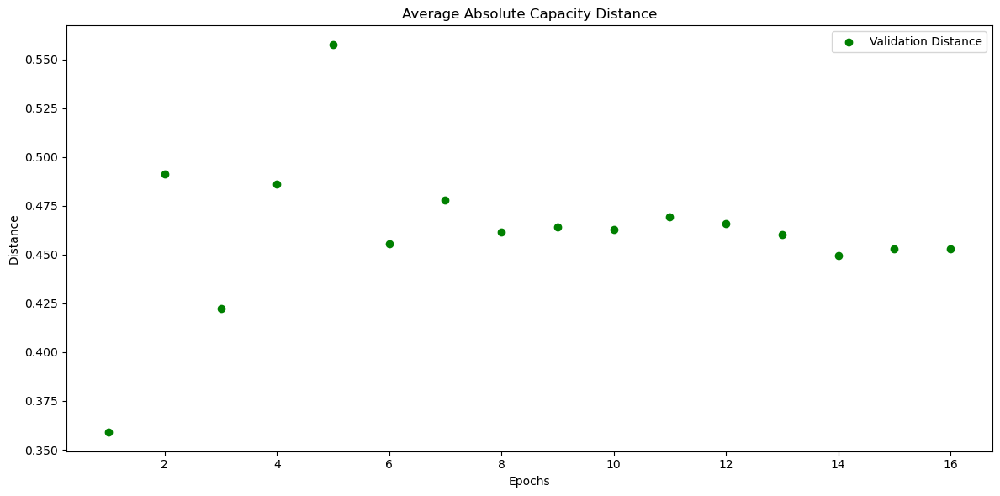

In [223]:
# B0006_combined_rob
model_B0006_combined_rob = LSTM_2(input_shape=input_shape_combined)
model_B0006_combined_rob, train_losses_B0006_combined_rob, val_losses_B0006_combined_rob, val_distances_B0006_combined_rob, metrics_history_B0006_combined_rob = train(data_loaders['B0006_combined_rob_val_loader'], data_loaders['B0006_combined_rob_train_loader'], model_B0006_combined_rob)
torch.save(model_B0006_combined_rob, os.path.join(folder_name, 'model_B0006_combined_rob.pth'))

Test Loss: 0.5806, Test Distance: 0.9046, Test Accuracy: 0.0000, SNR: -2.6092
##Metrics##:
MAE : 0.8791220784187317
MSE : 0.7960215210914612
RMSE : 0.9384021162986755
R-squared : -inf
Count: 21


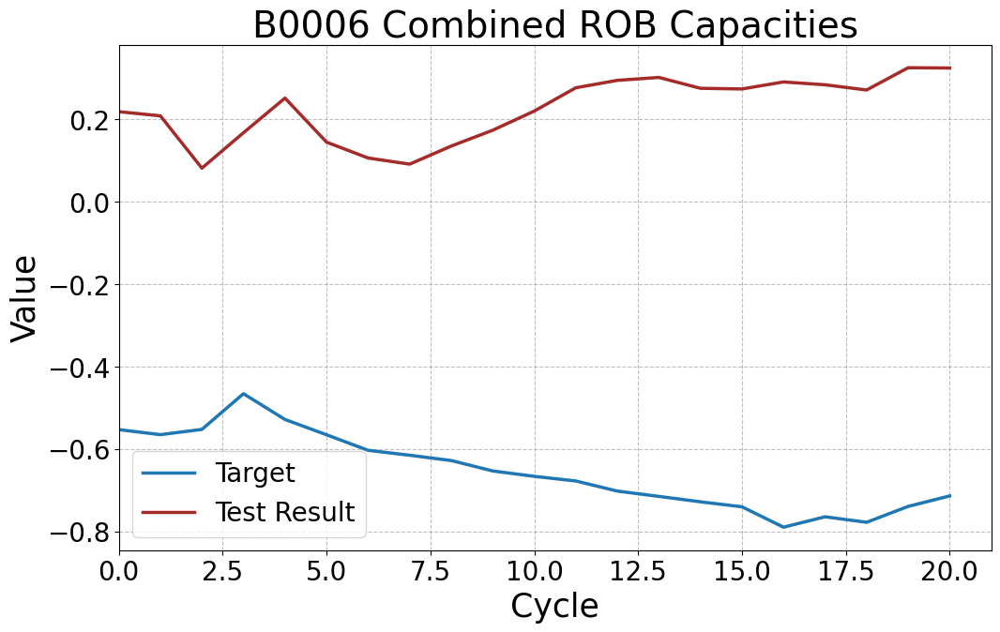

In [224]:
# B0006_combined_rob
model_B0006_combined_rob = torch.load('6. LSTM Models/model_B0006_combined_rob.pth')
y_target_B0006_combined_rob, y_testresult_B0006_combined_rob = test(model_B0006_combined_rob, data_loaders['B0006_combined_rob_test_loader'])
y_target_B0006_combined_rob = flatten_and_concatenate(y_target_B0006_combined_rob)
y_testresult_B0006_combined_rob = flatten_and_concatenate(y_testresult_B0006_combined_rob)
plot_tensors(y_target_B0006_combined_rob, y_testresult_B0006_combined_rob, labels=["Target", "Test Result"], title="B0006 Combined ROB Capacities")


Test on complete dataset.

In [225]:
# Run the test on the model
y_target_B0006_combined_rob, y_testresult_B0006_combined_rob = test(model_B0006_combined_rob, data_loaders['B0006_combined_rob_final_test_loader'])

# Flatten and concatenate the results
y_target_B0006_combined_rob = flatten_and_concatenate(y_target_B0006_combined_rob)
y_testresult_B0006_combined_rob = flatten_and_concatenate(y_testresult_B0006_combined_rob)

# # Assuming scaler_y_combined_B0006 was used for normalization earlier
# # Inverse the normalization process for both target and prediction
# original_y_target_B0006_combined_rob = scaler_y_comb_rob_B0006.inverse_transform(y_target_B0006_combined_rob.numpy().reshape(-1, 1))
# original_y_testresult_B0006_combined_rob = scaler_y_comb_rob_B0006.inverse_transform(y_testresult_B0006_combined_rob.numpy().reshape(-1, 1))

# # Convert the numpy arrays back to tensors
# original_y_target_B0006_combined_rob = torch.tensor(original_y_target_B0006_combined_rob)
# original_y_testresult_B0006_combined_rob = torch.tensor(original_y_testresult_B0006_combined_rob)

# # Plot the inverse transformed results
# plot_tensors(original_y_target_B0006_combined_rob, original_y_testresult_B0006_combined_rob, labels=["Target", "LSTM Result"], title="Capacity Estimation for Battery B0006", file_name="B0006_combined_rob", ylabel="Capacity (Ah)", save_dir="11. LSTM Capacity Plots")


Test Loss: 0.0909, Test Distance: 0.2283, Test Accuracy: 8.0000, SNR: 3.7844
##Metrics##:
MAE : 0.2282976508140564
MSE : 0.13728369772434235
RMSE : 0.4895203113555908
R-squared : -274.4501037597656
Count: 150


SOH Plot.

In [226]:
# plot_soh(original_y_target_B0006_combined_rob, original_y_testresult_B0006_combined_rob, "State of Health Estimation for Battery B0006", file_name="B0006_combined_rob")

Model 19 - B0007 - MinMax Scaler - Charging Data

Epoch 1/120, Training Loss: 0.1550, Validation Loss: 0.0664
Validation Distance: 0.2627, Validation Accuracy: 0.0000, SNR: -8.7569
##Metrics##:
MAE : 0.2039387822151184
MSE : 0.052466101944446564
RMSE : 0.45200851559638977
R-squared : -inf
Count: 26
Epoch 2/120, Training Loss: 0.0310, Validation Loss: 0.0659
Validation Distance: 0.2757, Validation Accuracy: 0.0000, SNR: -8.9558
##Metrics##:
MAE : 0.21215325593948364
MSE : 0.056864574551582336
RMSE : 0.46102869510650635
R-squared : -inf
Count: 26
Epoch 3/120, Training Loss: 0.0154, Validation Loss: 0.0550
Validation Distance: 0.2342, Validation Accuracy: 0.0000, SNR: -8.3478
##Metrics##:
MAE : 0.17794515192508698
MSE : 0.04043613374233246
RMSE : 0.42249253392219543
R-squared : -inf
Count: 26
Epoch 4/120, Training Loss: 0.0130, Validation Loss: 0.0611
Validation Distance: 0.2310, Validation Accuracy: 0.0000, SNR: -8.7765
##Metrics##:
MAE : 0.17434558272361755
MSE : 0.03901107981801033
RMSE : 0.41844987869262695
R-squared : -inf
Count: 26

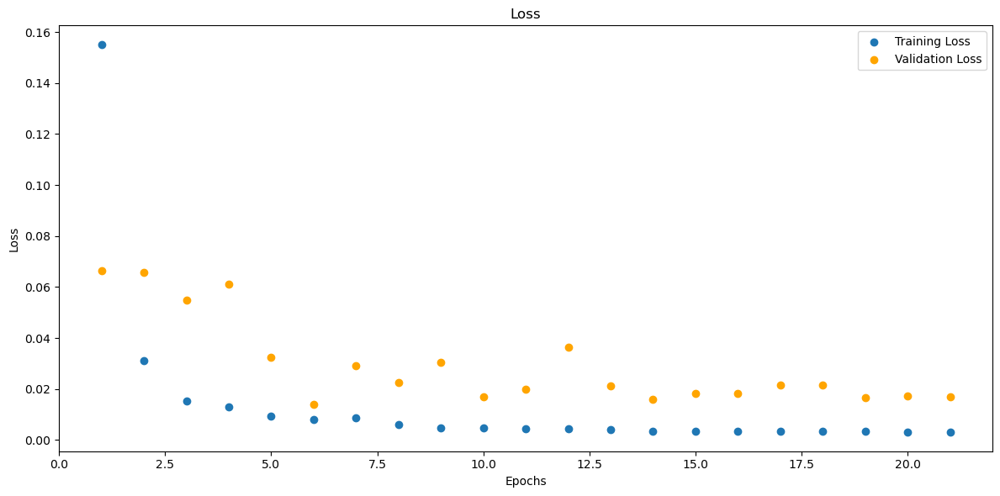

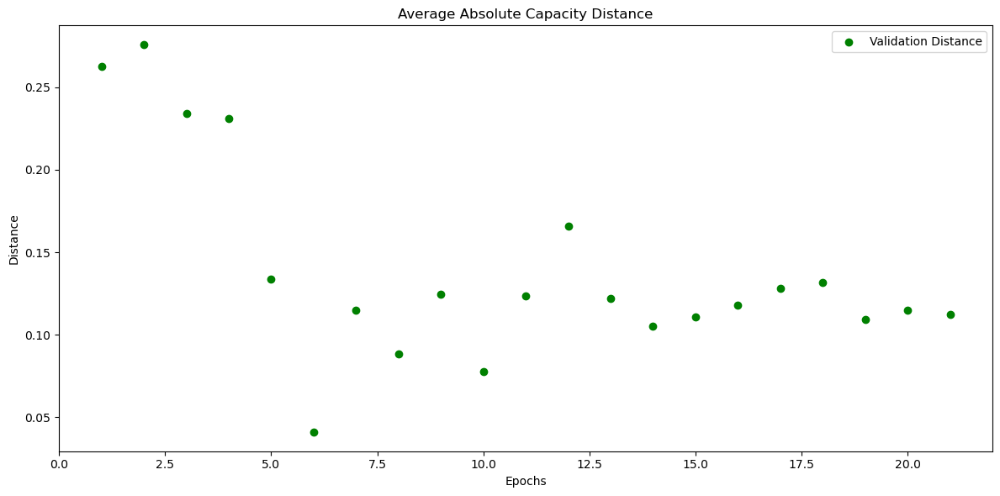

In [227]:
# B0007_charge_mm
model_B0007_charge_mm = LSTM_2(input_shape=input_shape_single)
model_B0007_charge_mm, train_losses_B0007_charge_mm, val_losses_B0007_charge_mm, val_distances_B0007_charge_mm, metrics_history_B0007_charge_mm = train(data_loaders['B0007_charge_mm_val_loader'], data_loaders['B0007_charge_mm_train_loader'], model_B0007_charge_mm)
torch.save(model_B0007_charge_mm, os.path.join(folder_name, 'model_B0007_charge_mm.pth'))

Test Loss: 0.0569, Test Distance: 0.1414, Test Accuracy: 0.0000, SNR: -7.2018
##Metrics##:
MAE : 0.14278236031532288
MSE : 0.022120246663689613
RMSE : 0.3798721432685852
R-squared : -inf
Count: 21


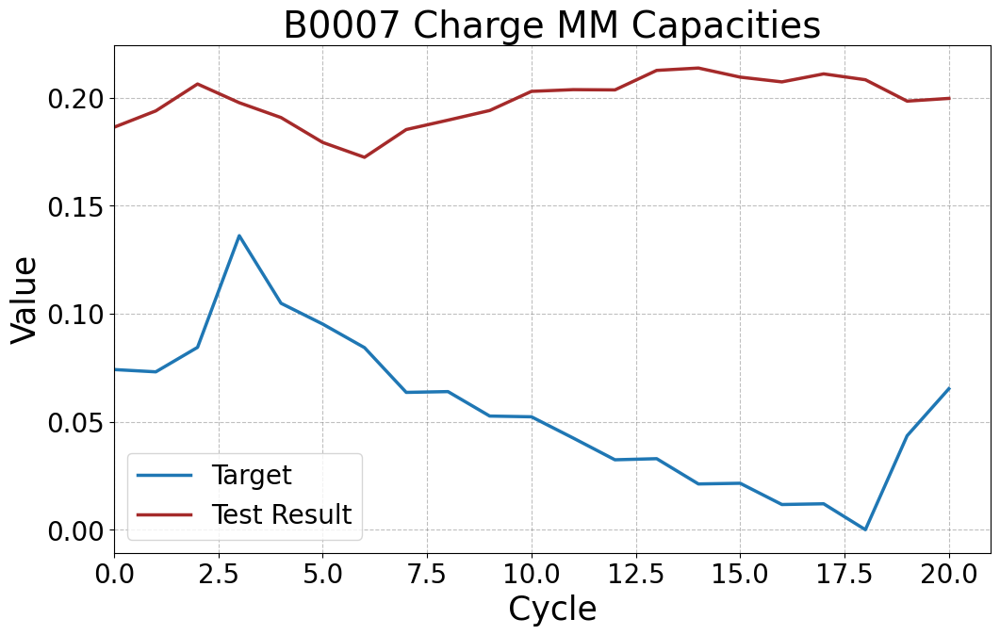

In [228]:
# B0007_charge_mm
model_B0007_charge_mm = torch.load('6. LSTM Models/model_B0007_charge_mm.pth')
y_target_B0007_charge_mm, y_testresult_B0007_charge_mm = test(model_B0007_charge_mm, data_loaders['B0007_charge_mm_test_loader'])
y_target_B0007_charge_mm = flatten_and_concatenate(y_target_B0007_charge_mm)
y_testresult_B0007_charge_mm = flatten_and_concatenate(y_testresult_B0007_charge_mm)
plot_tensors(y_target_B0007_charge_mm, y_testresult_B0007_charge_mm, labels=["Target", "Test Result"], title="B0007 Charge MM Capacities")


Test on complete dataset.

Test Loss: 0.0154, Test Distance: 0.0781, Test Accuracy: 7.3333, SNR: 15.8885
##Metrics##:
MAE : 0.07812809944152832
MSE : 0.008658298291265965
RMSE : 0.2844323515892029
R-squared : -48.510894775390625
Count: 150


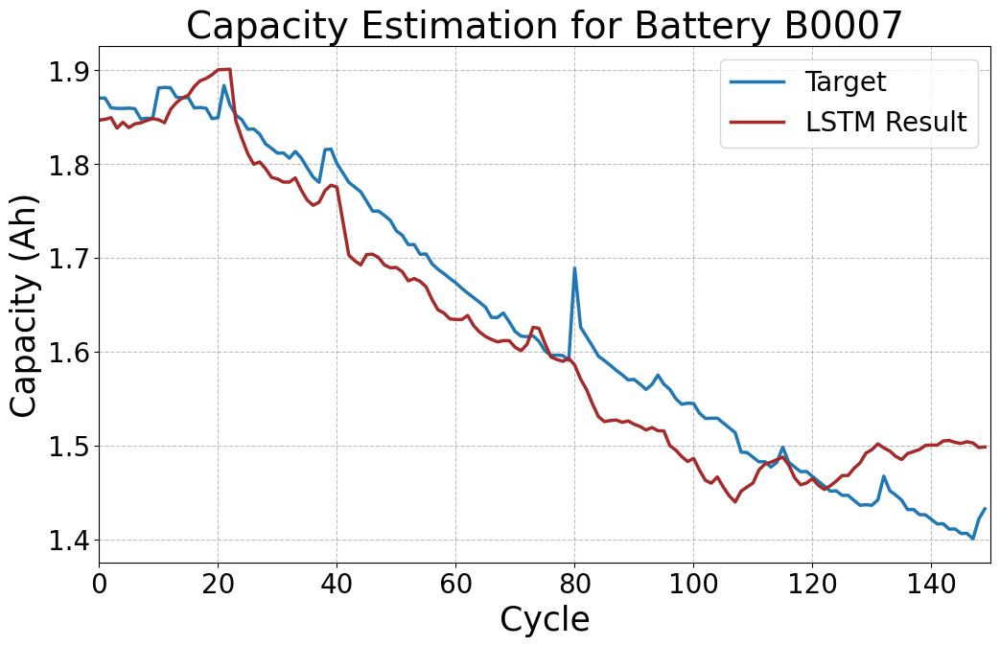

In [229]:
# Run the test on the model
y_target_B0007_charge_mm, y_testresult_B0007_charge_mm = test(model_B0007_charge_mm, data_loaders['B0007_charge_mm_final_test_loader'])

# Flatten and concatenate the results
y_target_B0007_charge_mm = flatten_and_concatenate(y_target_B0007_charge_mm)
y_testresult_B0007_charge_mm = flatten_and_concatenate(y_testresult_B0007_charge_mm)

# Assuming scaler_y_charge_B0007 was used for normalization earlier
# Inverse the normalization process for both target and prediction
original_y_target_B0007_charge_mm = scaler_y_charge_mm_B0007.inverse_transform(y_target_B0007_charge_mm.numpy().reshape(-1, 1))
original_y_testresult_B0007_charge_mm = scaler_y_charge_mm_B0007.inverse_transform(y_testresult_B0007_charge_mm.numpy().reshape(-1, 1))

# Convert the numpy arrays back to tensors
original_y_target_B0007_charge_mm = torch.tensor(original_y_target_B0007_charge_mm)
original_y_testresult_B0007_charge_mm = torch.tensor(original_y_testresult_B0007_charge_mm)

# Plot the inverse transformed results
plot_tensors(original_y_target_B0007_charge_mm, original_y_testresult_B0007_charge_mm, labels=["Target", "LSTM Result"], title="Capacity Estimation for Battery B0007", file_name="B0007_charge_mm", ylabel="Capacity (Ah)", save_dir="11. LSTM Capacity Plots")


SOH Plot.

C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_23676\540638711.py:20: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_target_tensor = torch.tensor(soh_target)
C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_23676\540638711.py:21: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_predicted_tensor = torch.tensor(soh_predicted)


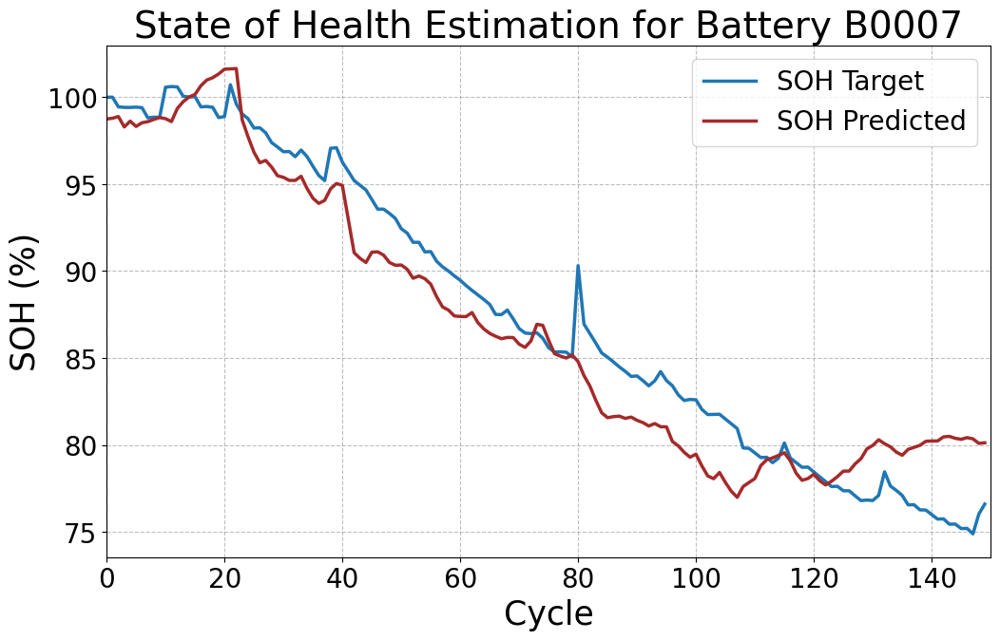

In [230]:
plot_soh(original_y_target_B0007_charge_mm, original_y_testresult_B0007_charge_mm, "State of Health Estimation for Battery B0007", file_name="B0007_charge_mm")

Model 20 - B0007 - Standard Scaler - Charging Data

c:\Users\jawaher.alhaj\AppData\Local\anaconda3\envs\myenv\lib\site-packages\torch\nn\modules\rnn.py:83: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.5 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
c:\Users\jawaher.alhaj\OneDrive - Technology Innovation Institute\Desktop\Dissertation\Nasa Battery Dataset\Single Battery Model\analysis.py:20: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\b\abs_8f7uhuge1i\croot\pytorch-select_1717607507421\work\aten\src\ATen\native\ReduceOps.cpp:1807.)
  target_std = torch.std(targets)


Epoch 1/120, Training Loss: 0.1097, Validation Loss: 0.5086
Validation Distance: 0.8055, Validation Accuracy: 0.0000, SNR: 2.5613
##Metrics##:
MAE : 0.6021904349327087
MSE : 0.4685152769088745
RMSE : 0.777550458908081
R-squared : -inf
Count: 26
Epoch 2/120, Training Loss: 0.0374, Validation Loss: 0.5810
Validation Distance: 0.8530, Validation Accuracy: 0.0000, SNR: 2.0850
##Metrics##:
MAE : 0.6485394239425659
MSE : 0.5365232825279236
RMSE : 0.8063868284225464
R-squared : -inf
Count: 26
Epoch 3/120, Training Loss: 0.0337, Validation Loss: 0.1421
Validation Distance: 0.4124, Validation Accuracy: 0.0000, SNR: 6.9192
##Metrics##:
MAE : 0.2863469123840332
MSE : 0.12277993559837341
RMSE : 0.5437473654747009
R-squared : -inf
Count: 26
Epoch 4/120, Training Loss: 0.0423, Validation Loss: 0.4146
Validation Distance: 0.7010, Validation Accuracy: 0.0000, SNR: 3.2591
##Metrics##:
MAE : 0.5282173752784729
MSE : 0.36082643270492554
RMSE : 0.72842937707901
R-squared : -inf
Count: 26
Epoch 5/120, Trai

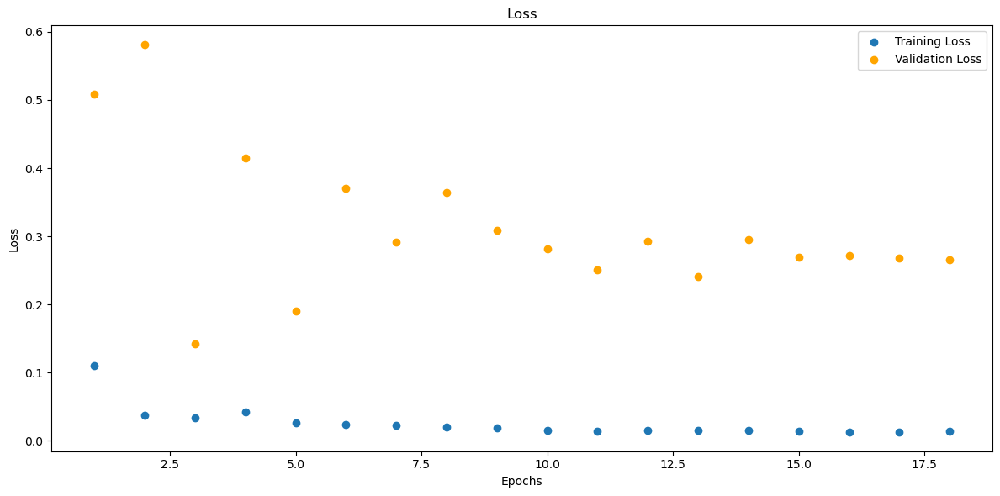

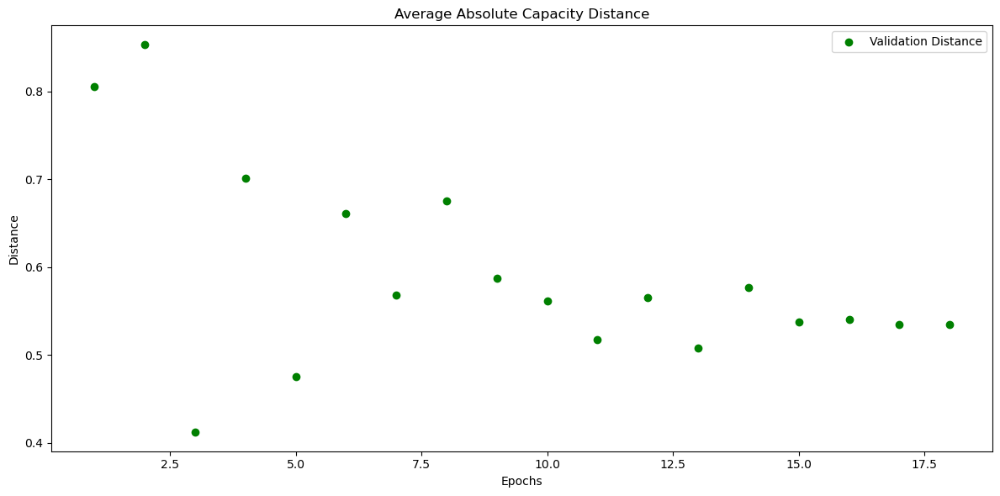

In [231]:
# B0007_charge_std
model_B0007_charge_std = LSTM_2(input_shape=input_shape_single)
model_B0007_charge_std, train_losses_B0007_charge_std, val_losses_B0007_charge_std, val_distances_B0007_charge_std, metrics_history_B0007_charge_std = train(data_loaders['B0007_charge_std_val_loader'], data_loaders['B0007_charge_std_train_loader'], model_B0007_charge_std)
torch.save(model_B0007_charge_std, os.path.join(folder_name, 'model_B0007_charge_std.pth'))

Test Loss: 0.8667, Test Distance: 0.9052, Test Accuracy: 0.0000, SNR: 3.2984
##Metrics##:
MAE : 0.9143640398979187
MSE : 0.8582589030265808
RMSE : 0.9578866958618164
R-squared : -inf
Count: 21


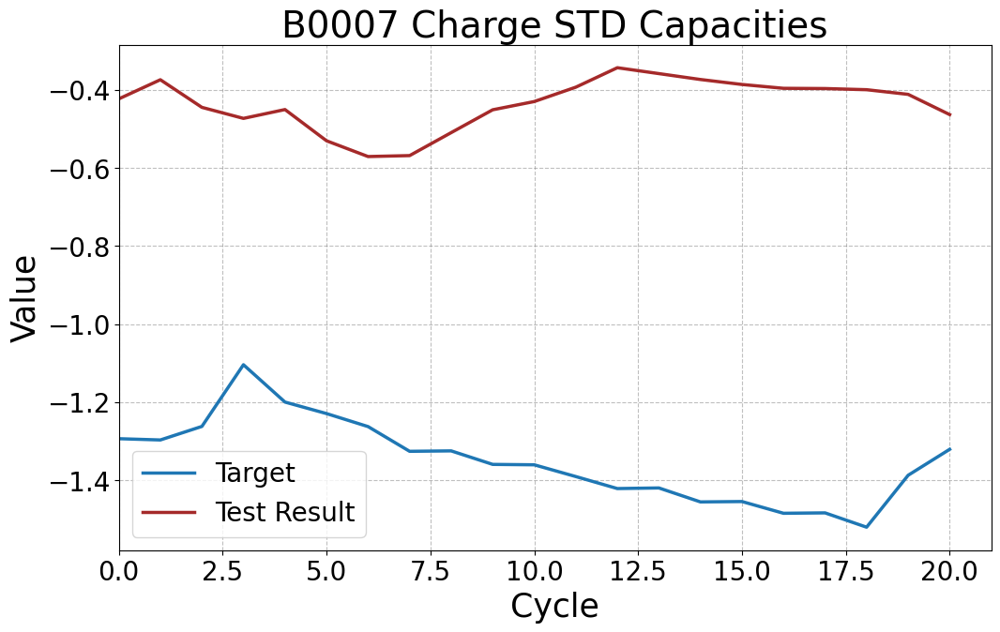

In [232]:
# B0007_charge_std
model_B0007_charge_std = torch.load('6. LSTM Models/model_B0007_charge_std.pth')
y_target_B0007_charge_std, y_testresult_B0007_charge_std = test(model_B0007_charge_std, data_loaders['B0007_charge_std_test_loader'])
y_target_B0007_charge_std = flatten_and_concatenate(y_target_B0007_charge_std)
y_testresult_B0007_charge_std = flatten_and_concatenate(y_testresult_B0007_charge_std)
plot_tensors(y_target_B0007_charge_std, y_testresult_B0007_charge_std, labels=["Target", "Test Result"], title="B0007 Charge STD Capacities")


Test on complete dataset.

Test Loss: 0.1604, Test Distance: 0.2965, Test Accuracy: 6.6667, SNR: 7.4086
##Metrics##:
MAE : 0.29651525616645813
MSE : 0.1727932244539261
RMSE : 0.5534970760345459
R-squared : -138.51870727539062
Count: 150


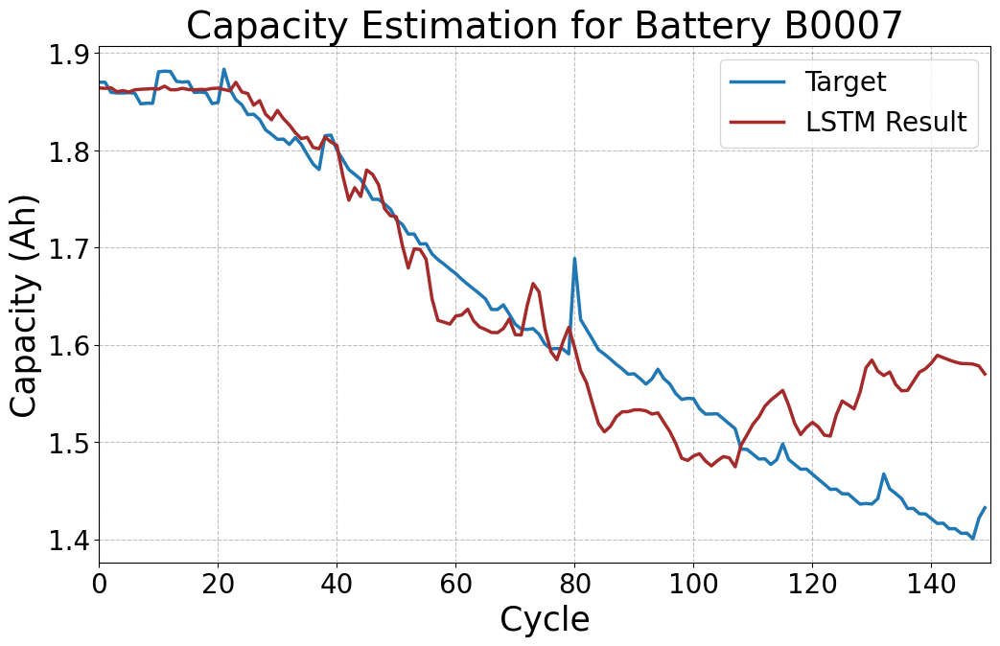

In [233]:
# Run the test on the model
y_target_B0007_charge_std, y_testresult_B0007_charge_std = test(model_B0007_charge_std, data_loaders['B0007_charge_std_final_test_loader'])

# Flatten and concatenate the results
y_target_B0007_charge_std = flatten_and_concatenate(y_target_B0007_charge_std)
y_testresult_B0007_charge_std = flatten_and_concatenate(y_testresult_B0007_charge_std)

# Assuming scaler_y_charge_B0007 was used for normalization earlier
# Inverse the normalization process for both target and prediction
original_y_target_B0007_charge_std = scaler_y_charge_std_B0007.inverse_transform(y_target_B0007_charge_std.numpy().reshape(-1, 1))
original_y_testresult_B0007_charge_std = scaler_y_charge_std_B0007.inverse_transform(y_testresult_B0007_charge_std.numpy().reshape(-1, 1))

# Convert the numpy arrays back to tensors
original_y_target_B0007_charge_std = torch.tensor(original_y_target_B0007_charge_std)
original_y_testresult_B0007_charge_std = torch.tensor(original_y_testresult_B0007_charge_std)

# Plot the inverse transformed results
plot_tensors(original_y_target_B0007_charge_std, original_y_testresult_B0007_charge_std, labels=["Target", "LSTM Result"], title="Capacity Estimation for Battery B0007", file_name="B0007_charge_std", ylabel="Capacity (Ah)", save_dir="11. LSTM Capacity Plots")


SOH Plot.

C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_23676\540638711.py:20: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_target_tensor = torch.tensor(soh_target)
C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_23676\540638711.py:21: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_predicted_tensor = torch.tensor(soh_predicted)


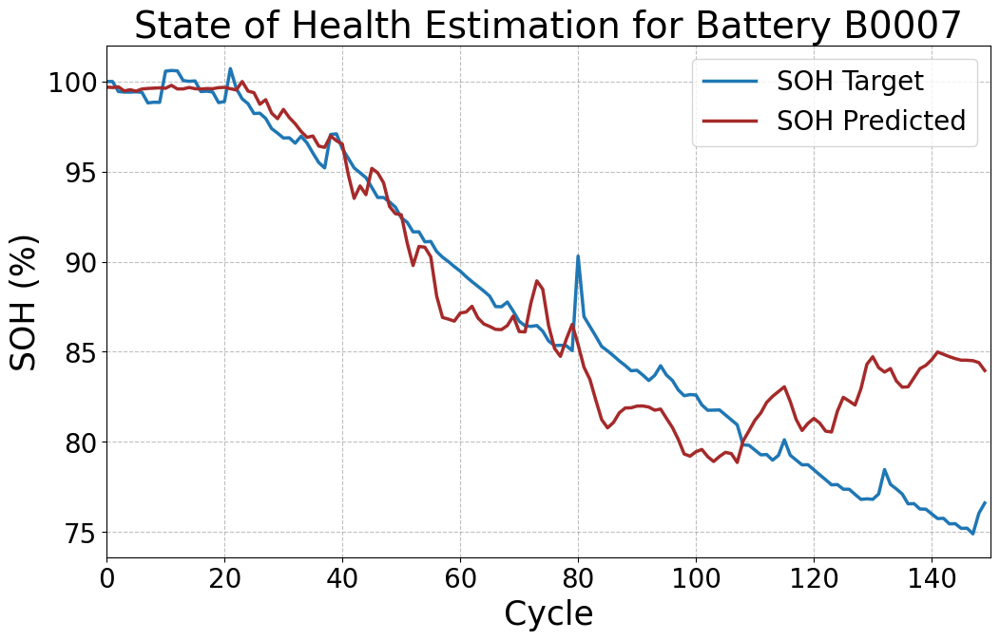

In [234]:
plot_soh(original_y_target_B0007_charge_std, original_y_testresult_B0007_charge_std, "State of Health Estimation for Battery B0007", file_name="B0007_charge_std")

Model 21 - B0007 - Robust Scaler - Charging Data

c:\Users\jawaher.alhaj\AppData\Local\anaconda3\envs\myenv\lib\site-packages\torch\nn\modules\rnn.py:83: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.5 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
c:\Users\jawaher.alhaj\OneDrive - Technology Innovation Institute\Desktop\Dissertation\Nasa Battery Dataset\Single Battery Model\analysis.py:20: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\b\abs_8f7uhuge1i\croot\pytorch-select_1717607507421\work\aten\src\ATen\native\ReduceOps.cpp:1807.)
  target_std = torch.std(targets)


Epoch 1/120, Training Loss: 0.2819, Validation Loss: 0.0297
Validation Distance: 0.1555, Validation Accuracy: 0.0000, SNR: 7.9381
##Metrics##:
MAE : 0.11052606999874115
MSE : 0.02001466229557991
RMSE : 0.34398695826530457
R-squared : -inf
Count: 26
Epoch 2/120, Training Loss: 0.0312, Validation Loss: 0.0341
Validation Distance: 0.2033, Validation Accuracy: 0.0000, SNR: 6.4807
##Metrics##:
MAE : 0.14669059216976166
MSE : 0.030635694041848183
RMSE : 0.3859270513057709
R-squared : -inf
Count: 26
Epoch 3/120, Training Loss: 0.0114, Validation Loss: 0.0426
Validation Distance: 0.2399, Validation Accuracy: 0.0000, SNR: 5.5742
##Metrics##:
MAE : 0.17641785740852356
MSE : 0.04236728698015213
RMSE : 0.4216426908969879
R-squared : -inf
Count: 26
Epoch 4/120, Training Loss: 0.0091, Validation Loss: 0.0785
Validation Distance: 0.3231, Validation Accuracy: 0.0000, SNR: 3.5476
##Metrics##:
MAE : 0.2476653903722763
MSE : 0.07945038378238678
RMSE : 0.4985935091972351
R-squared : -inf
Count: 26
Epoch 5

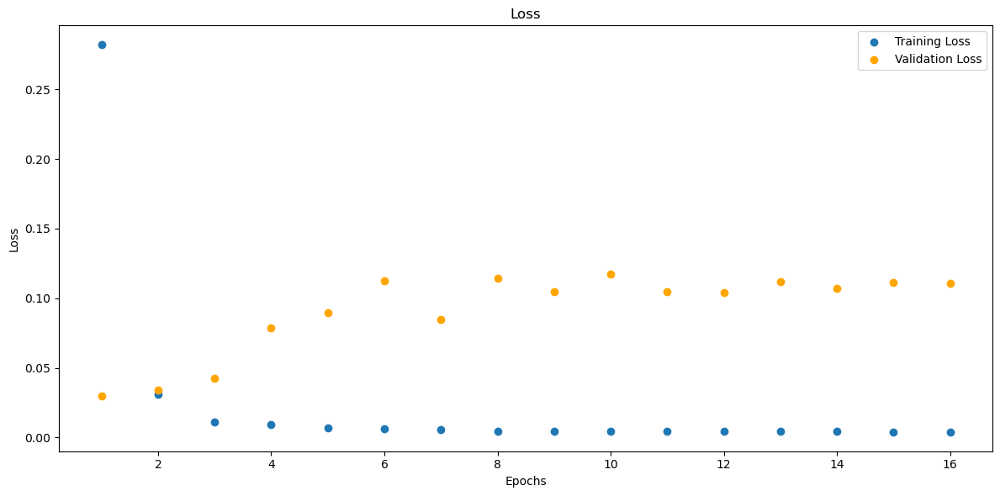

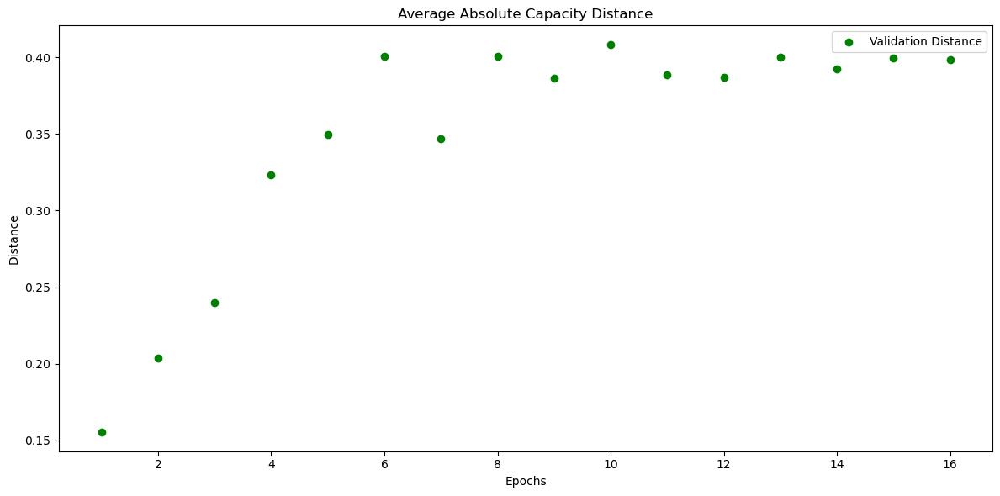

In [235]:
# B0007_charge_rob
model_B0007_charge_rob = LSTM_2(input_shape=input_shape_single)
model_B0007_charge_rob, train_losses_B0007_charge_rob, val_losses_B0007_charge_rob, val_distances_B0007_charge_rob, metrics_history_B0007_charge_rob = train(data_loaders['B0007_charge_rob_val_loader'], data_loaders['B0007_charge_rob_train_loader'], model_B0007_charge_rob)
torch.save(model_B0007_charge_rob, os.path.join(folder_name, 'model_B0007_charge_rob.pth'))

Test Loss: 0.1681, Test Distance: 0.4260, Test Accuracy: 0.0000, SNR: 2.8055
##Metrics##:
MAE : 0.4259432852268219
MSE : 0.1902238130569458
RMSE : 0.6545476913452148
R-squared : -inf
Count: 21


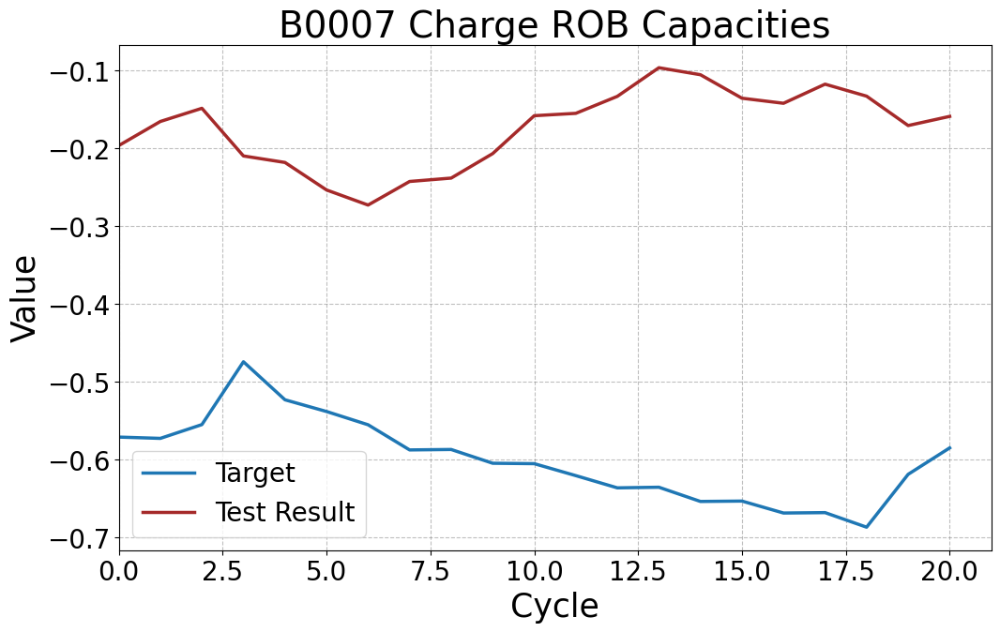

In [236]:
# B0007_charge_rob
model_B0007_charge_rob = torch.load('6. LSTM Models/model_B0007_charge_rob.pth')
y_target_B0007_charge_rob, y_testresult_B0007_charge_rob = test(model_B0007_charge_rob, data_loaders['B0007_charge_rob_test_loader'])
y_target_B0007_charge_rob = flatten_and_concatenate(y_target_B0007_charge_rob)
y_testresult_B0007_charge_rob = flatten_and_concatenate(y_testresult_B0007_charge_rob)
plot_tensors(y_target_B0007_charge_rob, y_testresult_B0007_charge_rob, labels=["Target", "Test Result"], title="B0007 Charge ROB Capacities")


Test on complete dataset.

In [237]:
# Run the test on the model
y_target_B0007_charge_rob, y_testresult_B0007_charge_rob = test(model_B0007_charge_rob, data_loaders['B0007_charge_rob_final_test_loader'])

# Flatten and concatenate the results
y_target_B0007_charge_rob = flatten_and_concatenate(y_target_B0007_charge_rob)
y_testresult_B0007_charge_rob = flatten_and_concatenate(y_testresult_B0007_charge_rob)

# # Assuming scaler_y_charge_B0007 was used for normalization earlier
# # Inverse the normalization process for both target and prediction
# original_y_target_B0007_charge_rob = scaler_y_charge_rob_B0007.inverse_transform(y_target_B0007_charge_rob.numpy().reshape(-1, 1))
# original_y_testresult_B0007_charge_rob = scaler_y_charge_rob_B0007.inverse_transform(y_testresult_B0007_charge_rob.numpy().reshape(-1, 1))

# # Convert the numpy arrays back to tensors
# original_y_target_B0007_charge_rob = torch.tensor(original_y_target_B0007_charge_rob)
# original_y_testresult_B0007_charge_rob = torch.tensor(original_y_testresult_B0007_charge_rob)

# # Plot the inverse transformed results
# plot_tensors(original_y_target_B0007_charge_rob, original_y_testresult_B0007_charge_rob, labels=["Target", "LSTM Result"], title="Capacity Estimation for Battery B0007", file_name="B0007_charge_rob", ylabel="Capacity (Ah)", save_dir="11. LSTM Capacity Plots")


Test Loss: 0.0461, Test Distance: 0.1778, Test Accuracy: 2.6667, SNR: 7.1205
##Metrics##:
MAE : 0.17780297994613647
MSE : 0.04909544810652733
RMSE : 0.43044134974479675
R-squared : -178.627197265625
Count: 150


SOH Plot.

In [238]:
# plot_soh(original_y_target_B0007_charge_rob, original_y_testresult_B0007_charge_rob, "State of Health Estimation for Battery B0007", file_name="B0007_charge_rob")

Model 22 - B0007 - MinMax Scaler - Discharging Data

Epoch 1/120, Training Loss: 0.0944, Validation Loss: 0.0787
Validation Distance: 0.2843, Validation Accuracy: 0.0000, SNR: -8.3769
##Metrics##:
MAE : 0.22713986039161682
MSE : 0.06503382325172424
RMSE : 0.47698962688446045
R-squared : -inf
Count: 26
Epoch 2/120, Training Loss: 0.0127, Validation Loss: 0.0282
Validation Distance: 0.1796, Validation Accuracy: 0.0000, SNR: -5.2400
##Metrics##:
MAE : 0.1403810679912567
MSE : 0.026838816702365875
RMSE : 0.37669122219085693
R-squared : -inf
Count: 26
Epoch 3/120, Training Loss: 0.0067, Validation Loss: 0.0111
Validation Distance: 0.0759, Validation Accuracy: 9.5238, SNR: -1.7873
##Metrics##:
MAE : 0.05564943328499794
MSE : 0.006310566328465939
RMSE : 0.24748995900154114
R-squared : -inf
Count: 26
Epoch 4/120, Training Loss: 0.0053, Validation Loss: 0.0084
Validation Distance: 0.0677, Validation Accuracy: 14.2857, SNR: -0.3703
##Metrics##:
MAE : 0.04882577434182167
MSE : 0.004891964606940746
RMSE : 0.2308773696422577
R-squared : -inf
Count: 2

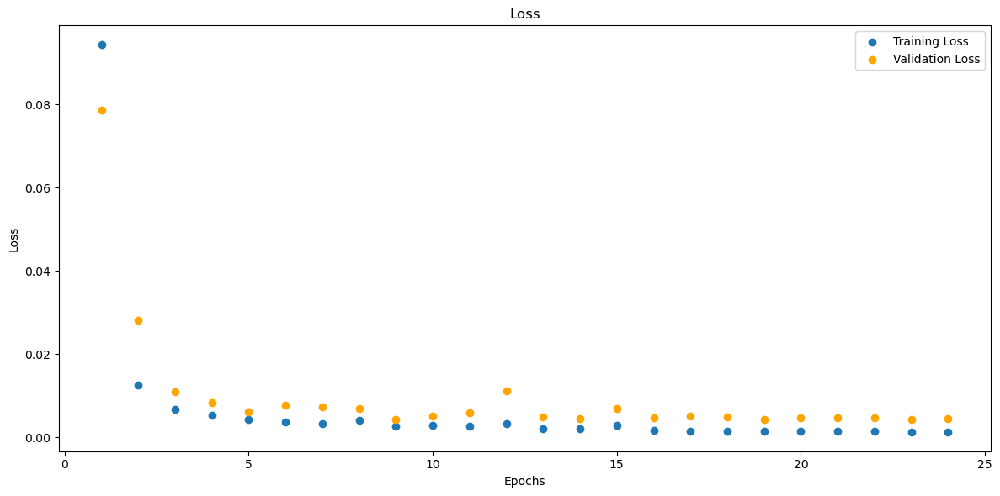

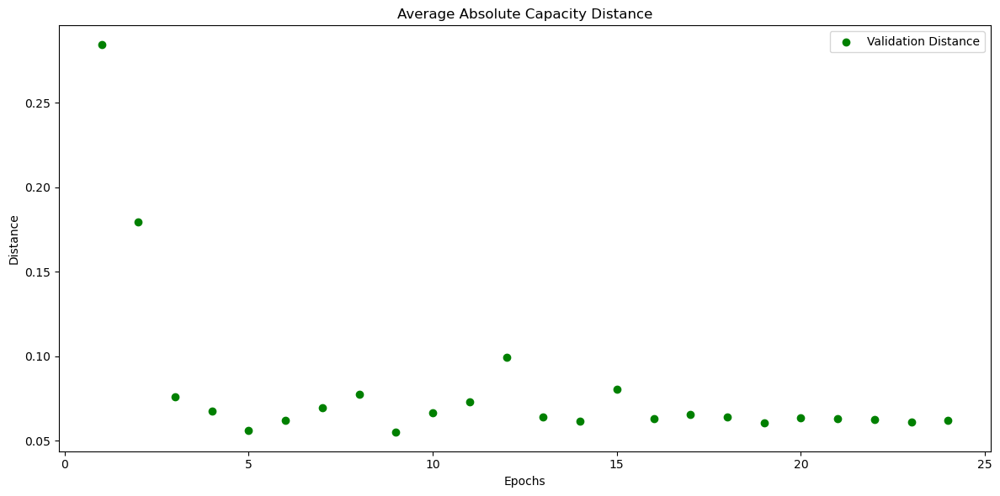

In [239]:
# B0007_discharge_mm
model_B0007_discharge_mm = LSTM_2(input_shape=input_shape_single)
model_B0007_discharge_mm, train_losses_B0007_discharge_mm, val_losses_B0007_discharge_mm, val_distances_B0007_discharge_mm, metrics_history_B0007_discharge_mm = train(data_loaders['B0007_discharge_mm_val_loader'], data_loaders['B0007_discharge_mm_train_loader'], model_B0007_discharge_mm)
torch.save(model_B0007_discharge_mm, os.path.join(folder_name, 'model_B0007_discharge_mm.pth'))

Test Loss: 0.0071, Test Distance: 0.0478, Test Accuracy: 0.0000, SNR: 0.9846
##Metrics##:
MAE : 0.05208593234419823
MSE : 0.003358498215675354
RMSE : 0.23701046407222748
R-squared : -inf
Count: 21


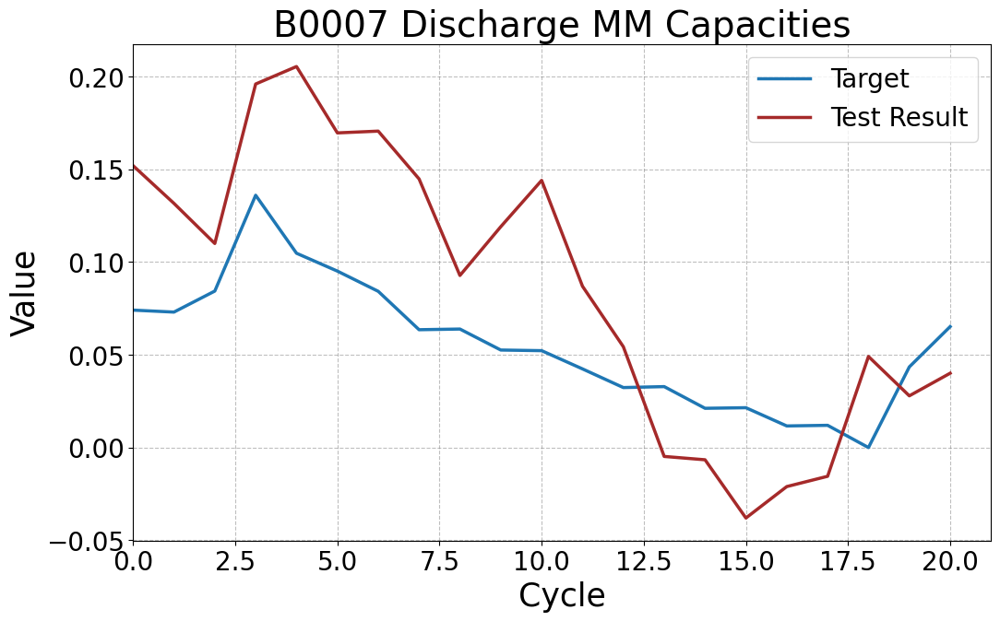

In [240]:
# B0007_discharge_mm
model_B0007_discharge_mm = torch.load('6. LSTM Models/model_B0007_discharge_mm.pth')
y_target_B0007_discharge_mm, y_testresult_B0007_discharge_mm = test(model_B0007_discharge_mm, data_loaders['B0007_discharge_mm_test_loader'])
y_target_B0007_discharge_mm = flatten_and_concatenate(y_target_B0007_discharge_mm)
y_testresult_B0007_discharge_mm = flatten_and_concatenate(y_testresult_B0007_discharge_mm)
plot_tensors(y_target_B0007_discharge_mm, y_testresult_B0007_discharge_mm, labels=["Target", "Test Result"], title="B0007 Discharge MM Capacities")


Test on complete dataset.

Test Loss: 0.0033, Test Distance: 0.0336, Test Accuracy: 22.6667, SNR: 22.6707
##Metrics##:
MAE : 0.03356073424220085
MSE : 0.0018164124339818954
RMSE : 0.19366605579853058
R-squared : -12.52386474609375
Count: 150


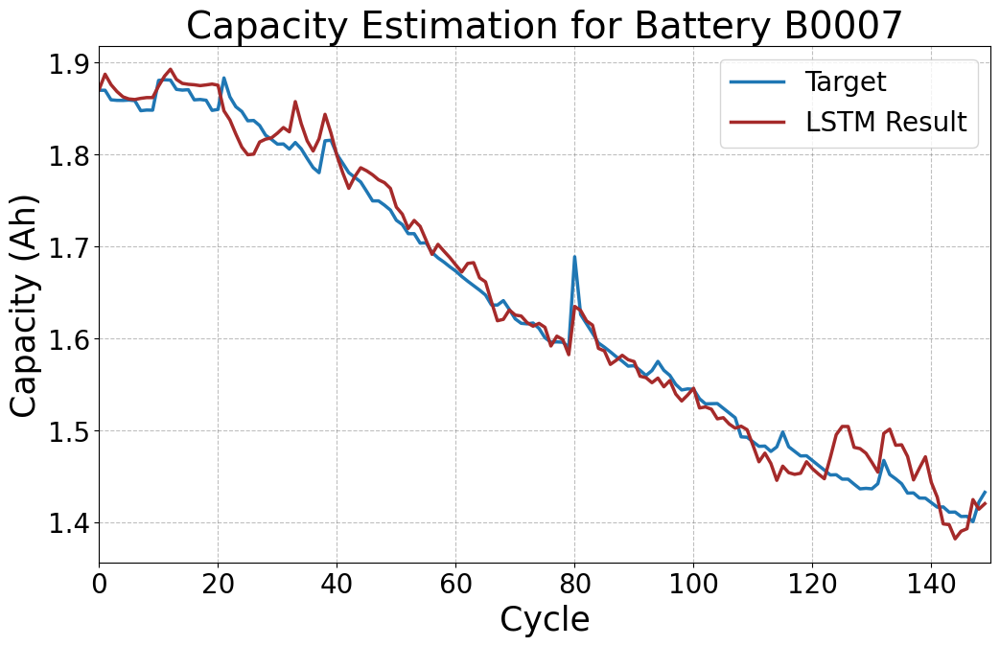

In [241]:
# Run the test on the model
y_target_B0007_discharge_mm, y_testresult_B0007_discharge_mm = test(model_B0007_discharge_mm, data_loaders['B0007_discharge_mm_final_test_loader'])

# Flatten and concatenate the results
y_target_B0007_discharge_mm = flatten_and_concatenate(y_target_B0007_discharge_mm)
y_testresult_B0007_discharge_mm = flatten_and_concatenate(y_testresult_B0007_discharge_mm)

# Assuming scaler_y_discharge_B0007 was used for normalization earlier
# Inverse the normalization process for both target and prediction
original_y_target_B0007_discharge_mm = scaler_y_dis_mm_B0007.inverse_transform(y_target_B0007_discharge_mm.numpy().reshape(-1, 1))
original_y_testresult_B0007_discharge_mm = scaler_y_dis_mm_B0007.inverse_transform(y_testresult_B0007_discharge_mm.numpy().reshape(-1, 1))

# Convert the numpy arrays back to tensors
original_y_target_B0007_discharge_mm = torch.tensor(original_y_target_B0007_discharge_mm)
original_y_testresult_B0007_discharge_mm = torch.tensor(original_y_testresult_B0007_discharge_mm)

# Plot the inverse transformed results
plot_tensors(original_y_target_B0007_discharge_mm, original_y_testresult_B0007_discharge_mm, labels=["Target", "LSTM Result"], title="Capacity Estimation for Battery B0007", file_name="B0007_discharge_mm", ylabel="Capacity (Ah)", save_dir="11. LSTM Capacity Plots")

SOH Plot.

C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_23676\540638711.py:20: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_target_tensor = torch.tensor(soh_target)
C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_23676\540638711.py:21: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_predicted_tensor = torch.tensor(soh_predicted)


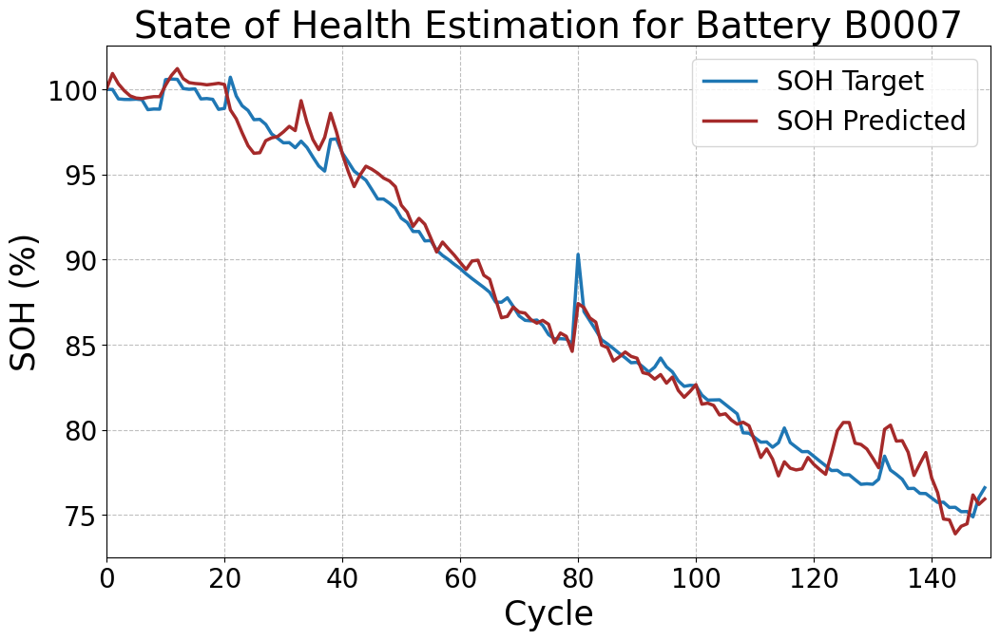

In [242]:
plot_soh(original_y_target_B0007_discharge_mm, original_y_testresult_B0007_discharge_mm, "State of Health Estimation for Battery B0007", file_name="B0007_discharge_mm")

Model 22 - B0007 - Standard Scaler - Discharging Data

c:\Users\jawaher.alhaj\AppData\Local\anaconda3\envs\myenv\lib\site-packages\torch\nn\modules\rnn.py:83: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.5 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
c:\Users\jawaher.alhaj\OneDrive - Technology Innovation Institute\Desktop\Dissertation\Nasa Battery Dataset\Single Battery Model\analysis.py:20: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\b\abs_8f7uhuge1i\croot\pytorch-select_1717607507421\work\aten\src\ATen\native\ReduceOps.cpp:1807.)
  target_std = torch.std(targets)


Epoch 1/120, Training Loss: 0.1177, Validation Loss: 0.1247
Validation Distance: 0.4517, Validation Accuracy: 0.0000, SNR: 5.8891
##Metrics##:
MAE : 0.2736204266548157
MSE : 0.1615060269832611
RMSE : 0.5344222187995911
R-squared : -inf
Count: 26
Epoch 2/120, Training Loss: 0.0348, Validation Loss: 0.0919
Validation Distance: 0.3588, Validation Accuracy: 9.5238, SNR: 6.9168
##Metrics##:
MAE : 0.20954006910324097
MSE : 0.1147526353597641
RMSE : 0.4676520824432373
R-squared : -inf
Count: 26
Epoch 3/120, Training Loss: 0.0229, Validation Loss: 0.0822
Validation Distance: 0.3527, Validation Accuracy: 0.0000, SNR: 7.4953
##Metrics##:
MAE : 0.2140965461730957
MSE : 0.10346952825784683
RMSE : 0.46884533762931824
R-squared : -inf
Count: 26
Epoch 4/120, Training Loss: 0.0151, Validation Loss: 0.1307
Validation Distance: 0.4511, Validation Accuracy: 0.0000, SNR: 5.8228
##Metrics##:
MAE : 0.28815406560897827
MSE : 0.15769831836223602
RMSE : 0.5416572690010071
R-squared : -inf
Count: 26
Epoch 5/120

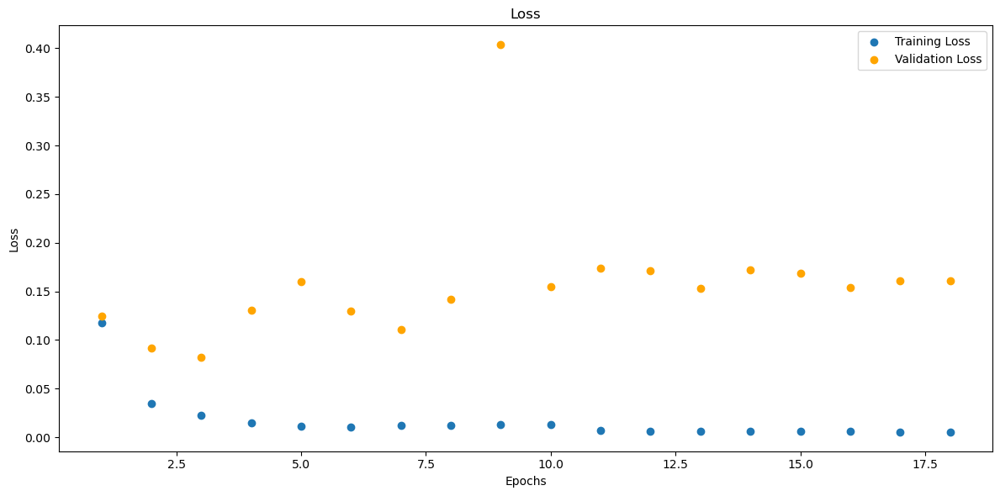

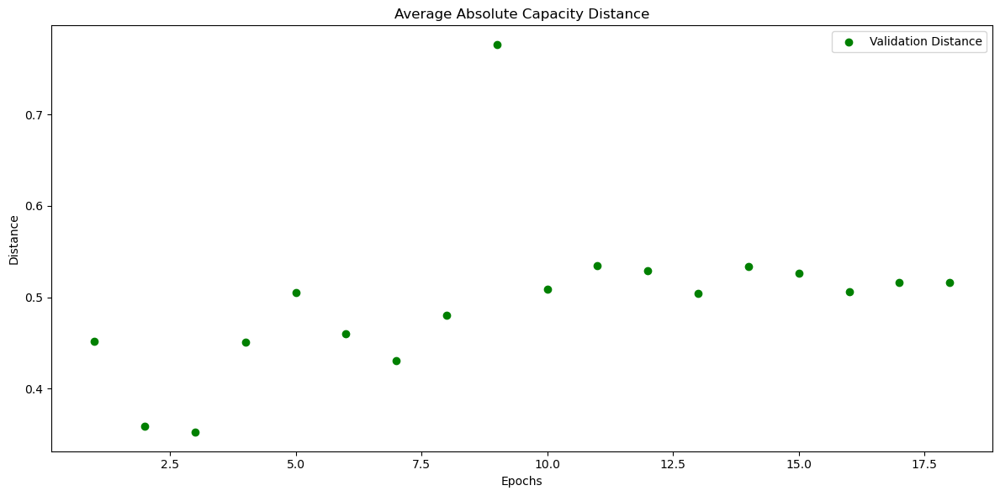

In [243]:
# B0007_discharge_std
model_B0007_discharge_std = LSTM_2(input_shape=input_shape_single)
model_B0007_discharge_std, train_losses_B0007_discharge_std, val_losses_B0007_discharge_std, val_distances_B0007_discharge_std, metrics_history_B0007_discharge_std = train(data_loaders['B0007_discharge_std_val_loader'], data_loaders['B0007_discharge_std_train_loader'], model_B0007_discharge_std)
torch.save(model_B0007_discharge_std, os.path.join(folder_name, 'model_B0007_discharge_std.pth'))

Test Loss: 0.4738, Test Distance: 0.6814, Test Accuracy: 0.0000, SNR: 5.4381
##Metrics##:
MAE : 0.7047064304351807
MSE : 0.5243887901306152
RMSE : 0.8471059203147888
R-squared : -inf
Count: 21


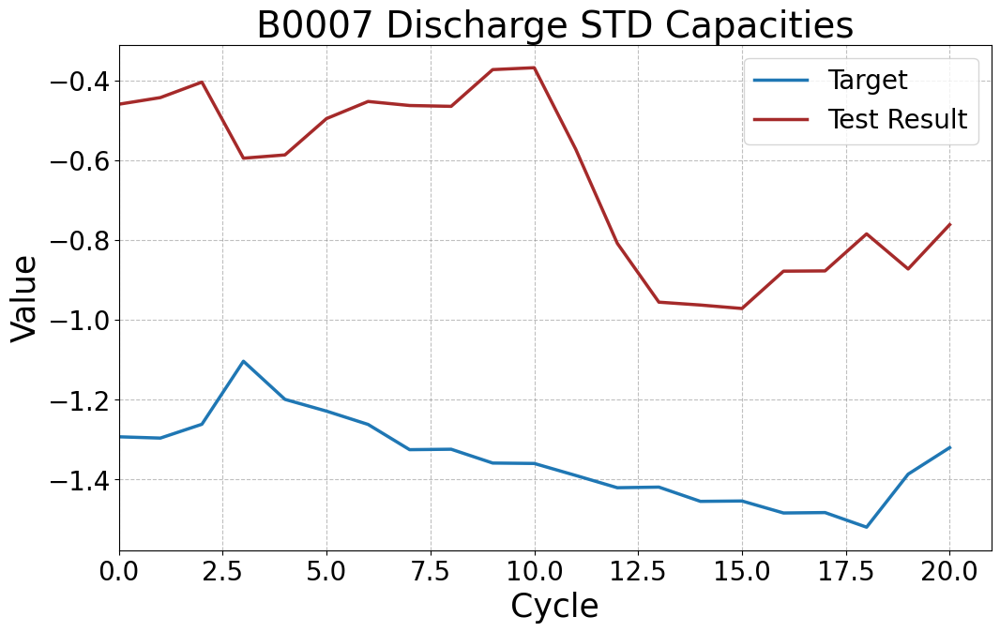

In [244]:
# B0007_discharge_std
model_B0007_discharge_std = torch.load('6. LSTM Models/model_B0007_discharge_std.pth')
y_target_B0007_discharge_std, y_testresult_B0007_discharge_std = test(model_B0007_discharge_std, data_loaders['B0007_discharge_std_test_loader'])
y_target_B0007_discharge_std = flatten_and_concatenate(y_target_B0007_discharge_std)
y_testresult_B0007_discharge_std = flatten_and_concatenate(y_testresult_B0007_discharge_std)
plot_tensors(y_target_B0007_discharge_std, y_testresult_B0007_discharge_std, labels=["Target", "Test Result"], title="B0007 Discharge STD Capacities")


Test on Complete Dataset.

Test Loss: 0.0907, Test Distance: 0.1927, Test Accuracy: 11.3333, SNR: 9.8469
##Metrics##:
MAE : 0.19269366562366486
MSE : 0.09856018424034119
RMSE : 0.45191922783851624
R-squared : -77.41804504394531
Count: 150


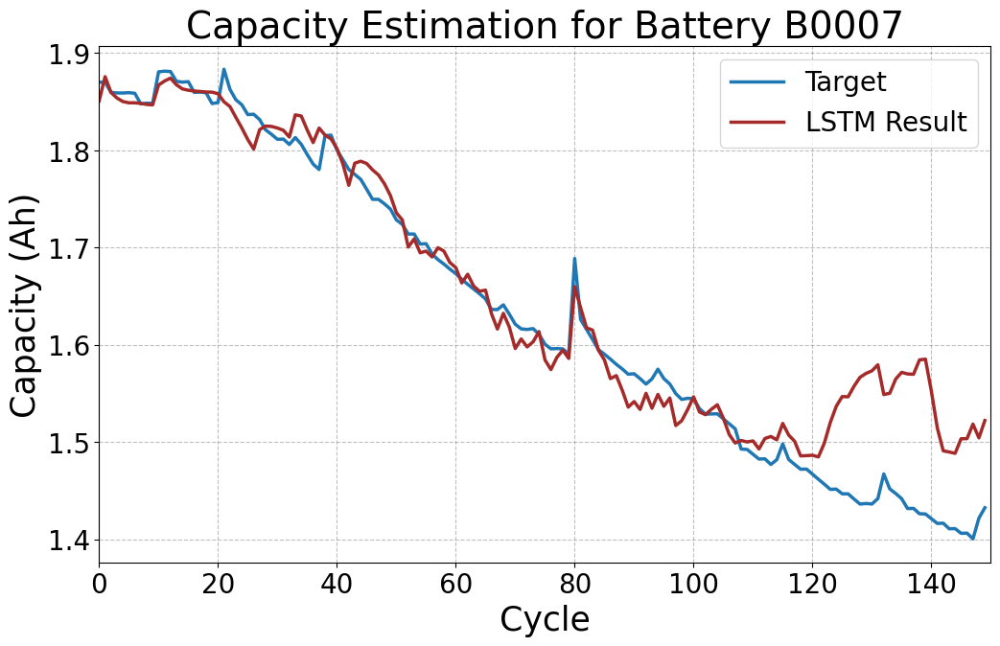

In [245]:
# Run the test on the model
y_target_B0007_discharge_std, y_testresult_B0007_discharge_std = test(model_B0007_discharge_std, data_loaders['B0007_discharge_std_final_test_loader'])

# Flatten and concatenate the results
y_target_B0007_discharge_std = flatten_and_concatenate(y_target_B0007_discharge_std)
y_testresult_B0007_discharge_std = flatten_and_concatenate(y_testresult_B0007_discharge_std)

# Assuming scaler_y_discharge_B0007 was used for normalization earlier
# Inverse the normalization process for both target and prediction
original_y_target_B0007_discharge_std = scaler_y_dis_std_B0007.inverse_transform(y_target_B0007_discharge_std.numpy().reshape(-1, 1))
original_y_testresult_B0007_discharge_std = scaler_y_dis_std_B0007.inverse_transform(y_testresult_B0007_discharge_std.numpy().reshape(-1, 1))

# Convert the numpy arrays back to tensors
original_y_target_B0007_discharge_std = torch.tensor(original_y_target_B0007_discharge_std)
original_y_testresult_B0007_discharge_std = torch.tensor(original_y_testresult_B0007_discharge_std)

# Plot the inverse transformed results
plot_tensors(original_y_target_B0007_discharge_std, original_y_testresult_B0007_discharge_std, labels=["Target", "LSTM Result"], title="Capacity Estimation for Battery B0007", file_name="B0007_discharge_std", ylabel="Capacity (Ah)", save_dir="11. LSTM Capacity Plots")

SOH Plot.

C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_23676\540638711.py:20: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_target_tensor = torch.tensor(soh_target)
C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_23676\540638711.py:21: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_predicted_tensor = torch.tensor(soh_predicted)


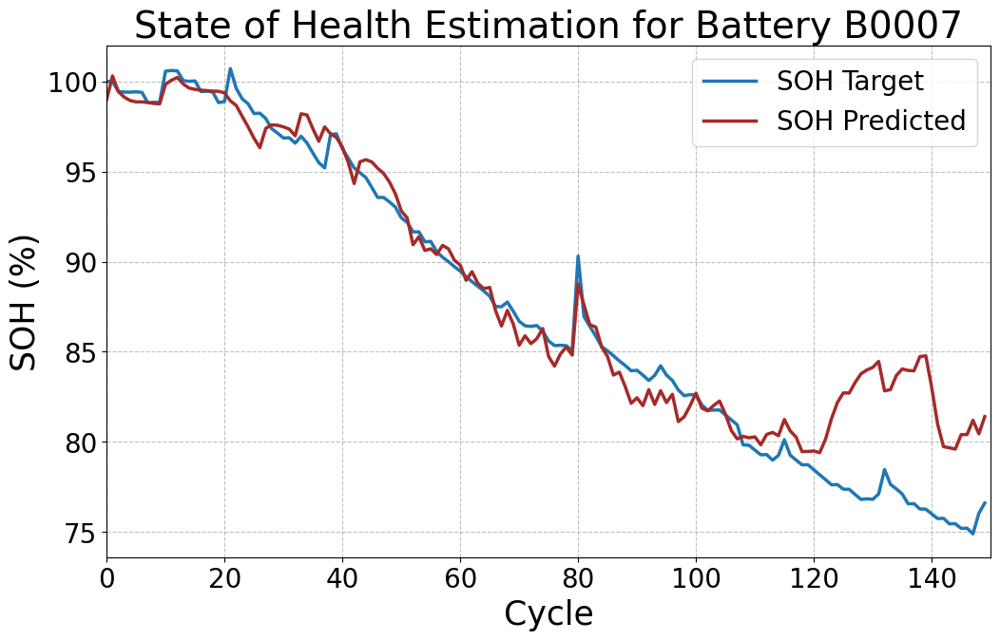

In [246]:
plot_soh(original_y_target_B0007_discharge_std, original_y_testresult_B0007_discharge_std, "State of Health Estimation for Battery B0007", file_name="B0007_discharge_std")

Model 23 - B0007 - Robust Scaler - Discharging Data

c:\Users\jawaher.alhaj\AppData\Local\anaconda3\envs\myenv\lib\site-packages\torch\nn\modules\rnn.py:83: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.5 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
c:\Users\jawaher.alhaj\OneDrive - Technology Innovation Institute\Desktop\Dissertation\Nasa Battery Dataset\Single Battery Model\analysis.py:20: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\b\abs_8f7uhuge1i\croot\pytorch-select_1717607507421\work\aten\src\ATen\native\ReduceOps.cpp:1807.)
  target_std = torch.std(targets)


Epoch 1/120, Training Loss: 0.0894, Validation Loss: 0.0705
Validation Distance: 0.2774, Validation Accuracy: 0.0000, SNR: 1.5710
##Metrics##:
MAE : 0.19110196828842163
MSE : 0.0650738850235939
RMSE : 0.4451920986175537
R-squared : -inf
Count: 26
Epoch 2/120, Training Loss: 0.0246, Validation Loss: 0.0364
Validation Distance: 0.1898, Validation Accuracy: 0.0000, SNR: 4.2614
##Metrics##:
MAE : 0.12427716702222824
MSE : 0.03023759461939335
RMSE : 0.35940587520599365
R-squared : -inf
Count: 26
Epoch 3/120, Training Loss: 0.0157, Validation Loss: 0.0458
Validation Distance: 0.2079, Validation Accuracy: 9.5238, SNR: 3.2751
##Metrics##:
MAE : 0.1325913965702057
MSE : 0.04171369597315788
RMSE : 0.36995670199394226
R-squared : -inf
Count: 26
Epoch 4/120, Training Loss: 0.0065, Validation Loss: 0.0445
Validation Distance: 0.2082, Validation Accuracy: 4.7619, SNR: 3.5352
##Metrics##:
MAE : 0.13506978750228882
MSE : 0.04145922139286995
RMSE : 0.3777163624763489
R-squared : -inf
Count: 26
Epoch 5/

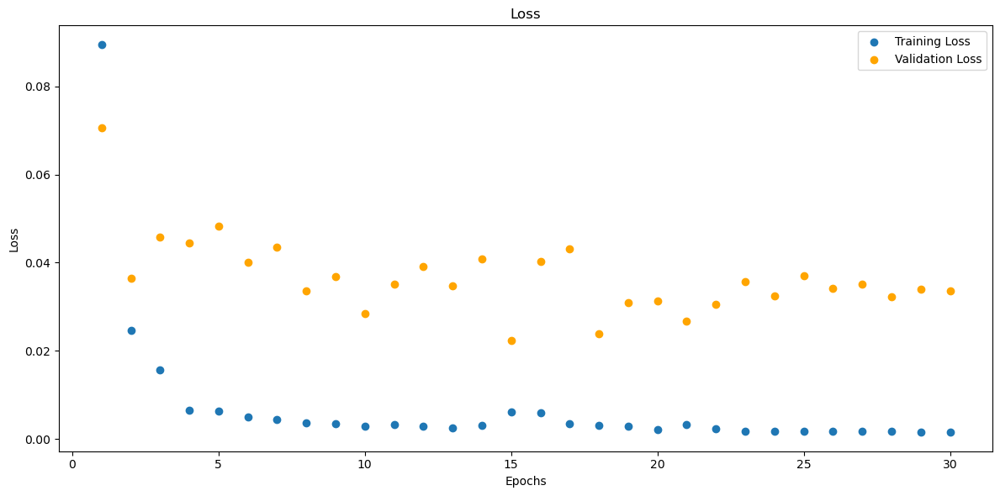

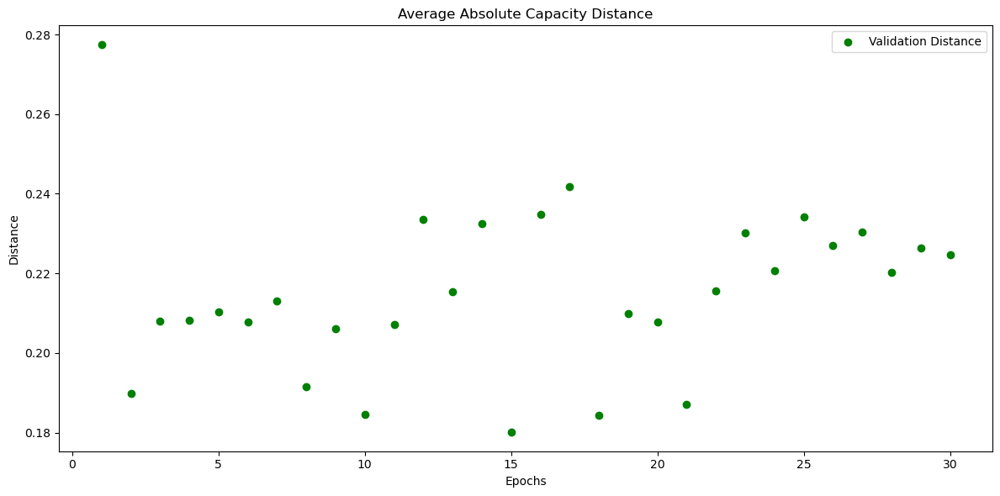

In [247]:
# B0007_discharge_rob
model_B0007_discharge_rob = LSTM_2(input_shape=input_shape_single)
model_B0007_discharge_rob, train_losses_B0007_discharge_rob, val_losses_B0007_discharge_rob, val_distances_B0007_discharge_rob, metrics_history_B0007_discharge_rob = train(data_loaders['B0007_discharge_rob_val_loader'], data_loaders['B0007_discharge_rob_train_loader'], model_B0007_discharge_rob)
torch.save(model_B0007_discharge_rob, os.path.join(folder_name, 'model_B0007_discharge_rob.pth'))

Test Loss: 0.1152, Test Distance: 0.3275, Test Accuracy: 0.0000, SNR: 5.1381
##Metrics##:
MAE : 0.3248797357082367
MSE : 0.11117502301931381
RMSE : 0.5755570530891418
R-squared : -inf
Count: 21


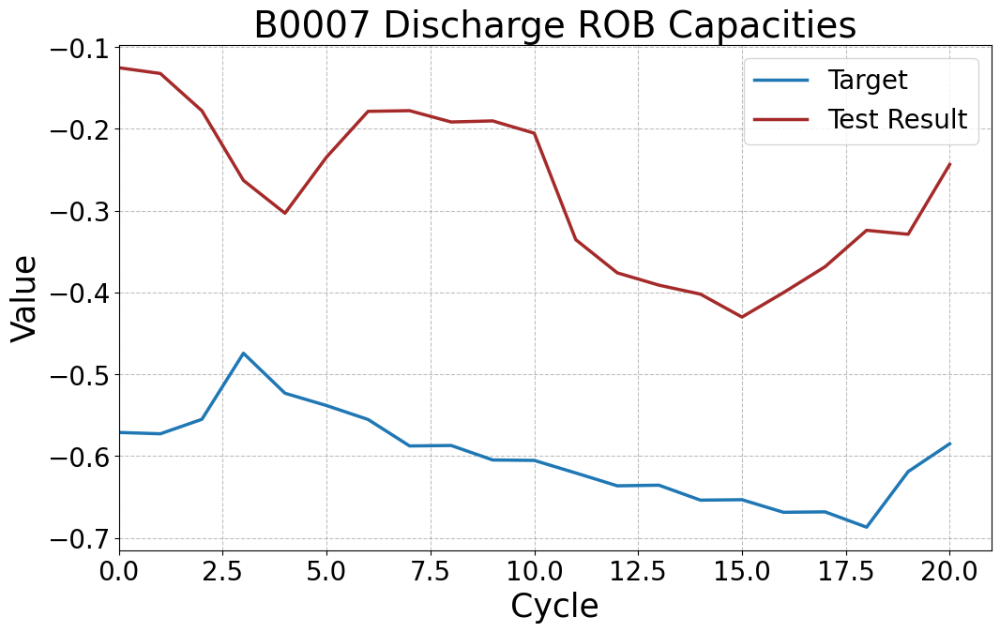

In [248]:
# B0007_discharge_rob
model_B0007_discharge_rob = torch.load('6. LSTM Models/model_B0007_discharge_rob.pth')
y_target_B0007_discharge_rob, y_testresult_B0007_discharge_rob = test(model_B0007_discharge_rob, data_loaders['B0007_discharge_rob_test_loader'])
y_target_B0007_discharge_rob = flatten_and_concatenate(y_target_B0007_discharge_rob)
y_testresult_B0007_discharge_rob = flatten_and_concatenate(y_testresult_B0007_discharge_rob)
plot_tensors(y_target_B0007_discharge_rob, y_testresult_B0007_discharge_rob, labels=["Target", "Test Result"], title="B0007 Discharge ROB Capacities")


Test on complete dataset.

In [249]:
# Run the test on the model
y_target_B0007_discharge_rob, y_testresult_B0007_discharge_rob = test(model_B0007_discharge_rob, data_loaders['B0007_discharge_rob_final_test_loader'])

# Flatten and concatenate the results
y_target_B0007_discharge_rob = flatten_and_concatenate(y_target_B0007_discharge_rob)
y_testresult_B0007_discharge_rob = flatten_and_concatenate(y_testresult_B0007_discharge_rob)

# # Assuming scaler_y_discharge_B0007 was used for normalization earlier
# # Inverse the normalization process for both target and prediction
# original_y_target_B0007_discharge_rob = scaler_y_dis_rob_B0007.inverse_transform(y_target_B0007_discharge_rob.numpy().reshape(-1, 1))
# original_y_testresult_B0007_discharge_rob = scaler_y_dis_rob_B0007.inverse_transform(y_testresult_B0007_discharge_rob.numpy().reshape(-1, 1))

# # Convert the numpy arrays back to tensors
# original_y_target_B0007_discharge_rob = torch.tensor(original_y_target_B0007_discharge_rob)
# original_y_testresult_B0007_discharge_rob = torch.tensor(original_y_testresult_B0007_discharge_rob)

# # Plot the inverse transformed results
# plot_tensors(original_y_target_B0007_discharge_rob, original_y_testresult_B0007_discharge_rob, labels=["Target", "LSTM Result"], title="Capacity Estimation for Battery B0007", file_name="B0007_discharge_rob", ylabel="Capacity (Ah)", save_dir="11. LSTM Capacity Plots")


Test Loss: 0.0228, Test Distance: 0.1034, Test Accuracy: 6.0000, SNR: 10.3192
##Metrics##:
MAE : 0.1033618301153183
MSE : 0.02350597456097603
RMSE : 0.32994362711906433
R-squared : -70.62810516357422
Count: 150


SOH Plot.

In [250]:
# plot_soh(original_y_target_B0007_discharge_rob, original_y_testresult_B0007_discharge_rob, "State of Health Estimation for Battery B0007", file_name="B0007_discharge_rob")

Model 24 - B0007 - MinMax Scaler - Combined Data

c:\Users\jawaher.alhaj\AppData\Local\anaconda3\envs\myenv\lib\site-packages\torch\nn\modules\rnn.py:83: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.5 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
c:\Users\jawaher.alhaj\OneDrive - Technology Innovation Institute\Desktop\Dissertation\Nasa Battery Dataset\Single Battery Model\analysis.py:20: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\b\abs_8f7uhuge1i\croot\pytorch-select_1717607507421\work\aten\src\ATen\native\ReduceOps.cpp:1807.)
  target_std = torch.std(targets)


Epoch 1/120, Training Loss: 0.1461, Validation Loss: 0.0437
Validation Distance: 0.2384, Validation Accuracy: 0.0000, SNR: -5.6740
##Metrics##:
MAE : 0.19011880457401276
MSE : 0.04487507790327072
RMSE : 0.43624716997146606
R-squared : -inf
Count: 26
Epoch 2/120, Training Loss: 0.0163, Validation Loss: 0.0226
Validation Distance: 0.1759, Validation Accuracy: 0.0000, SNR: -2.8147
##Metrics##:
MAE : 0.14063222706317902
MSE : 0.024598557502031326
RMSE : 0.3752734661102295
R-squared : -inf
Count: 26
Epoch 3/120, Training Loss: 0.0057, Validation Loss: 0.0081
Validation Distance: 0.0992, Validation Accuracy: 0.0000, SNR: 1.4390
##Metrics##:
MAE : 0.07880803942680359
MSE : 0.00780037697404623
RMSE : 0.2812306582927704
R-squared : -inf
Count: 26
Epoch 4/120, Training Loss: 0.0039, Validation Loss: 0.0061
Validation Distance: 0.0753, Validation Accuracy: 0.0000, SNR: 2.5419
##Metrics##:
MAE : 0.059654269367456436
MSE : 0.004498298745602369
RMSE : 0.24476036429405212
R-squared : -inf
Count: 26
E

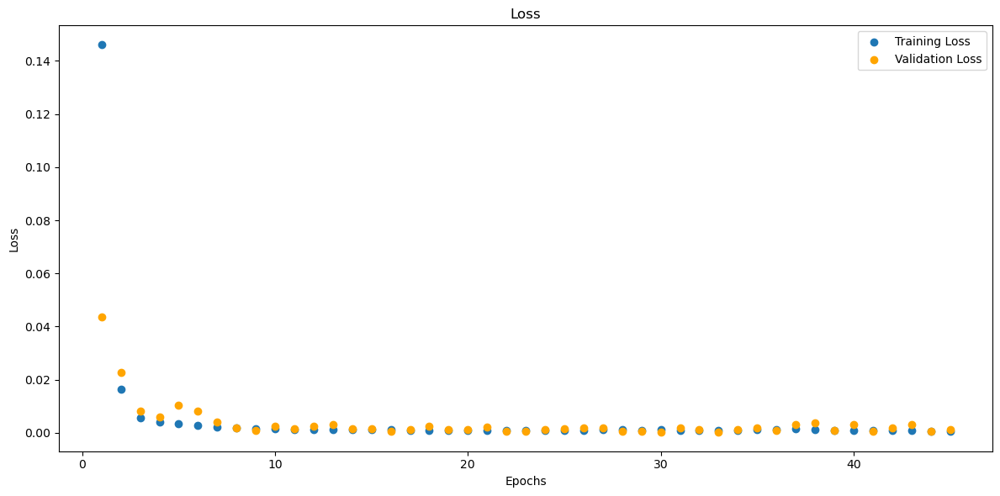

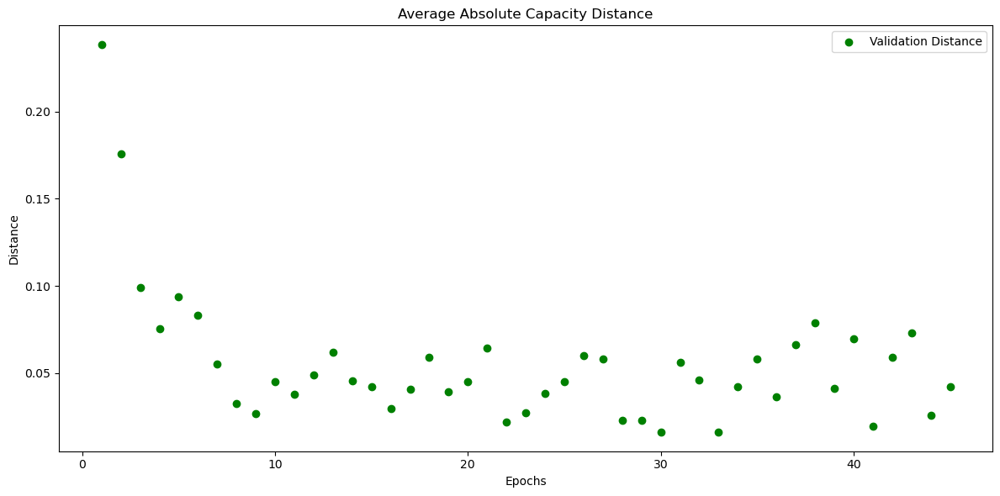

In [394]:
# B0007_combined_mm
model_B0007_combined_mm = LSTM_2(input_shape=input_shape_combined)
model_B0007_combined_mm, train_losses_B0007_combined_mm, val_losses_B0007_combined_mm, val_distances_B0007_combined_mm, metrics_history_B0007_combined_mm = train(data_loaders['B0007_combined_mm_val_loader'], data_loaders['B0007_combined_mm_train_loader'], model_B0007_combined_mm)
torch.save(model_B0007_combined_mm, os.path.join(folder_name, 'model_B0007_combined_mm.pth'))

Test Loss: 0.0007, Test Distance: 0.0271, Test Accuracy: 4.7619, SNR: 5.0402
##Metrics##:
MAE : 0.02986503206193447
MSE : 0.0013200384564697742
RMSE : 0.18022003769874573
R-squared : -inf
Count: 21


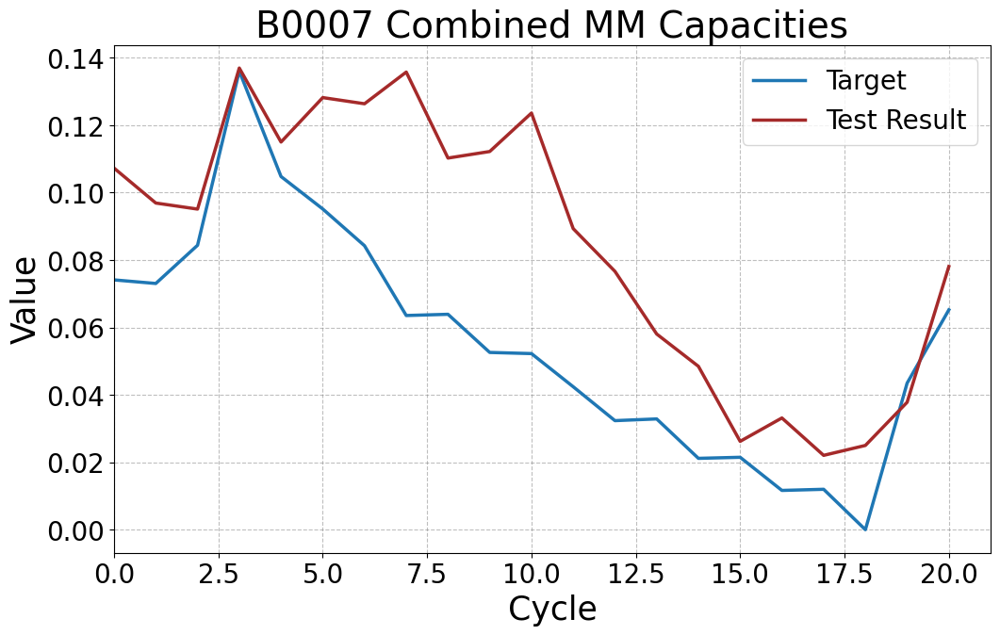

In [395]:
# B0007_combined_mm
model_B0007_combined_mm = torch.load('6. LSTM Models/model_B0007_combined_mm.pth')
y_target_B0007_combined_mm, y_testresult_B0007_combined_mm = test(model_B0007_combined_mm, data_loaders['B0007_combined_mm_test_loader'])
y_target_B0007_combined_mm = flatten_and_concatenate(y_target_B0007_combined_mm)
y_testresult_B0007_combined_mm = flatten_and_concatenate(y_testresult_B0007_combined_mm)
plot_tensors(y_target_B0007_combined_mm, y_testresult_B0007_combined_mm, labels=["Target", "Test Result"], title="B0007 Combined MM Capacities")


Test on complete dataset.

Test Loss: 0.0007, Test Distance: 0.0166, Test Accuracy: 46.0000, SNR: 28.1117
##Metrics##:
MAE : 0.01655176840722561
MSE : 0.0005189317162148654
RMSE : 0.13950155675411224
R-squared : -2.2778360843658447
Count: 150


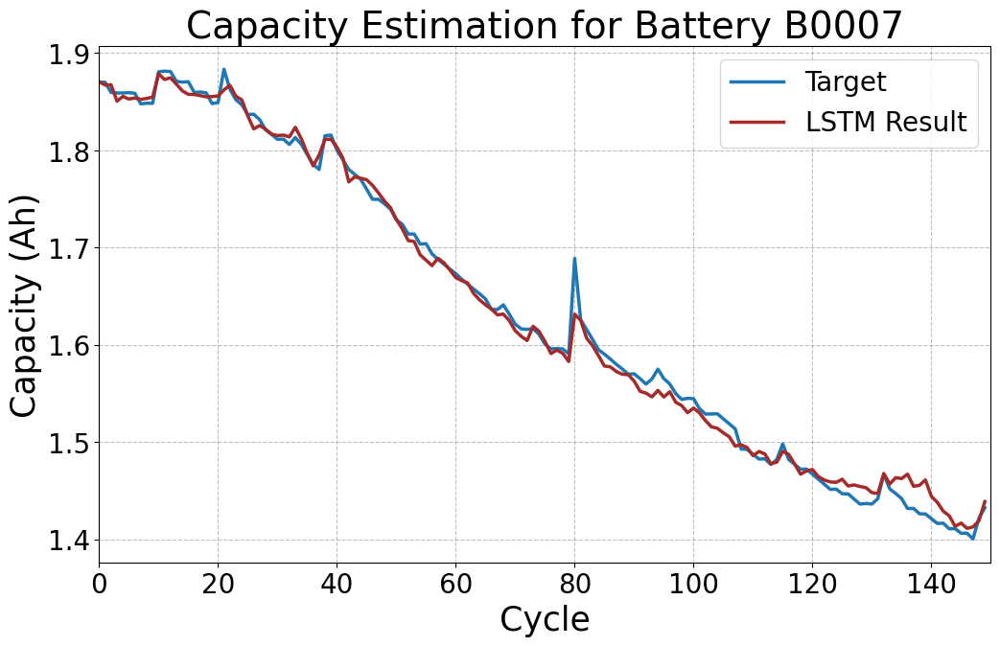

In [396]:
# Run the test on the model
y_target_B0007_combined_mm, y_testresult_B0007_combined_mm = test(model_B0007_combined_mm, data_loaders['B0007_combined_mm_final_test_loader'])

# Flatten and concatenate the results
y_target_B0007_combined_mm = flatten_and_concatenate(y_target_B0007_combined_mm)
y_testresult_B0007_combined_mm = flatten_and_concatenate(y_testresult_B0007_combined_mm)

# Assuming scaler_y_combined_B0007 was used for normalization earlier
# Inverse the normalization process for both target and prediction
original_y_target_B0007_combined_mm = scaler_y_comb_mm_B0007.inverse_transform(y_target_B0007_combined_mm.numpy().reshape(-1, 1))
original_y_testresult_B0007_combined_mm = scaler_y_comb_mm_B0007.inverse_transform(y_testresult_B0007_combined_mm.numpy().reshape(-1, 1))

# Convert the numpy arrays back to tensors
original_y_target_B0007_combined_mm = torch.tensor(original_y_target_B0007_combined_mm)
original_y_testresult_B0007_combined_mm = torch.tensor(original_y_testresult_B0007_combined_mm)

# Plot the inverse transformed results
plot_tensors(original_y_target_B0007_combined_mm, original_y_testresult_B0007_combined_mm, labels=["Target", "LSTM Result"], title="Capacity Estimation for Battery B0007", file_name="B0007_combined_mm", ylabel="Capacity (Ah)", save_dir="11. LSTM Capacity Plots")

SOH Plot.

C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_23676\540638711.py:20: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_target_tensor = torch.tensor(soh_target)
C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_23676\540638711.py:21: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_predicted_tensor = torch.tensor(soh_predicted)


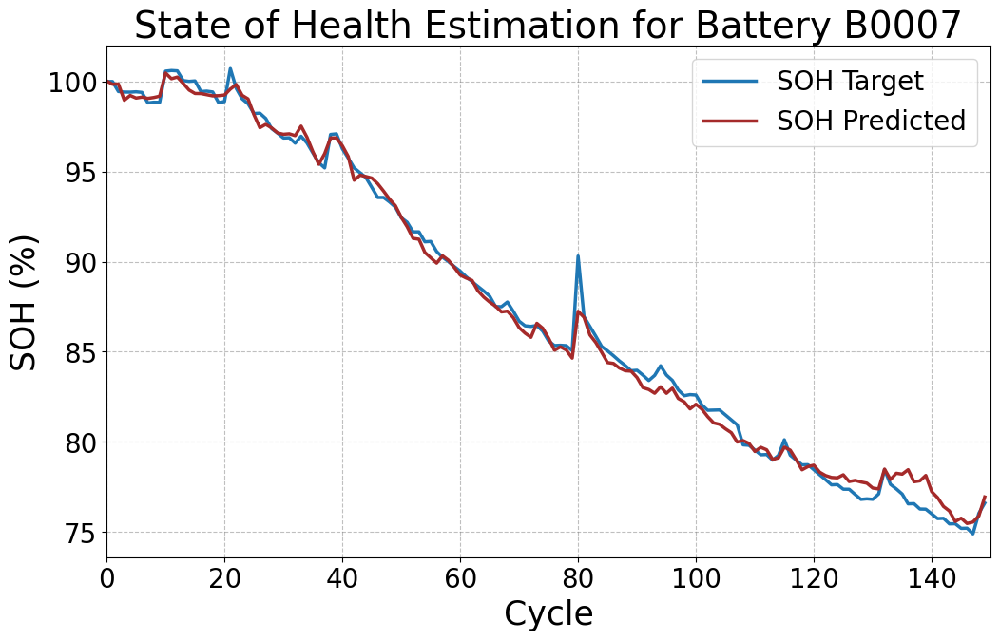

In [397]:
plot_soh(original_y_target_B0007_combined_mm, original_y_testresult_B0007_combined_mm, "State of Health Estimation for Battery B0007", file_name="B0007_combined_mm")

Model 25 - B0007 - Standard Scaler - Combined Data

c:\Users\jawaher.alhaj\AppData\Local\anaconda3\envs\myenv\lib\site-packages\torch\nn\modules\rnn.py:83: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.5 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
c:\Users\jawaher.alhaj\OneDrive - Technology Innovation Institute\Desktop\Dissertation\Nasa Battery Dataset\Single Battery Model\analysis.py:20: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\b\abs_8f7uhuge1i\croot\pytorch-select_1717607507421\work\aten\src\ATen\native\ReduceOps.cpp:1807.)
  target_std = torch.std(targets)


Epoch 1/120, Training Loss: 0.2338, Validation Loss: 0.1273
Validation Distance: 0.4054, Validation Accuracy: 0.0000, SNR: 7.4417
##Metrics##:
MAE : 0.29107314348220825
MSE : 0.1211204081773758
RMSE : 0.5473987460136414
R-squared : -inf
Count: 26
Epoch 2/120, Training Loss: 0.0405, Validation Loss: 0.2722
Validation Distance: 0.6033, Validation Accuracy: 0.0000, SNR: 4.9596
##Metrics##:
MAE : 0.4587380290031433
MSE : 0.26935553550720215
RMSE : 0.6788945198059082
R-squared : -inf
Count: 26
Epoch 3/120, Training Loss: 0.0169, Validation Loss: 0.2286
Validation Distance: 0.5315, Validation Accuracy: 0.0000, SNR: 5.3746
##Metrics##:
MAE : 0.39899858832359314
MSE : 0.2074030488729477
RMSE : 0.6337584853172302
R-squared : -inf
Count: 26
Epoch 4/120, Training Loss: 0.0118, Validation Loss: 0.1966
Validation Distance: 0.4967, Validation Accuracy: 0.0000, SNR: 5.9362
##Metrics##:
MAE : 0.3718799352645874
MSE : 0.181227445602417
RMSE : 0.6123207211494446
R-squared : -inf
Count: 26
Epoch 5/120, T

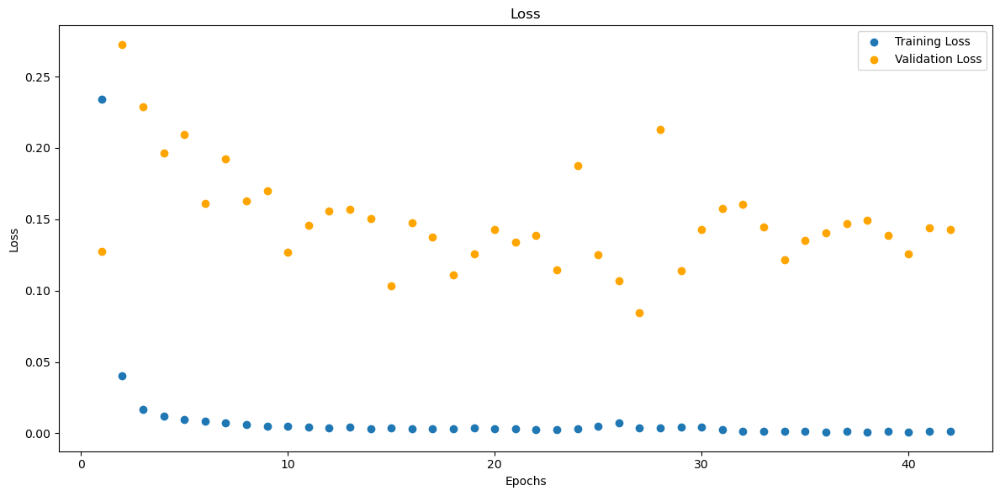

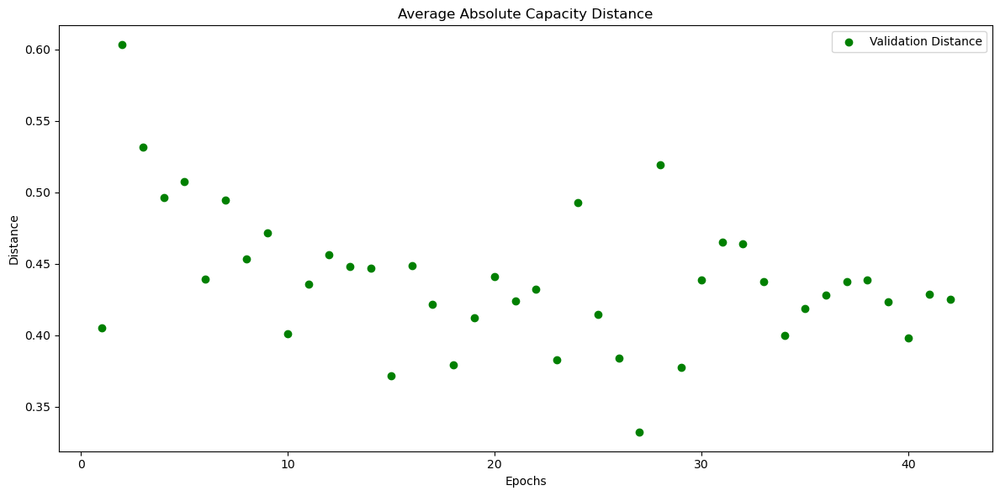

In [398]:
# B0007_combined_std
model_B0007_combined_std = LSTM_2(input_shape=input_shape_combined)
model_B0007_combined_std, train_losses_B0007_combined_std, val_losses_B0007_combined_std, val_distances_B0007_combined_std, metrics_history_B0007_combined_std = train(data_loaders['B0007_combined_std_val_loader'], data_loaders['B0007_combined_std_train_loader'], model_B0007_combined_std)
torch.save(model_B0007_combined_std, os.path.join(folder_name, 'model_B0007_combined_std.pth'))

Test Loss: 0.2872, Test Distance: 0.5458, Test Accuracy: 0.0000, SNR: 7.3640
##Metrics##:
MAE : 0.5628645420074463
MSE : 0.33656224608421326
RMSE : 0.7513196468353271
R-squared : -inf
Count: 21


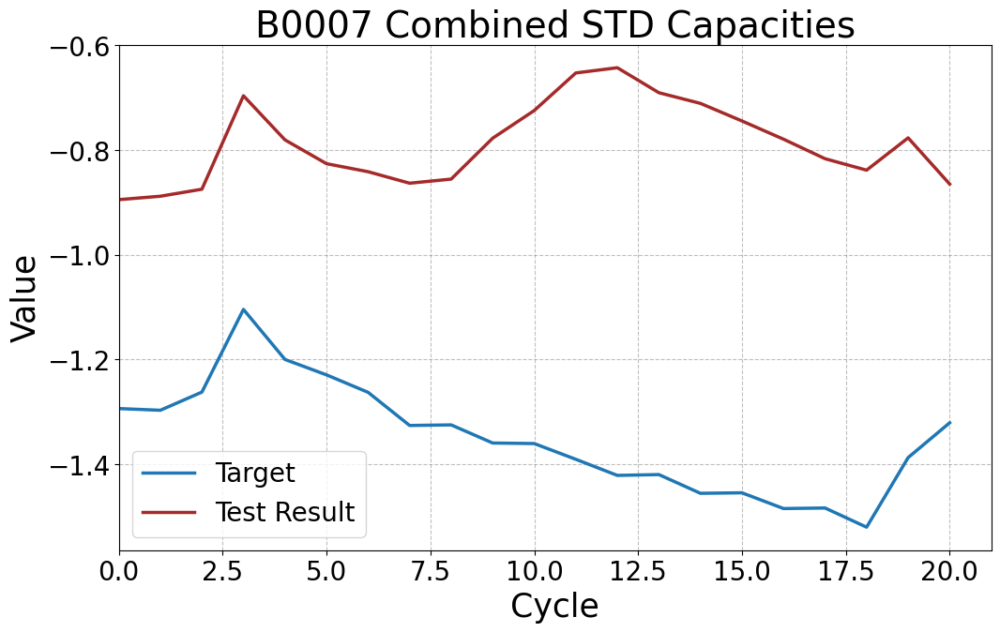

In [399]:
# B0007_combined_std
model_B0007_combined_std = torch.load('6. LSTM Models/model_B0007_combined_std.pth')
y_target_B0007_combined_std, y_testresult_B0007_combined_std = test(model_B0007_combined_std, data_loaders['B0007_combined_std_test_loader'])
y_target_B0007_combined_std = flatten_and_concatenate(y_target_B0007_combined_std)
y_testresult_B0007_combined_std = flatten_and_concatenate(y_testresult_B0007_combined_std)
plot_tensors(y_target_B0007_combined_std, y_testresult_B0007_combined_std, labels=["Target", "Test Result"], title="B0007 Combined STD Capacities")


Test on complete dataset.

Test Loss: 0.0501, Test Distance: 0.1568, Test Accuracy: 20.0000, SNR: 11.7160
##Metrics##:
MAE : 0.15675030648708344
MSE : 0.06408898532390594
RMSE : 0.4002728760242462
R-squared : -59.711700439453125
Count: 150


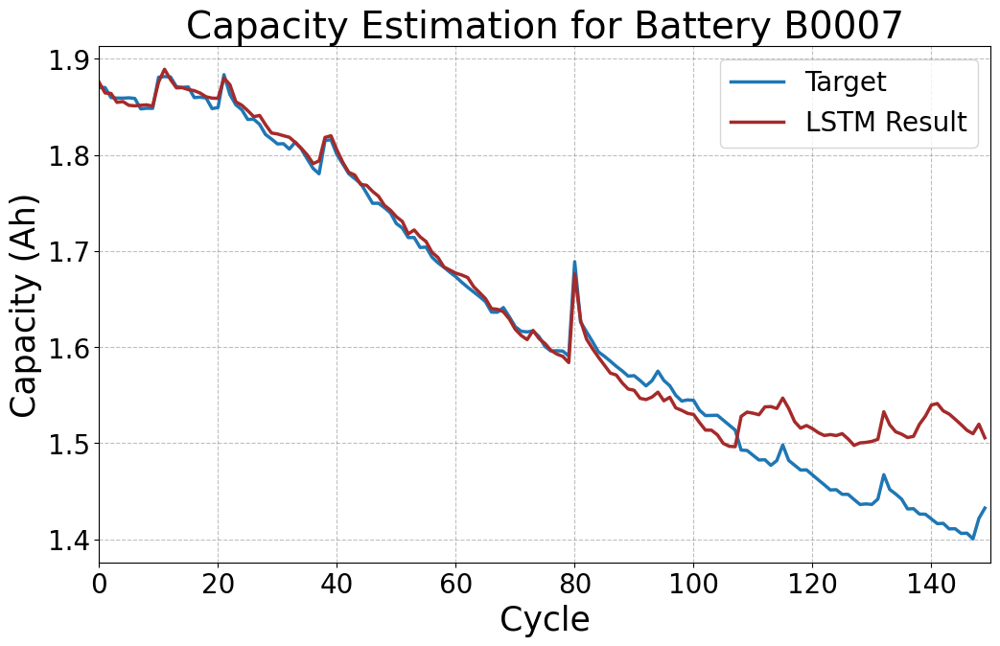

In [400]:
# Run the test on the model
y_target_B0007_combined_std, y_testresult_B0007_combined_std = test(model_B0007_combined_std, data_loaders['B0007_combined_std_final_test_loader'])

# Flatten and concatenate the results
y_target_B0007_combined_std = flatten_and_concatenate(y_target_B0007_combined_std)
y_testresult_B0007_combined_std = flatten_and_concatenate(y_testresult_B0007_combined_std)

# Assuming scaler_y_combined_B0007 was used for normalization earlier
# Inverse the normalization process for both target and prediction
original_y_target_B0007_combined_std = scaler_y_comb_std_B0007.inverse_transform(y_target_B0007_combined_std.numpy().reshape(-1, 1))
original_y_testresult_B0007_combined_std = scaler_y_comb_std_B0007.inverse_transform(y_testresult_B0007_combined_std.numpy().reshape(-1, 1))

# Convert the numpy arrays back to tensors
original_y_target_B0007_combined_std = torch.tensor(original_y_target_B0007_combined_std)
original_y_testresult_B0007_combined_std = torch.tensor(original_y_testresult_B0007_combined_std)

# Plot the inverse transformed results
plot_tensors(original_y_target_B0007_combined_std, original_y_testresult_B0007_combined_std, labels=["Target", "LSTM Result"], title="Capacity Estimation for Battery B0007", file_name="B0007_combined_std", ylabel="Capacity (Ah)", save_dir="11. LSTM Capacity Plots")


SOH Plot.

C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_23676\540638711.py:20: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_target_tensor = torch.tensor(soh_target)
C:\Users\jawaher.alhaj\AppData\Local\Temp\ipykernel_23676\540638711.py:21: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  soh_predicted_tensor = torch.tensor(soh_predicted)


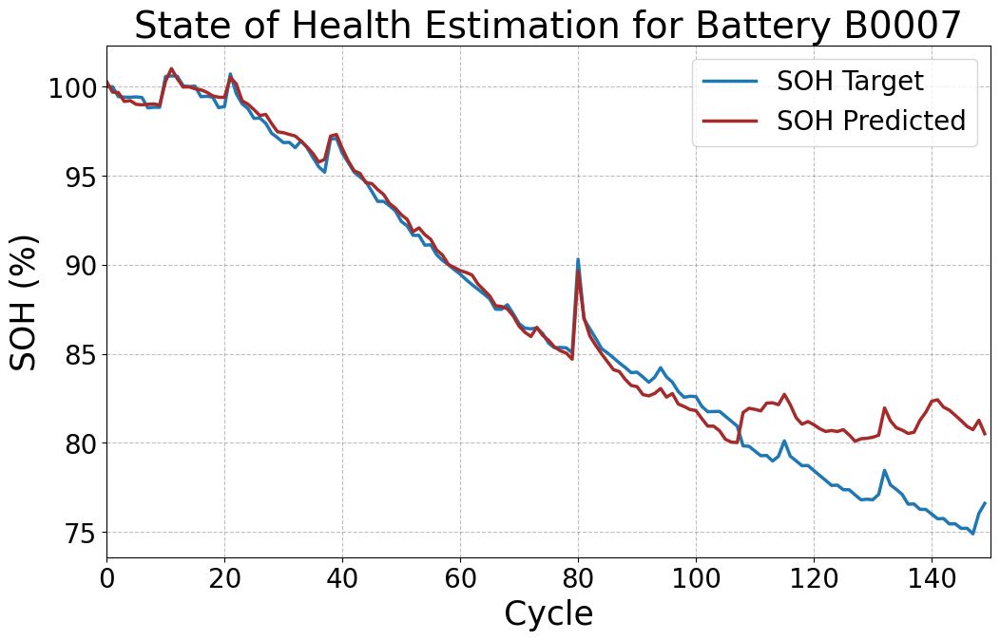

In [401]:
plot_soh(original_y_target_B0007_combined_std, original_y_testresult_B0007_combined_std, "State of Health Estimation for Battery B0007", file_name="B0007_combined_std")

Model 26 - B0007 - Robust Scaler - Combined Data

c:\Users\jawaher.alhaj\AppData\Local\anaconda3\envs\myenv\lib\site-packages\torch\nn\modules\rnn.py:83: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.5 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
c:\Users\jawaher.alhaj\OneDrive - Technology Innovation Institute\Desktop\Dissertation\Nasa Battery Dataset\Single Battery Model\analysis.py:20: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\b\abs_8f7uhuge1i\croot\pytorch-select_1717607507421\work\aten\src\ATen\native\ReduceOps.cpp:1807.)
  target_std = torch.std(targets)


Epoch 1/120, Training Loss: 0.0877, Validation Loss: 0.0444
Validation Distance: 0.1302, Validation Accuracy: 0.0000, SNR: 7.5183
##Metrics##:
MAE : 0.10616330802440643
MSE : 0.018230412155389786
RMSE : 0.33837899565696716
R-squared : -inf
Count: 26
Epoch 2/120, Training Loss: 0.0113, Validation Loss: 0.0246
Validation Distance: 0.1444, Validation Accuracy: 4.7619, SNR: 8.7387
##Metrics##:
MAE : 0.11460460722446442
MSE : 0.019291412085294724
RMSE : 0.3473065495491028
R-squared : -inf
Count: 26
Epoch 3/120, Training Loss: 0.0042, Validation Loss: 0.0115
Validation Distance: 0.1151, Validation Accuracy: 9.5238, SNR: 9.9346
##Metrics##:
MAE : 0.08128038048744202
MSE : 0.011358115822076797
RMSE : 0.29296520352363586
R-squared : -inf
Count: 26
Epoch 4/120, Training Loss: 0.0028, Validation Loss: 0.0160
Validation Distance: 0.1402, Validation Accuracy: 0.0000, SNR: 8.2471
##Metrics##:
MAE : 0.09734459221363068
MSE : 0.016353990882635117
RMSE : 0.31770527362823486
R-squared : -inf
Count: 26
E

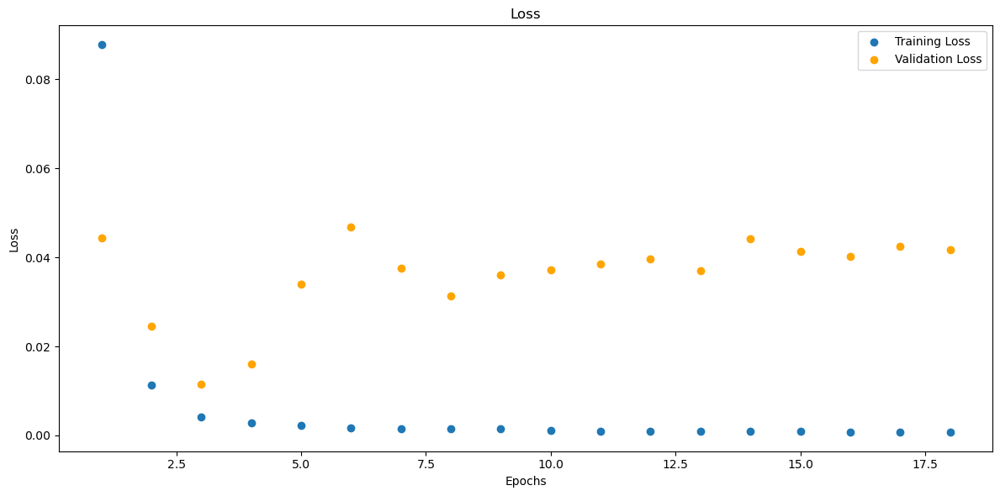

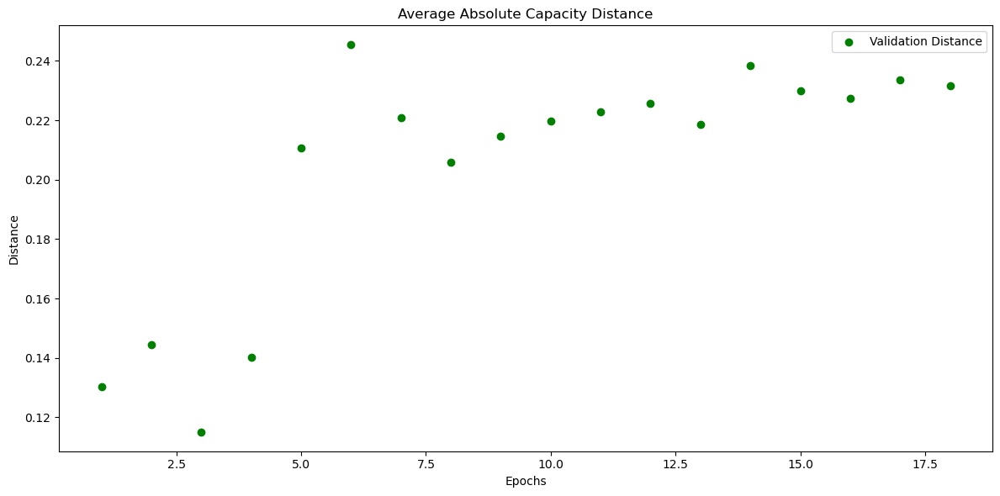

In [259]:
# B0007_combined_rob
model_B0007_combined_rob = LSTM_2(input_shape=input_shape_combined)
model_B0007_combined_rob, train_losses_B0007_combined_rob, val_losses_B0007_combined_rob, val_distances_B0007_combined_rob, metrics_history_B0007_combined_rob = train(data_loaders['B0007_combined_rob_val_loader'], data_loaders['B0007_combined_rob_train_loader'], model_B0007_combined_rob)
torch.save(model_B0007_combined_rob, os.path.join(folder_name, 'model_B0007_combined_rob.pth'))

Test Loss: 0.0364, Test Distance: 0.2052, Test Accuracy: 0.0000, SNR: 9.3660
##Metrics##:
MAE : 0.20094315707683563
MSE : 0.041996102780103683
RMSE : 0.45093658566474915
R-squared : -inf
Count: 21


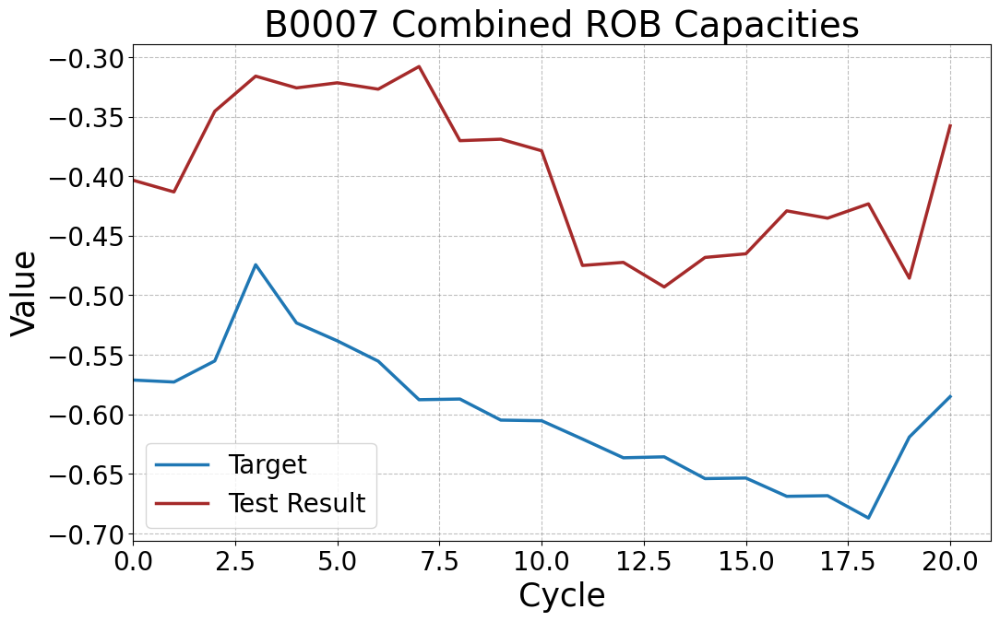

In [260]:
# B0007_combined_rob
model_B0007_combined_rob = torch.load('6. LSTM Models/model_B0007_combined_rob.pth')
y_target_B0007_combined_rob, y_testresult_B0007_combined_rob = test(model_B0007_combined_rob, data_loaders['B0007_combined_rob_test_loader'])
y_target_B0007_combined_rob = flatten_and_concatenate(y_target_B0007_combined_rob)
y_testresult_B0007_combined_rob = flatten_and_concatenate(y_testresult_B0007_combined_rob)
plot_tensors(y_target_B0007_combined_rob, y_testresult_B0007_combined_rob, labels=["Target", "Test Result"], title="B0007 Combined ROB Capacities")


Test on complete dataset.

In [261]:
# Run the test on the model
y_target_B0007_combined_rob, y_testresult_B0007_combined_rob = test(model_B0007_combined_rob, data_loaders['B0007_combined_rob_final_test_loader'])

# Flatten and concatenate the results
y_target_B0007_combined_rob = flatten_and_concatenate(y_target_B0007_combined_rob)
y_testresult_B0007_combined_rob = flatten_and_concatenate(y_testresult_B0007_combined_rob)

# # Assuming scaler_y_combined_B0007 was used for normalization earlier
# # Inverse the normalization process for both target and prediction
# original_y_target_B0007_combined_rob = scaler_y_comb_rob_B0007.inverse_transform(y_target_B0007_combined_rob.numpy().reshape(-1, 1))
# original_y_testresult_B0007_combined_rob = scaler_y_comb_rob_B0007.inverse_transform(y_testresult_B0007_combined_rob.numpy().reshape(-1, 1))

# # Convert the numpy arrays back to tensors
# original_y_target_B0007_combined_rob = torch.tensor(original_y_target_B0007_combined_rob)
# original_y_testresult_B0007_combined_rob = torch.tensor(original_y_testresult_B0007_combined_rob)

# # Plot the inverse transformed results
# plot_tensors(original_y_target_B0007_combined_rob, original_y_testresult_B0007_combined_rob, labels=["Target", "LSTM Result"], title="Capacity Estimation for Battery B0007", file_name="B0007_combined_rob", ylabel="Capacity (Ah)", save_dir="11. LSTM Capacity Plots")


Test Loss: 0.0086, Test Distance: 0.0696, Test Accuracy: 20.0000, SNR: 14.2014
##Metrics##:
MAE : 0.06956945359706879
MSE : 0.009615210816264153
RMSE : 0.2725427448749542
R-squared : -25.96270751953125
Count: 150


SOH Plot.

In [262]:
# plot_soh(original_y_target_B0007_combined_rob, original_y_testresult_B0007_combined_rob, "State of Health Estimation for Battery B0007", file_name="B0007_combined_rob")

SAVE SOH DATA

In [402]:
# Ensure the arrays are 1-dimensional
b0005_target = original_y_target_B0005_combined_mm.flatten()
b0006_target = original_y_target_B0006_combined_mm.flatten()
b0007_target = original_y_target_B0007_combined_mm.flatten()

b0005_predicted_lstm = original_y_testresult_B0005_combined_mm.flatten()
b0006_predicted_lstm = original_y_testresult_B0006_combined_mm.flatten()
b0007_predicted_lstm = original_y_testresult_B0007_combined_mm.flatten()

# Calculate SOH
b0005_C = b0005_target[0]  # max capacity
b0006_C = b0006_target[0]  # max capacity
b0007_C = b0007_target[0]  # max capacity

b0005_soh_target = (b0005_target / b0005_C) * 100
b0006_soh_target = (b0006_target / b0006_C) * 100
b0007_soh_target = (b0007_target / b0007_C) * 100


b0005_soh_predicted_lstm = (b0005_predicted_lstm / b0005_C) * 100
b0006_soh_predicted_lstm = (b0006_predicted_lstm / b0006_C) * 100
b0007_soh_predicted_lstm = (b0007_predicted_lstm / b0007_C) * 100

save_dir = "15. Results"

# Create the directory if it doesn't exist
if not os.path.exists(save_dir):
    os.makedirs(save_dir)

# Save the tensors to the specified directory
torch.save(b0005_soh_target, os.path.join(save_dir, 'b0005_soh_target.pt'))
torch.save(b0005_soh_predicted_lstm, os.path.join(save_dir, 'b0005_soh_predicted_lstm.pt'))
torch.save(b0006_soh_predicted_lstm, os.path.join(save_dir, 'b0006_soh_predicted_lstm.pt'))
torch.save(b0007_soh_predicted_lstm, os.path.join(save_dir, 'b0007_soh_predicted_lstm.pt'))
